<a href="https://colab.research.google.com/github/aldrich1221/GNNforStockPrediction/blob/main/RNNmeetGNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

The notebook is a program of stock prediction using a hybrid method of GNN and RNN.






The Data is fetched from Yahoo Finance API and Quandl Finance API
and its period is from 2016-01-01 to 2017-12-31



# Install Package



In [ ]:
!pip install quandl
!pip install torch
!pip install --no-index torch-scatter -f https://pytorch-geometric.com/whl/torch-1.7.0+cu101.html
!pip install --no-index torch-sparse -f https://pytorch-geometric.com/whl/torch-1.7.0+cu101.html
!pip install --no-index torch-cluster -f https://pytorch-geometric.com/whl/torch-1.7.0+cu101.html
#!pip install --no-index torch-spline-conv -f https://pytorch-geometric.com/whl/torch-1.7.0+cu101.html
!pip install torch-geometric
!pip install networkx
!pip install matplotlib
!pip install numpy
!pip install sklearn
!pip install arch
!pip install tushare
!pip install pyflux
!pip install sklearn
!pip install apyori


Looking in links: https://pytorch-geometric.com/whl/torch-1.7.0+cu101.html
Looking in links: https://pytorch-geometric.com/whl/torch-1.7.0+cu101.html
Looking in links: https://pytorch-geometric.com/whl/torch-1.7.0+cu101.html


# import Packages

In [ ]:
import pandas as pd
import numpy as np
import quandl, datetime
from sklearn.preprocessing import MinMaxScaler
from sklearn import preprocessing
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
from torch_scatter import scatter_add
import math
from sklearn.preprocessing import normalize
import time
import torch.nn.functional as F
from torch_geometric.datasets import Planetoid

from torch_geometric.nn import MessagePassing,TopKPooling
from torch_geometric.utils import add_self_loops, degree,remove_self_loops
import networkx as nx

import matplotlib.pyplot as plt
from torch_geometric.data import Data
from torch_geometric.nn import FastRGCNConv,GMMConv,GCN2Conv,GATConv




# Parameter Setting


In [ ]:
StoragePath="/content/drive/MyDrive/MyCoLabStorage/GraphNeuralNetworkData"

API_Key="NJB8FEA7zxkhzwHsj5Z7"

TestDays=100
MovingWindowSize=20
NormalizeDays=200

# Get Data File

In [ ]:
def columnsRename(data):
  if 'Bid Average' in data.columns:
    data.rename(columns={'Bid Average': 'Value'}, inplace=True)
  if 'Close' in data.columns:
    data.rename(columns={'Close': 'Value'}, inplace=True)
  if 'Last' in data.columns:
    data.rename(columns={'Last': 'Value'}, inplace=True)
  if '5 YR' in data.columns:
    data.rename(columns={'5 YR': 'Value'}, inplace=True)
  if 'Short Volume' in data.columns:
    data.rename(columns={'Short Volume': 'Value'}, inplace=True)
  return data  
def ExploreMissingValue(trainData_0):
    missing=pd.concat([trainData_0.isnull().any(),trainData_0.count()],axis=1)
    column=['miss or not','count']
    
    missing=pd.DataFrame(list(missing.values),index=list(missing.index),columns=column)
    max=missing['count'].max()
    missing['missing count']=max-missing['count']
    missing['missing ratio']=missing['missing count']/max
    miss=missing[missing['count'] < max]
    print(miss)
    return missing
def FillNullWithMedian(DataFrame,missing):
  for col in DataFrame.columns:
    NullIndex=np.where(np.array(DataFrame[col].isnull()))[0]
    
    Median=np.nanmedian(DataFrame[col])
    
    DataFrame[col][NullIndex]=Median
    
    return np.array(missing.index[missing['miss or not']==True])  ##return the index with missing value

In [ ]:

APISymbolListFromYahoo=['OXY','CVX','XOM','COP','SLB','EOG','PSX','MPC','KMI','WMB','PXD','VER','ORA','FSLR','CEN','BLX']
SymbolListFromYahoo=['OXY','CVX','XOM','COP','SLB','EOG','PSX','MPC','KMI','WMB','PXD','VER','ORA','FSLR','CEN','BLX']

APISymbolListFromQuandl=['PERTH/GOLD_USD_D','PERTH/SLVR_USD_D','CHRIS/CME_CL1','CHRIS/CME_ES1','EURONEXT/RDSA','CHRIS/CME_S1','CHRIS/CME_C1','CHRIS/CME_W1']
SymbolListFromQuandl=['GLD','Silver','Oil','S&P500','RDSA','SOYB','CORN','WHEAT']

SymbolList=SymbolListFromYahoo+SymbolListFromQuandl
APISymbolList=APISymbolListFromYahoo+APISymbolListFromQuandl


AllDataFrame=pd.DataFrame()
Nornalizerlist=[]
for symbol in SymbolList:
  dataFrame=pd.read_csv(StoragePath+"/allStockRawData/"+symbol+".csv")
  
  dataFrame=columnsRename(dataFrame)
  columnPrice=symbol+"_Value"
  
  check_for_nan_price = dataFrame['Value'].isnull()
 

  dataFrame['Value'][check_for_nan_price]=np.median(dataFrame['Value'])
 
  NoNullDataFrame=dataFrame['Value'][~check_for_nan_price]
 
  transformer = preprocessing.Normalizer().fit([NoNullDataFrame[:NormalizeDays]])

  # Not do normalize
  dataFrame['Value'][~check_for_nan_price]=transformer.transform([dataFrame['Value'][~check_for_nan_price]])[0]
  
  
  Nornalizerlist.append(transformer)

  
  AllDataFrame[columnPrice]=dataFrame['Value']
  AllDataFrame[symbol+"_MA"+str(MovingWindowSize)]=AllDataFrame[columnPrice].rolling(window=MovingWindowSize).mean()
AllDataFrame=AllDataFrame[MovingWindowSize:].reset_index(drop=True)
print(AllDataFrame.head(MovingWindowSize+5))



/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:30: SettingWithCopyWarning: 
A value is trying to b

    OXY_Value  OXY_MA20  CVX_Value  ...  CORN_MA20  WHEAT_Value  WHEAT_MA20
0    0.043068  0.041845   0.034457  ...   0.045155     0.048977    0.048701
1    0.044811  0.041832   0.035891  ...   0.045267     0.049054    0.048786
2    0.044054  0.041883   0.035963  ...   0.045360     0.048643    0.048841
3    0.043061  0.041923   0.035153  ...   0.045439     0.047950    0.048835
4    0.043535  0.042022   0.036472  ...   0.045472     0.047231    0.048731
5    0.042897  0.042153   0.035170  ...   0.045529     0.047025    0.048669
6    0.043186  0.042308   0.035221  ...   0.045556     0.047256    0.048569
7    0.043541  0.042498   0.035199  ...   0.045581     0.047051    0.048466
8    0.044107  0.042599   0.036234  ...   0.045590     0.047051    0.048409
9    0.044732  0.042771   0.035971  ...   0.045584     0.047616    0.048361
10   0.046455  0.043072   0.037456  ...   0.045581     0.048181    0.048343
11   0.046231  0.043423   0.036786  ...   0.045559     0.047462    0.048295
12   0.04621

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:30: SettingWithCopyWarning: 
A value is trying to b

# Exploratory data analysis

Empty DataFrame
Columns: [miss or not, count, missing count, missing ratio]
Index: []


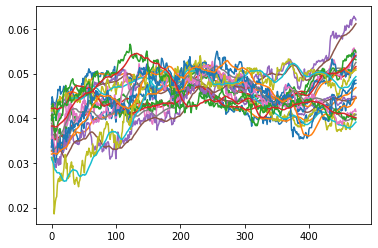

,OXY_Value,OXY_MA20,CVX_Value,CVX_MA20,XOM_Value,XOM_MA20,COP_Value,COP_MA20,SLB_Value,SLB_MA20,EOG_Value,EOG_MA20,PSX_Value,PSX_MA20,MPC_Value,MPC_MA20,KMI_Value,KMI_MA20,WMB_Value,WMB_MA20,PXD_Value,PXD_MA20,VER_Value,VER_MA20,ORA_Value,ORA_MA20,FSLR_Value,FSLR_MA20,CEN_Value,CEN_MA20,BLX_Value,BLX_MA20,GLD_Value,GLD_MA20,Silver_Value,Silver_MA20,Oil_Value,Oil_MA20,S&P500_Value,S&P500_MA20,RDSA_Value,RDSA_MA20,SOYB_Value,SOYB_MA20,CORN_Value,CORN_MA20,WHEAT_Value,WHEAT_MA20
count,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000
mean,0.044965,0.044855,0.045207,0.044873,0.045115,0.045036,0.044993,0.044674,0.045005,0.045009,0.045180,0.044792,0.044987,0.044743,0.044421,0.043972,0.045240,0.045076,0.044715,0.044327,0.045130,0.044851,0.045050,0.045008,0.045001,0.044497,0.042587,0.042527,0.045142,0.045018,0.045135,0.044949,0.044635,0.044515,0.044709,0.044587,0.043983,0.043392,0.044666,0.044366,0.044426,0.044123,0.044800,0.044708,0.044599,0.044661,0.044635,0.044490
std,0.003692,0.003573,0.003577,0.003608,0.002108,0.002087,0.004385,0.004066,0.004168,0.004043,0.004852,0.004910,0.003252,0.002833,0.008052,0.007560,0.004140,0.004248,0.008145,0.008186,0.005455,0.005562,0.004279,0.004183,0.006860,0.006986,0.011634,0.011288,0.004541,0.004503,0.003221,0.003211,0.001725,0.001758,0.003263,0.003216,0.006107,0.006072,0.003801,0.003766,0.003242,0.003253,0.002817,0.002726,0.002619,0.002355,0.003159,0.002566
min,0.038226,0.039366,0.034457,0.035206,0.039874,0.040620,0.031599,0.033714,0.037042,0.037856,0.032378,0.032567,0.039496,0.040950,0.028890,0.031174,0.032085,0.032844,0.018587,0.025896,0.030085,0.031976,0.036733,0.038053,0.029767,0.029768,0.024831,0.025669,0.027932,0.033067,0.033742,0.035578,0.039838,0.038872,0.036756,0.036220,0.025795,0.026997,0.035812,0.036832,0.034621,0.034826,0.038661,0.039374,0.037567,0.039929,0.037266,0.039444
25%,0.041705,0.041796,0.043173,0.043056,0.043662,0.043707,0.042592,0.042096,0.041231,0.040844,0.041667,0.041180,0.042620,0.042563,0.037486,0.036654,0.041647,0.041524,0.039909,0.037094,0.041687,0.041251,0.042412,0.042330,0.039047,0.037985,0.032974,0.032394,0.042225,0.042206,0.044061,0.043975,0.043578,0.043702,0.042934,0.042991,0.040860,0.041189,0.041708,0.041369,0.042223,0.041828,0.043158,0.043204,0.043056,0.043133,0.042582,0.042787
50%,0.045118,0.045225,0.045008,0.044742,0.044490,0.044387,0.044535,0.044308,0.045691,0.046071,0.045977,0.045928,0.043809,0.043638,0.046165,0.046244,0.044830,0.044801,0.048174,0.048387,0.045164,0.044718,0.043639,0.043720,0.046124,0.045549,0.041763,0.041663,0.045839,0.045917,0.045829,0.045830,0.044670,0.044606,0.044400,0.044235,0.044103,0.043632,0.044436,0.044326,0.044321,0.044285,0.044605,0.044448,0.044455,0.044914,0.044072,0.043986
75%,0.048288,0.047838,0.047926,0.047523,0.046649,0.046602,0.048670,0.047925,0.048344,0.048279,0.048396,0.048119,0.046715,0.046339,0.049721,0.049702,0.049036,0.049039,0.050297,0.050091,0.050150,0.050248,0.047783,0.047771,0.050201,0.050200,0.047276,0.047308,0.047891,0.047446,0.047203,0.046941,0.045612,0.045448,0.046363,0.046088,0.048238,0.047120,0.047749,0.047682,0.046575,0.046126,0.046346,0.046173,0.045901,0.045812,0.046736,0.046726
max,0.051594,0.050620,0.053433,0.051570,0.050849,0.049992,0.055735,0.052492,0.052854,0.051720,0.054483,0.051821,0.055295,0.054022,0.062839,0.061163,0.053162,0.051563,0.053994,0.052266,0.055005,0.052920,0.056583,0.054521,0.056655,0.055532,0.069041,0.066183,0.055415,0.053889,0.050398,0.048752,0.048392,0.047589,0.053353,0.051921,0.057792,0.056436,0.052884,0.051799,0.05

In [356]:
def ExploreMissingValue(trainData_0):
    missing=pd.concat([trainData_0.isnull().any(),trainData_0.count()],axis=1)
    column=['miss or not','count']
    
    missing=pd.DataFrame(list(missing.values),index=list(missing.index),columns=column)
    max=missing['count'].max()
    missing['missing count']=max-missing['count']
    missing['missing ratio']=missing['missing count']/max
    miss=missing[missing['count'] < max]
    print(miss)
    
    return np.array(missing.index[missing['miss or not']==True])  ##return the index with missing value
def FillNullWithMedian(DataFrame):
  for col in DataFrame.columns:
    NullIndex=np.where(np.array(DataFrame[col].isnull()))[0]
    
    Median=np.nanmedian(DataFrame[col])
    
    DataFrame[col][NullIndex]=Median

FillNullWithMedian(AllDataFrame)   
ExploreMissingValue(AllDataFrame)


for icol in range(int(len(AllDataFrame.columns)/2)):
  
   plt.plot(AllDataFrame[AllDataFrame.columns[icol]])
plt.show()

AllDataFrame.describe()

# Functions of data pre-processing

In [ ]:
def Split_Train_Test(AllDataFrame,TestDays,day):
  TotalDataLengh=len(AllDataFrame)
  trainIndex_x=np.zeros(TotalDataLengh,dtype=bool)
  trainIndex_y=np.zeros(TotalDataLengh,dtype=bool)
  testIndex_x=np.zeros(TotalDataLengh,dtype=bool)
  testIndex_y=np.zeros(TotalDataLengh,dtype=bool)

  trainIndex_x[day:TotalDataLengh-(TestDays-day)-1]=True
  trainIndex_y[TotalDataLengh-(TestDays-day)-1]=True
  testIndex_x[day+1:TotalDataLengh-(TestDays-day)]=True
  testIndex_y[TotalDataLengh-(TestDays-day)]=True

  train_x=AllDataFrame[trainIndex_x]
  test_x=AllDataFrame[testIndex_x]

  train_y=AllDataFrame[trainIndex_y]
  test_y=AllDataFrame[testIndex_y]

  return train_x,train_y,test_x,test_y

def toTensor(x):

  x = torch.tensor(np.array(x), dtype=torch.float)
  return x
def outputColumn(AllDataFrame):
  NewDataFrame=pd.DataFrame()
  for symbol in SymbolList:
    
    columnValue=symbol+"_Value"
    
    NewDataFrame[columnValue]=AllDataFrame[columnValue]
  return NewDataFrame


In [357]:
def makeBatch(dataframe,batchwindow):
  if torch.is_tensor(dataframe):

    data_raw = dataframe.detach().numpy() # convert to numpy array
  else:
    data_raw = dataframe.to_numpy()
  data = []
    
    # create all possible sequences of length seq_len
  for index in range(len(data_raw) - batchwindow): 
      data.append(data_raw[index: index + batchwindow])
  
  
  
  
  return torch.tensor(data,dtype=torch.float)



# Functions of edge generation


1.Pearson correlation
2.AssociationAnalysis
3.Human label

In [ ]:
AssociationPara=[0.1,0.1,1.7,0.01]
Corr=0.75

def generateEdge(train_x):
  
  NoMADataFrame=pd.DataFrame()
  for symbol in SymbolList:
    NoMADataFrame[symbol+"_Value"]=train_x[symbol+"_Value"]
  StartEdge=[]
  EndEdge=[]
  StartEdge,EndEdge=PersonCorrelation(NoMADataFrame,StartEdge,EndEdge)
  StartEdge,EndEdge=AssociationAnalysis(NoMADataFrame,StartEdge,EndEdge,True)

  
  edge_index = torch.tensor([StartEdge,
                          EndEdge], dtype=torch.long)
  return edge_index




def PersonCorrelation(NoMADataFrame,StartEdge,EndEdge):
  CorrDataFrame=NoMADataFrame.corr(method ='pearson')
 

  StartEdgeCorr=np.where(np.array(CorrDataFrame)>Corr )[0]
  EndEdgeCorr=np.where(np.array(CorrDataFrame)>Corr)[1]
  
  

  for i in range(len(StartEdgeCorr)):
    if StartEdgeCorr[i]!=EndEdgeCorr[i]:
      StartEdge.append(StartEdgeCorr[i])
      EndEdge.append(EndEdgeCorr[i])
  return StartEdge,EndEdge

def AssociationAnalysis(AllDailyReturnFrame_AssociationAnalysis,StartEdgeCorr,EndEdgeCorr,GoAssociationAnalysis):
  if GoAssociationAnalysis==False:
    return [],[]
  from apyori import apriori
  import pandas as pd
  
  AllData=[]
  for date in AllDailyReturnFrame_AssociationAnalysis.index:
    DateData=AllDailyReturnFrame_AssociationAnalysis.loc[date]
    UpData=[]
    NoChangeData=[]
    DownData=[]
    for eachSymbol in DateData.index:
      if DateData[eachSymbol]>AssociationPara[3]:
        
        UpData.append(eachSymbol.split('_')[0])
        
      elif DateData[eachSymbol]<AssociationPara[3]:
        DownData.append(eachSymbol.split('_')[0])
      else:
        NoChangeData.append(eachSymbol.split('_')[0])
    
    
    AllData.append(UpData)
    #AllData.append(NoChangeData)
    AllData.append(DownData)
    
  
  data = AllData


  
  association_rules = apriori(data, min_support=AssociationPara[0], min_confidence=AssociationPara[1], min_lift=AssociationPara[2], max_length=2) 
  association_results = list(association_rules)

 
  for eachResult in association_results:
    resultitems=list(eachResult.items)
    item1Index=np.where(np.array(SymbolList)==resultitems[0])[0]
    item2Index=np.where(np.array(SymbolList)==resultitems[1])[0]
    # print("Add",item1Index,item2Index)
    if len(item1Index)>0:
      if len(item2Index)>0:
        StartEdgeCorr.append(item1Index[0])
        EndEdgeCorr.append(item2Index[0])
    if len(item1Index)>0:
      if len(item2Index)>0:
        StartEdgeCorr.append(item2Index[0])
        EndEdgeCorr.append(item1Index[0])
    #print(product) # ex. RelationRecord(items=frozenset({'Basketball', 'Socks'}), support=0.25, ordered_statistics=[OrderedStatistic(items_base=frozenset({'Basketball'}), items_add=frozenset({'Socks'}), confidence=0.5, lift=2.0), OrderedStatistic(items_base=frozenset({'Socks'}), items_add=frozenset({'Basketball'}), confidence=1.0, lift=2.0)])
    product=eachResult
    pair = eachResult[0] 
    ##print(pair) ## ex. frozenset({'Basketball', 'Socks'})
    products = [x for x in pair]
    # print(products) # ex. ['Basketball', 'Socks']
    # print("Rule: " + products[0] + " →→   " + products[1])
    # print("Support: " + str(product[1]))
    # print("Lift: " + str(product[2][0][3]))
   

  print(len(EndEdgeCorr))
 
  return StartEdgeCorr,EndEdgeCorr



# Functions of graph drawing



In [ ]:
def graphDrawing(edge_index,dataframe,symbols):
    import matplotlib.pyplot as plt
    import networkx as nx
    dataframe=outputColumn(dataframe)
    labels=dataframe.diff()/dataframe
    
    labels=labels.tail(1)
    labels[labels<0.01]=1
    labels[labels>-0.01]=1

    labels[labels>=0.01]=2
    labels[labels<=-0.01]=0
    print("labels",labels)
    

    print("labels",labels)
    edges_raw = edge_index.numpy()
    edges = [(x, y) for x, y in zip(edges_raw[0, :], edges_raw[1, :])]
    labels = labels
    labelsDict={}
    for i in range(len(symbols)):
      labelsDict[i]=symbols[i]
    
    
    G = nx.Graph()
    G.add_nodes_from(list(range(len(symbols))))
    G.add_edges_from(edges)
    plt.subplot(111)
    options = {
                'node_size': 50,
                'width': 0.6,
    }
    with_labels=True
    if len(symbols)>30:
      with_labels=False
    values = np.array(labels)

    # actual code
    colorLeft = np.array([112, 224, 112])
    colorRight = np.array([224, 112, 112])
    scaled = MinMaxScaler().fit_transform(values.reshape(-1, 1))
    colors = np.array([a * colorRight + (1 - a) * colorLeft for a in scaled], dtype = np.int64)
    nx.draw(G, with_labels=with_labels,labels=labelsDict, node_color=colors/255, cmap=plt.cm.tab10, font_weight='bold', **options)
    
    # fig.canvas.mpl_connect("motion_notify_event", hover)

    plt.show()
  


# Model definition and hyperparameter setting

In [ ]:
##hyper parameter
NumberOfFeatures=len(AllDataFrame.columns)
NumberOfOutput=len(SymbolList)
input_dim = NumberOfFeatures
hidden_dim = 32
num_layers = 2
output_dim = NumberOfOutput
num_epochs = 200



In [ ]:
class MyGNN(MessagePassing):
    def __init__(self, in_channels, out_channels,havabias):
        super(MyGNN, self).__init__(aggr='add') 
        self.weight1=torch.nn.Parameter(torch.Tensor(in_channels, 16))
        self.weight2 = torch.nn.Parameter(torch.Tensor(16, out_channels))
        self.bias1 = torch.nn.Parameter(torch.Tensor(16))
        self.bias2= torch.nn.Parameter(torch.Tensor(out_channels))
          
        if havabias:
            self.bias = torch.nn.Parameter(torch.Tensor(out_channels))
        else:
            self.register_parameter('bias', None)
            

        if self.weight1 is not None:
          stdv = math.sqrt(3.0 / (self.weight1.size(-2) + self.weight1.size(-1)))
          self.weight1.data.normal_(-stdv, stdv)
        if self.weight2 is not None:
          stdv = math.sqrt(3.0 / (self.weight2.size(-2) + self.weight2.size(-1)))
          self.weight2.data.normal_(-stdv, stdv)
        
        if self.bias1 is not None:
          self.bias1.data.fill_(0)
        if self.bias2 is not None:
          self.bias2.data.fill_(0)
        if self.bias is not None:
          self.bias1.data.fill_(0)
          
    def forward(self, x, edge_index):
        edge_index, _ = add_self_loops(edge_index, num_nodes=x.size(0))
        
        x = torch.matmul(x, self.weight1)+self.bias1  ##fully connected layer1
        x=F.relu(x)
        x = torch.matmul(x, self.weight2)+self.bias2  ##fully connected layer2
       

        row, col = edge_index
        deg = degree(row, x.size(0), dtype=x.dtype)
        
        deg_inv_sqrt = deg.pow(-0.5)
        norm = deg_inv_sqrt[row] * deg_inv_sqrt[col]
        return self.propagate(edge_index, size=(x.size(0), x.size(0)), x=x,
                              norm=norm)
    def message(self, x_j, norm):
        return norm.view(-1, 1) * x_j


class LSTM(torch.nn.Module):
    def __init__(self, input_dim, hidden_dim, num_layers, output_dim):
        super(LSTM, self).__init__()
        self.hidden_dim = hidden_dim
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_dim, hidden_dim, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)
    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_dim).requires_grad_()
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_dim).requires_grad_()
        out, (hn, cn) = self.lstm(x, (h0.detach(), c0.detach()))
        out = self.fc(out[:, -1, :]) 
        
        
        return out
 
class Network_RNN(torch.nn.Module):
    def __init__(self, input_dim, hidden_dim, num_layers, output_dim):
        super(Network_RNN, self).__init__()
        
        self.lstm = LSTM(input_dim=input_dim, hidden_dim=hidden_dim, output_dim=output_dim, num_layers=num_layers)
        self.linear=nn.Linear(output_dim,output_dim)
        
    def forward(self, x):
        
        out = self.lstm(x)
        out=F.relu(out)
        out=self.linear(out)
        out=F.relu(out)
        
        out=self.linear(out)
      

        return out[-1,:]

class Network_RNNplusGNN(torch.nn.Module):
    def __init__(self, input_dim, hidden_dim, num_layers, output_dim,edge_index):
        super(Network_RNNplusGNN, self).__init__()
        self.edge_index=edge_index

        self.lstm1 = LSTM(input_dim=input_dim, hidden_dim=hidden_dim, output_dim=input_dim, num_layers=num_layers)
        self.linear1=nn.Linear(input_dim,256)
        self.linear2=nn.Linear(256, output_dim)
        
        self.conv1 = MyGNN(output_dim, 256,havabias=False)
        self.leakyrelu=torch.nn.LeakyReLU(0.01)
        self.conv2 = MyGNN(256,output_dim,havabias=True)
        self.lstm2 = LSTM(input_dim=output_dim, hidden_dim=hidden_dim, output_dim=input_dim, num_layers=num_layers)
        self.linear3=nn.Linear(input_dim,output_dim)

    def forward(self, x):
        
        x = self.lstm1(x)
        #print("After LSTM1,",x.size())
        x=self.linear1(x)
        #print("After linear1,",x.size())
        x=self.linear2(x)
        #print("After linear2,",x.size())
        x = self.conv1(x, self.edge_index)
        #print("After conv1",x.size())
        x= self.leakyrelu(x)
        x = F.dropout(x, training=self.training)
        x = self.conv2(x, self.edge_index)

        #print("After conv2",x.size())
        x=makeBatch(x,11)
        x = self.lstm2(x)
        x=self.linear3(x)

        

        return x[-1,:]



# Training

-------data prepare-------
628
labels      OXY_Value  CVX_Value  XOM_Value  ...  SOYB_Value  CORN_Value  WHEAT_Value
372        2.0        2.0        2.0  ...         2.0         2.0          2.0

[1 rows x 24 columns]
labels      OXY_Value  CVX_Value  XOM_Value  ...  SOYB_Value  CORN_Value  WHEAT_Value
372        2.0        2.0        2.0  ...         2.0         2.0          2.0

[1 rows x 24 columns]


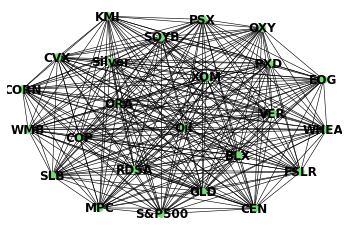

-------model initialization-------
-------Training begin-------
day 0  Epoch  0 Training MSE:  0.017636369913816452


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 0  Epoch  20 Training MSE:  9.042738383868709e-05
day 0  Epoch  40 Training MSE:  1.0024570656241849e-05
day 0  Epoch  60 Training MSE:  6.8391914282983635e-06
day 0  Epoch  80 Training MSE:  3.111350963536097e-07
-------Testing begin-------
day 0  Test MSE:  1.1823591421489255e-06
Test Data Truth:  tensor([[0.0409, 0.0467, 0.0429, 0.0452, 0.0408, 0.0450, 0.0464, 0.0525, 0.0464,
         0.0516, 0.0374, 0.0440, 0.0501, 0.0452, 0.0452, 0.0433, 0.0444, 0.0428,
         0.0433, 0.0485, 0.0438, 0.0454, 0.0466, 0.0494]])
Test Data prediction tensor([0.0413, 0.0471, 0.0437, 0.0433, 0.0427, 0.0454, 0.0454, 0.0508, 0.0476,
        0.0526, 0.0367, 0.0453, 0.0505, 0.0457, 0.0456, 0.0440, 0.0458, 0.0435,
        0.0418, 0.0494, 0.0448, 0.0452, 0.0483, 0.0504],
       grad_fn=<SliceBackward>)
day 0  Training time: 7.707076787948608
=================================Day  0 ======================================
-------data prepare-------
626
labels      OXY_Value  CVX_Value  XOM_Value  ...  SOYB

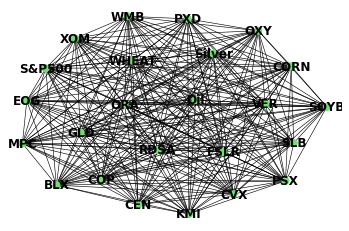

-------model initialization-------
-------Training begin-------
day 1  Epoch  0 Training MSE:  0.014044084586203098


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 1  Epoch  20 Training MSE:  4.122790778637864e-05
day 1  Epoch  40 Training MSE:  5.4875686146260705e-06
day 1  Epoch  60 Training MSE:  9.92289642454125e-07
day 1  Epoch  80 Training MSE:  6.902810696374218e-07
-------Testing begin-------
day 1  Test MSE:  3.2128681937138026e-07
Test Data Truth:  tensor([[0.0407, 0.0466, 0.0429, 0.0448, 0.0402, 0.0447, 0.0461, 0.0516, 0.0463,
         0.0517, 0.0359, 0.0438, 0.0501, 0.0458, 0.0448, 0.0433, 0.0442, 0.0426,
         0.0434, 0.0484, 0.0435, 0.0451, 0.0461, 0.0489]])
Test Data prediction tensor([0.0410, 0.0464, 0.0431, 0.0454, 0.0408, 0.0450, 0.0466, 0.0524, 0.0461,
        0.0520, 0.0374, 0.0438, 0.0502, 0.0452, 0.0455, 0.0436, 0.0446, 0.0430,
        0.0429, 0.0488, 0.0437, 0.0456, 0.0470, 0.0497],
       grad_fn=<SliceBackward>)
day 1  Training time: 7.731217622756958
=================================Day  1 ======================================
-------data prepare-------
626
labels      OXY_Value  CVX_Value  XOM_Value  ...  SOYB_V

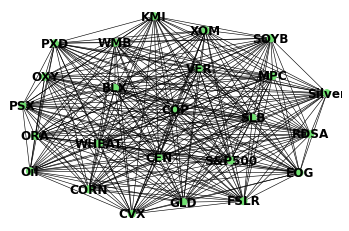

-------model initialization-------
-------Training begin-------
day 2  Epoch  0 Training MSE:  0.014578689821064472


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 2  Epoch  20 Training MSE:  6.187727558426559e-05
day 2  Epoch  40 Training MSE:  8.36782874102937e-06
day 2  Epoch  60 Training MSE:  8.287517516691878e-07
day 2  Epoch  80 Training MSE:  3.217355413198675e-07
-------Testing begin-------
day 2  Test MSE:  9.527792030894489e-07
Test Data Truth:  tensor([[0.0404, 0.0468, 0.0427, 0.0452, 0.0396, 0.0454, 0.0461, 0.0512, 0.0454,
         0.0508, 0.0374, 0.0439, 0.0497, 0.0451, 0.0429, 0.0435, 0.0447, 0.0434,
         0.0425, 0.0485, 0.0432, 0.0435, 0.0455, 0.0473]])
Test Data prediction tensor([0.0394, 0.0468, 0.0430, 0.0462, 0.0404, 0.0444, 0.0452, 0.0520, 0.0469,
        0.0525, 0.0367, 0.0442, 0.0500, 0.0459, 0.0445, 0.0433, 0.0447, 0.0428,
        0.0445, 0.0484, 0.0432, 0.0452, 0.0464, 0.0481],
       grad_fn=<SliceBackward>)
day 2  Training time: 7.73806619644165
=================================Day  2 ======================================
-------data prepare-------
622
labels      OXY_Value  CVX_Value  XOM_Value  ...  SOYB_Valu

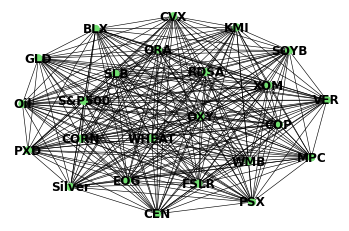

-------model initialization-------
-------Training begin-------
day 3  Epoch  0 Training MSE:  0.01674114540219307


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 3  Epoch  20 Training MSE:  4.764087134390138e-05
day 3  Epoch  40 Training MSE:  5.387542842072435e-06
day 3  Epoch  60 Training MSE:  3.288697143943864e-06
day 3  Epoch  80 Training MSE:  1.9436286038398976e-06
-------Testing begin-------
day 3  Test MSE:  5.028613031754503e-06
Test Data Truth:  tensor([[0.0406, 0.0470, 0.0429, 0.0452, 0.0396, 0.0450, 0.0458, 0.0498, 0.0454,
         0.0510, 0.0380, 0.0434, 0.0498, 0.0447, 0.0433, 0.0432, 0.0446, 0.0430,
         0.0428, 0.0485, 0.0437, 0.0438, 0.0453, 0.0473]])
Test Data prediction tensor([0.0405, 0.0475, 0.0433, 0.0477, 0.0368, 0.0480, 0.0417, 0.0499, 0.0430,
        0.0471, 0.0385, 0.0442, 0.0532, 0.0421, 0.0420, 0.0449, 0.0420, 0.0438,
        0.0406, 0.0497, 0.0402, 0.0427, 0.0449, 0.0500],
       grad_fn=<SliceBackward>)
day 3  Training time: 7.8342604637146
=================================Day  3 ======================================
-------data prepare-------
616
labels      OXY_Value  CVX_Value  XOM_Value  ...  SOYB_Val

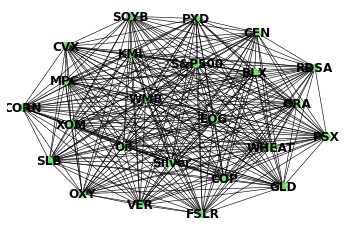

-------model initialization-------
-------Training begin-------
day 4  Epoch  0 Training MSE:  0.007171350065618753


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 4  Epoch  20 Training MSE:  6.80804587318562e-05
day 4  Epoch  40 Training MSE:  8.750595043238718e-06
day 4  Epoch  60 Training MSE:  4.910307325189933e-07
day 4  Epoch  80 Training MSE:  1.7838904398104205e-07
-------Testing begin-------
day 4  Test MSE:  4.796128223460983e-07
Test Data Truth:  tensor([[0.0404, 0.0467, 0.0422, 0.0446, 0.0389, 0.0444, 0.0453, 0.0491, 0.0446,
         0.0500, 0.0374, 0.0433, 0.0490, 0.0441, 0.0421, 0.0428, 0.0449, 0.0434,
         0.0440, 0.0485, 0.0439, 0.0431, 0.0451, 0.0470]])
Test Data prediction tensor([0.0409, 0.0472, 0.0430, 0.0453, 0.0394, 0.0449, 0.0456, 0.0499, 0.0456,
        0.0509, 0.0378, 0.0434, 0.0501, 0.0446, 0.0432, 0.0429, 0.0448, 0.0427,
        0.0426, 0.0484, 0.0438, 0.0441, 0.0454, 0.0475],
       grad_fn=<SliceBackward>)
day 4  Training time: 7.6332926750183105
=================================Day  4 ======================================
-------data prepare-------
612
labels      OXY_Value  CVX_Value  XOM_Value  ...  SOYB_V

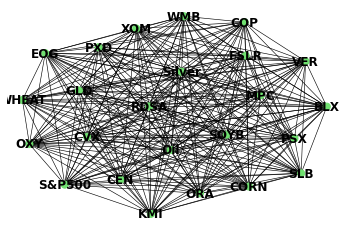

-------model initialization-------
-------Training begin-------
day 5  Epoch  0 Training MSE:  0.012644529342651367


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 5  Epoch  20 Training MSE:  5.0872204155893996e-05
day 5  Epoch  40 Training MSE:  5.7850793382385746e-06
day 5  Epoch  60 Training MSE:  2.802367589538335e-06
day 5  Epoch  80 Training MSE:  1.3779855123630114e-07
-------Testing begin-------
day 5  Test MSE:  3.3634216833888786e-07
Test Data Truth:  tensor([[0.0403, 0.0463, 0.0418, 0.0444, 0.0386, 0.0441, 0.0452, 0.0490, 0.0438,
         0.0501, 0.0371, 0.0426, 0.0485, 0.0448, 0.0420, 0.0424, 0.0450, 0.0437,
         0.0448, 0.0485, 0.0441, 0.0431, 0.0455, 0.0467]])
Test Data prediction tensor([0.0404, 0.0475, 0.0434, 0.0445, 0.0382, 0.0444, 0.0449, 0.0492, 0.0444,
        0.0501, 0.0368, 0.0429, 0.0484, 0.0441, 0.0423, 0.0433, 0.0444, 0.0443,
        0.0444, 0.0486, 0.0435, 0.0438, 0.0450, 0.0467],
       grad_fn=<SliceBackward>)
day 5  Training time: 7.607525825500488
=================================Day  5 ======================================
-------data prepare-------
612
labels      OXY_Value  CVX_Value  XOM_Value  ...  SOY

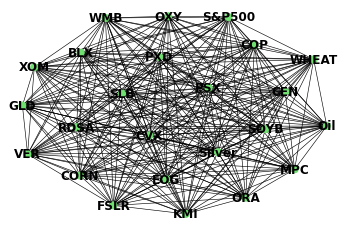

-------model initialization-------
-------Training begin-------
day 6  Epoch  0 Training MSE:  0.011045299470424652


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 6  Epoch  20 Training MSE:  5.2669474825961515e-05
day 6  Epoch  40 Training MSE:  1.4026466487848666e-05
day 6  Epoch  60 Training MSE:  2.483814114384586e-06
day 6  Epoch  80 Training MSE:  1.5167923947956297e-06
-------Testing begin-------
day 6  Test MSE:  2.0578540897986386e-06
Test Data Truth:  tensor([[0.0403, 0.0461, 0.0418, 0.0441, 0.0386, 0.0438, 0.0454, 0.0492, 0.0437,
         0.0501, 0.0367, 0.0434, 0.0493, 0.0461, 0.0421, 0.0433, 0.0449, 0.0432,
         0.0454, 0.0486, 0.0443, 0.0436, 0.0463, 0.0476]])
Test Data prediction tensor([0.0417, 0.0483, 0.0446, 0.0444, 0.0373, 0.0421, 0.0465, 0.0510, 0.0459,
        0.0513, 0.0393, 0.0439, 0.0487, 0.0456, 0.0439, 0.0434, 0.0458, 0.0443,
        0.0442, 0.0487, 0.0453, 0.0417, 0.0455, 0.0481],
       grad_fn=<SliceBackward>)
day 6  Training time: 7.708805084228516
=================================Day  6 ======================================
-------data prepare-------
606
labels      OXY_Value  CVX_Value  XOM_Value  ...  SOY

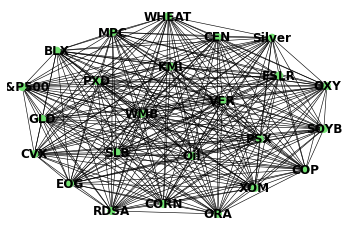

-------model initialization-------
-------Training begin-------
day 7  Epoch  0 Training MSE:  0.011967825703322887


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 7  Epoch  20 Training MSE:  6.209505227161571e-05
day 7  Epoch  40 Training MSE:  8.92391017259797e-06
day 7  Epoch  60 Training MSE:  2.464772933308268e-06
day 7  Epoch  80 Training MSE:  2.0104650957364356e-06
-------Testing begin-------
day 7  Test MSE:  5.578452260124322e-07
Test Data Truth:  tensor([[0.0399, 0.0460, 0.0417, 0.0441, 0.0383, 0.0433, 0.0453, 0.0488, 0.0433,
         0.0499, 0.0370, 0.0434, 0.0488, 0.0463, 0.0412, 0.0432, 0.0447, 0.0429,
         0.0465, 0.0485, 0.0447, 0.0437, 0.0459, 0.0470]])
Test Data prediction tensor([0.0405, 0.0469, 0.0424, 0.0438, 0.0394, 0.0433, 0.0467, 0.0488, 0.0434,
        0.0493, 0.0363, 0.0437, 0.0497, 0.0470, 0.0412, 0.0443, 0.0448, 0.0428,
        0.0459, 0.0486, 0.0445, 0.0439, 0.0479, 0.0478],
       grad_fn=<SliceBackward>)
day 7  Training time: 7.618695020675659
=================================Day  7 ======================================
-------data prepare-------
606
labels      OXY_Value  CVX_Value  XOM_Value  ...  SOYB_Va

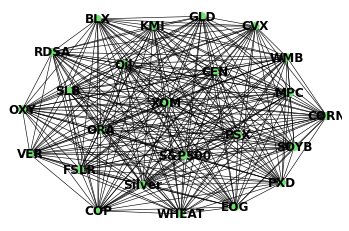

-------model initialization-------
-------Training begin-------
day 8  Epoch  0 Training MSE:  0.011226844042539597


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 8  Epoch  20 Training MSE:  4.57581045338884e-05
day 8  Epoch  40 Training MSE:  1.2252782653376926e-05
day 8  Epoch  60 Training MSE:  3.5176217352272943e-06
day 8  Epoch  80 Training MSE:  9.680574066806003e-07
-------Testing begin-------
day 8  Test MSE:  2.5004317194543546e-06
Test Data Truth:  tensor([[0.0393, 0.0453, 0.0414, 0.0433, 0.0385, 0.0423, 0.0450, 0.0480, 0.0430,
         0.0493, 0.0364, 0.0442, 0.0489, 0.0463, 0.0408, 0.0431, 0.0449, 0.0433,
         0.0465, 0.0485, 0.0448, 0.0437, 0.0463, 0.0471]])
Test Data prediction tensor([0.0394, 0.0445, 0.0408, 0.0437, 0.0371, 0.0419, 0.0439, 0.0451, 0.0466,
        0.0483, 0.0354, 0.0412, 0.0479, 0.0482, 0.0410, 0.0425, 0.0429, 0.0428,
        0.0471, 0.0479, 0.0431, 0.0446, 0.0439, 0.0490],
       grad_fn=<SliceBackward>)
day 8  Training time: 7.602425575256348
=================================Day  8 ======================================
-------data prepare-------
602
labels      OXY_Value  CVX_Value  XOM_Value  ...  SOYB_

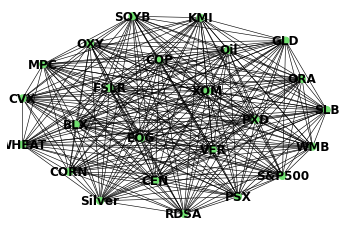

-------model initialization-------
-------Training begin-------
day 9  Epoch  0 Training MSE:  0.009539853781461716


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 9  Epoch  20 Training MSE:  3.617783295339905e-05
day 9  Epoch  40 Training MSE:  5.462612080009421e-06
day 9  Epoch  60 Training MSE:  4.21296226704726e-06
day 9  Epoch  80 Training MSE:  2.423719536182034e-07
-------Testing begin-------
day 9  Test MSE:  1.520955720479833e-06
Test Data Truth:  tensor([[0.0388, 0.0449, 0.0408, 0.0426, 0.0381, 0.0415, 0.0438, 0.0467, 0.0423,
         0.0484, 0.0363, 0.0436, 0.0481, 0.0450, 0.0406, 0.0427, 0.0446, 0.0422,
         0.0454, 0.0477, 0.0451, 0.0424, 0.0447, 0.0454]])
Test Data prediction tensor([0.0383, 0.0465, 0.0420, 0.0431, 0.0384, 0.0428, 0.0453, 0.0495, 0.0438,
        0.0489, 0.0366, 0.0448, 0.0484, 0.0468, 0.0406, 0.0423, 0.0447, 0.0440,
        0.0471, 0.0489, 0.0453, 0.0439, 0.0454, 0.0472],
       grad_fn=<SliceBackward>)
day 9  Training time: 7.595136404037476
=================================Day  9 ======================================
-------data prepare-------
600
labels      OXY_Value  CVX_Value  XOM_Value  ...  SOYB_Val

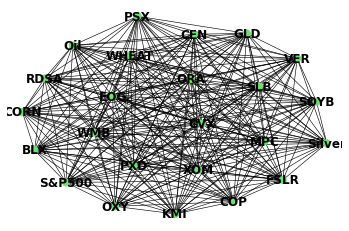

-------model initialization-------
-------Training begin-------
day 10  Epoch  0 Training MSE:  0.01494945865124464


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 10  Epoch  20 Training MSE:  6.806583405705169e-05
day 10  Epoch  40 Training MSE:  8.049931238929275e-06
day 10  Epoch  60 Training MSE:  2.4424252842436545e-06
day 10  Epoch  80 Training MSE:  3.418931555643212e-07
-------Testing begin-------
day 10  Test MSE:  3.694613951665815e-06
Test Data Truth:  tensor([[0.0390, 0.0452, 0.0410, 0.0427, 0.0383, 0.0419, 0.0442, 0.0471, 0.0426,
         0.0484, 0.0365, 0.0429, 0.0482, 0.0453, 0.0405, 0.0436, 0.0446, 0.0423,
         0.0466, 0.0479, 0.0451, 0.0425, 0.0449, 0.0450]])
Test Data prediction tensor([0.0392, 0.0456, 0.0432, 0.0437, 0.0400, 0.0434, 0.0434, 0.0447, 0.0434,
        0.0470, 0.0380, 0.0459, 0.0502, 0.0465, 0.0431, 0.0434, 0.0464, 0.0447,
        0.0462, 0.0455, 0.0481, 0.0394, 0.0427, 0.0475],
       grad_fn=<SliceBackward>)
day 10  Training time: 7.558168649673462
=================================Day  10 ======================================
-------data prepare-------
600
labels      OXY_Value  CVX_Value  XOM_Value  ... 

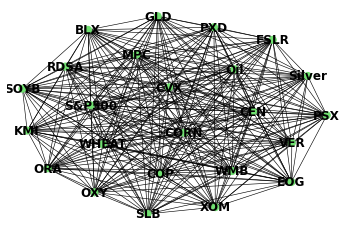

-------model initialization-------
-------Training begin-------
day 11  Epoch  0 Training MSE:  0.01287703588604927


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 11  Epoch  20 Training MSE:  3.646095501608215e-05
day 11  Epoch  40 Training MSE:  6.615082838834496e-06
day 11  Epoch  60 Training MSE:  4.4599389070754114e-07
day 11  Epoch  80 Training MSE:  2.855594402717543e-06
-------Testing begin-------
day 11  Test MSE:  1.6475137272209395e-06
Test Data Truth:  tensor([[0.0388, 0.0449, 0.0408, 0.0421, 0.0381, 0.0417, 0.0444, 0.0465, 0.0426,
         0.0483, 0.0354, 0.0438, 0.0485, 0.0433, 0.0401, 0.0433, 0.0448, 0.0430,
         0.0473, 0.0484, 0.0454, 0.0420, 0.0449, 0.0453]])
Test Data prediction tensor([0.0402, 0.0460, 0.0395, 0.0427, 0.0387, 0.0428, 0.0447, 0.0486, 0.0435,
        0.0498, 0.0376, 0.0423, 0.0465, 0.0455, 0.0395, 0.0433, 0.0455, 0.0433,
        0.0460, 0.0487, 0.0441, 0.0437, 0.0448, 0.0439],
       grad_fn=<SliceBackward>)
day 11  Training time: 7.717321395874023
=================================Day  11 ======================================
-------data prepare-------
600
labels      OXY_Value  CVX_Value  XOM_Value  ...

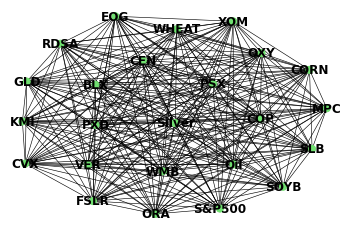

-------model initialization-------
-------Training begin-------
day 12  Epoch  0 Training MSE:  0.008781378157436848


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 12  Epoch  20 Training MSE:  4.100905789528042e-05
day 12  Epoch  40 Training MSE:  9.76613682723837e-06
day 12  Epoch  60 Training MSE:  1.3041531019553076e-06
day 12  Epoch  80 Training MSE:  6.808641614952649e-07
-------Testing begin-------
day 12  Test MSE:  1.2078396594006335e-06
Test Data Truth:  tensor([[0.0390, 0.0451, 0.0410, 0.0428, 0.0383, 0.0419, 0.0446, 0.0467, 0.0432,
         0.0491, 0.0354, 0.0436, 0.0488, 0.0439, 0.0408, 0.0434, 0.0452, 0.0440,
         0.0470, 0.0484, 0.0455, 0.0419, 0.0441, 0.0442]])
Test Data prediction tensor([0.0374, 0.0444, 0.0401, 0.0442, 0.0383, 0.0424, 0.0459, 0.0466, 0.0439,
        0.0498, 0.0357, 0.0432, 0.0482, 0.0441, 0.0403, 0.0442, 0.0428, 0.0443,
        0.0473, 0.0456, 0.0462, 0.0420, 0.0442, 0.0463],
       grad_fn=<SliceBackward>)
day 12  Training time: 7.798435211181641
=================================Day  12 ======================================
-------data prepare-------
596
labels      OXY_Value  CVX_Value  XOM_Value  ... 

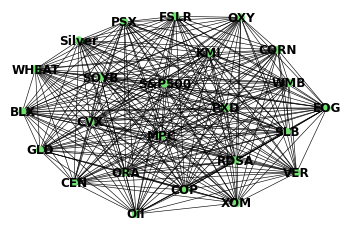

-------model initialization-------
-------Training begin-------
day 13  Epoch  0 Training MSE:  0.01815447025001049


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 13  Epoch  20 Training MSE:  6.198614573804662e-05
day 13  Epoch  40 Training MSE:  7.289967470569536e-06
day 13  Epoch  60 Training MSE:  2.4591518013039604e-06
day 13  Epoch  80 Training MSE:  3.259637821884098e-07
-------Testing begin-------
day 13  Test MSE:  3.1893560503704066e-07
Test Data Truth:  tensor([[0.0393, 0.0452, 0.0410, 0.0433, 0.0382, 0.0424, 0.0446, 0.0472, 0.0437,
         0.0491, 0.0359, 0.0441, 0.0484, 0.0438, 0.0414, 0.0434, 0.0456, 0.0444,
         0.0460, 0.0484, 0.0458, 0.0419, 0.0438, 0.0431]])
Test Data prediction tensor([0.0396, 0.0445, 0.0415, 0.0426, 0.0383, 0.0423, 0.0448, 0.0458, 0.0432,
        0.0487, 0.0364, 0.0432, 0.0485, 0.0436, 0.0411, 0.0429, 0.0449, 0.0442,
        0.0466, 0.0481, 0.0457, 0.0423, 0.0439, 0.0443],
       grad_fn=<SliceBackward>)
day 13  Training time: 8.067604303359985
=================================Day  13 ======================================
-------data prepare-------
594
labels      OXY_Value  CVX_Value  XOM_Value  ...

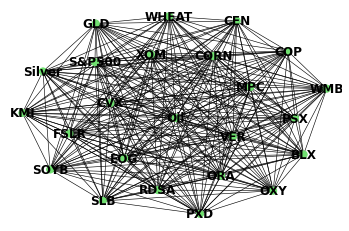

-------model initialization-------
-------Training begin-------
day 14  Epoch  0 Training MSE:  0.011619508266448975


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 14  Epoch  20 Training MSE:  5.307748870109208e-05
day 14  Epoch  40 Training MSE:  9.169639270112384e-06
day 14  Epoch  60 Training MSE:  1.0450603440403938e-06
day 14  Epoch  80 Training MSE:  1.3569655266110203e-07
-------Testing begin-------
day 14  Test MSE:  1.7476889979661792e-07
Test Data Truth:  tensor([[0.0390, 0.0456, 0.0408, 0.0429, 0.0380, 0.0421, 0.0454, 0.0481, 0.0438,
         0.0491, 0.0355, 0.0438, 0.0482, 0.0445, 0.0415, 0.0435, 0.0456, 0.0445,
         0.0467, 0.0476, 0.0458, 0.0422, 0.0435, 0.0425]])
Test Data prediction tensor([0.0394, 0.0453, 0.0409, 0.0434, 0.0381, 0.0423, 0.0446, 0.0471, 0.0437,
        0.0491, 0.0358, 0.0441, 0.0484, 0.0438, 0.0416, 0.0433, 0.0456, 0.0442,
        0.0461, 0.0483, 0.0459, 0.0419, 0.0438, 0.0430],
       grad_fn=<SliceBackward>)
day 14  Training time: 8.099596977233887
=================================Day  14 ======================================
-------data prepare-------
588
labels      OXY_Value  CVX_Value  XOM_Value  ..

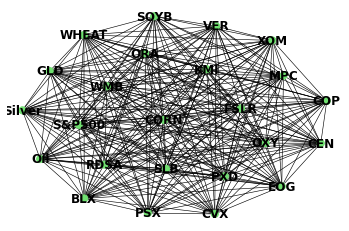

-------model initialization-------
-------Training begin-------
day 15  Epoch  0 Training MSE:  0.010713969357311726


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 15  Epoch  20 Training MSE:  3.120872497675009e-05
day 15  Epoch  40 Training MSE:  4.257452019373886e-06
day 15  Epoch  60 Training MSE:  3.7570578115264652e-06
day 15  Epoch  80 Training MSE:  1.066535696736537e-05
-------Testing begin-------
day 15  Test MSE:  4.1282115148533194e-07
Test Data Truth:  tensor([[0.0390, 0.0459, 0.0410, 0.0432, 0.0386, 0.0421, 0.0452, 0.0486, 0.0441,
         0.0489, 0.0357, 0.0437, 0.0480, 0.0447, 0.0416, 0.0439, 0.0452, 0.0439,
         0.0467, 0.0476, 0.0448, 0.0426, 0.0436, 0.0429]])
Test Data prediction tensor([0.0396, 0.0462, 0.0402, 0.0429, 0.0392, 0.0419, 0.0464, 0.0487, 0.0432,
        0.0488, 0.0352, 0.0428, 0.0477, 0.0453, 0.0406, 0.0442, 0.0445, 0.0442,
        0.0458, 0.0479, 0.0456, 0.0426, 0.0448, 0.0425],
       grad_fn=<SliceBackward>)
day 15  Training time: 8.017951965332031
=================================Day  15 ======================================
-------data prepare-------
586
labels      OXY_Value  CVX_Value  XOM_Value  ...

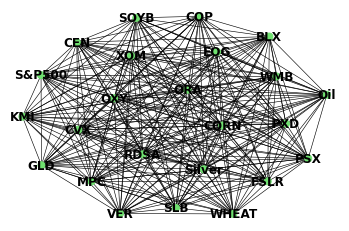

-------model initialization-------
-------Training begin-------
day 16  Epoch  0 Training MSE:  0.013119344599545002


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 16  Epoch  20 Training MSE:  5.9232977946521714e-05
day 16  Epoch  40 Training MSE:  6.137432592367986e-06
day 16  Epoch  60 Training MSE:  7.498229024349712e-07
day 16  Epoch  80 Training MSE:  1.109324685444335e-07
-------Testing begin-------
day 16  Test MSE:  1.588763183235642e-07
Test Data Truth:  tensor([[0.0390, 0.0457, 0.0409, 0.0427, 0.0383, 0.0415, 0.0453, 0.0494, 0.0437,
         0.0486, 0.0355, 0.0431, 0.0486, 0.0453, 0.0412, 0.0444, 0.0451, 0.0433,
         0.0471, 0.0476, 0.0440, 0.0424, 0.0434, 0.0421]])
Test Data prediction tensor([0.0390, 0.0458, 0.0410, 0.0433, 0.0385, 0.0421, 0.0453, 0.0487, 0.0439,
        0.0488, 0.0357, 0.0437, 0.0480, 0.0448, 0.0416, 0.0441, 0.0449, 0.0436,
        0.0468, 0.0475, 0.0447, 0.0426, 0.0434, 0.0428],
       grad_fn=<SliceBackward>)
day 16  Training time: 8.118267297744751
=================================Day  16 ======================================
-------data prepare-------
586
labels      OXY_Value  CVX_Value  XOM_Value  ... 

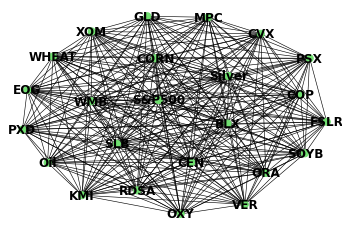

-------model initialization-------
-------Training begin-------
day 17  Epoch  0 Training MSE:  0.01662093959748745


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 17  Epoch  20 Training MSE:  5.724308721255511e-05
day 17  Epoch  40 Training MSE:  8.996530596050434e-06
day 17  Epoch  60 Training MSE:  6.314441179711139e-06
day 17  Epoch  80 Training MSE:  2.170008883695118e-06
-------Testing begin-------
day 17  Test MSE:  6.067970730327943e-07
Test Data Truth:  tensor([[0.0389, 0.0457, 0.0409, 0.0425, 0.0384, 0.0414, 0.0452, 0.0484, 0.0437,
         0.0486, 0.0354, 0.0429, 0.0487, 0.0456, 0.0412, 0.0446, 0.0456, 0.0445,
         0.0461, 0.0481, 0.0441, 0.0424, 0.0430, 0.0412]])
Test Data prediction tensor([0.0393, 0.0448, 0.0415, 0.0426, 0.0389, 0.0424, 0.0457, 0.0495, 0.0444,
        0.0484, 0.0359, 0.0437, 0.0488, 0.0456, 0.0419, 0.0439, 0.0448, 0.0440,
        0.0479, 0.0482, 0.0442, 0.0421, 0.0441, 0.0428],
       grad_fn=<SliceBackward>)
day 17  Training time: 8.15337586402893
=================================Day  17 ======================================
-------data prepare-------
586
labels      OXY_Value  CVX_Value  XOM_Value  ...  S

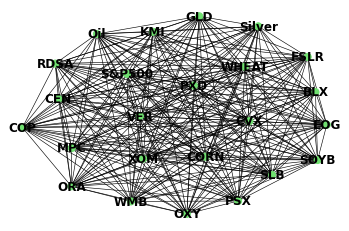

-------model initialization-------
-------Training begin-------
day 18  Epoch  0 Training MSE:  0.019306590780615807


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 18  Epoch  20 Training MSE:  7.627241575391963e-05
day 18  Epoch  40 Training MSE:  4.6729797759326175e-05
day 18  Epoch  60 Training MSE:  3.745002004507114e-06
day 18  Epoch  80 Training MSE:  2.77845771279317e-07
-------Testing begin-------
day 18  Test MSE:  5.142255304235732e-06
Test Data Truth:  tensor([[0.0390, 0.0457, 0.0407, 0.0430, 0.0383, 0.0417, 0.0453, 0.0492, 0.0438,
         0.0485, 0.0356, 0.0428, 0.0491, 0.0454, 0.0416, 0.0445, 0.0457, 0.0443,
         0.0459, 0.0479, 0.0437, 0.0425, 0.0424, 0.0414]])
Test Data prediction tensor([0.0366, 0.0441, 0.0436, 0.0405, 0.0364, 0.0417, 0.0441, 0.0514, 0.0417,
        0.0444, 0.0364, 0.0474, 0.0481, 0.0428, 0.0398, 0.0467, 0.0435, 0.0429,
        0.0477, 0.0464, 0.0467, 0.0424, 0.0432, 0.0443],
       grad_fn=<SliceBackward>)
day 18  Training time: 8.074207544326782
=================================Day  18 ======================================
-------data prepare-------
584
labels      OXY_Value  CVX_Value  XOM_Value  ...  

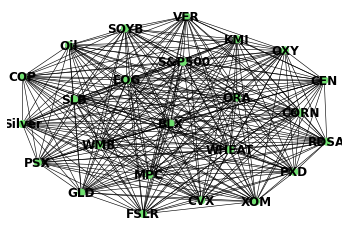

-------model initialization-------
-------Training begin-------
day 19  Epoch  0 Training MSE:  0.01145982462912798


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 19  Epoch  20 Training MSE:  5.362023148336448e-05
day 19  Epoch  40 Training MSE:  7.625977104908088e-06
day 19  Epoch  60 Training MSE:  3.228477680750075e-07
day 19  Epoch  80 Training MSE:  1.4729296538007475e-07
-------Testing begin-------
day 19  Test MSE:  6.100657969909662e-07
Test Data Truth:  tensor([[0.0394, 0.0461, 0.0409, 0.0439, 0.0383, 0.0427, 0.0457, 0.0510, 0.0445,
         0.0501, 0.0361, 0.0436, 0.0496, 0.0451, 0.0432, 0.0452, 0.0456, 0.0441,
         0.0447, 0.0479, 0.0438, 0.0427, 0.0425, 0.0420]])
Test Data prediction tensor([0.0391, 0.0458, 0.0405, 0.0430, 0.0383, 0.0416, 0.0453, 0.0494, 0.0437,
        0.0485, 0.0361, 0.0428, 0.0491, 0.0455, 0.0418, 0.0443, 0.0457, 0.0443,
        0.0459, 0.0478, 0.0439, 0.0424, 0.0425, 0.0413],
       grad_fn=<SliceBackward>)
day 19  Training time: 7.83090353012085
=================================Day  19 ======================================
-------data prepare-------
584
labels      OXY_Value  CVX_Value  XOM_Value  ...  

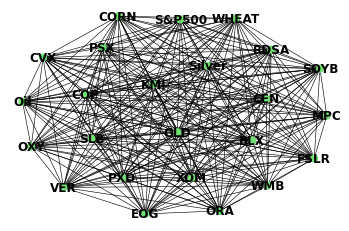

-------model initialization-------
-------Training begin-------
day 20  Epoch  0 Training MSE:  0.014835773967206478


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 20  Epoch  20 Training MSE:  6.820209819125012e-05
day 20  Epoch  40 Training MSE:  1.2617998436326161e-05
day 20  Epoch  60 Training MSE:  1.9463566786726005e-05
day 20  Epoch  80 Training MSE:  7.727341539975896e-07
-------Testing begin-------
day 20  Test MSE:  1.7660232742855442e-06
Test Data Truth:  tensor([[0.0400, 0.0464, 0.0413, 0.0440, 0.0393, 0.0428, 0.0451, 0.0487, 0.0445,
         0.0502, 0.0363, 0.0439, 0.0501, 0.0451, 0.0429, 0.0446, 0.0456, 0.0441,
         0.0451, 0.0479, 0.0437, 0.0425, 0.0420, 0.0415]])
Test Data prediction tensor([0.0386, 0.0473, 0.0413, 0.0457, 0.0393, 0.0436, 0.0480, 0.0501, 0.0453,
        0.0515, 0.0353, 0.0450, 0.0492, 0.0470, 0.0425, 0.0454, 0.0476, 0.0421,
        0.0461, 0.0479, 0.0444, 0.0431, 0.0446, 0.0416],
       grad_fn=<SliceBackward>)
day 20  Training time: 7.763720989227295
=================================Day  20 ======================================
-------data prepare-------
586
labels      OXY_Value  CVX_Value  XOM_Value  ..

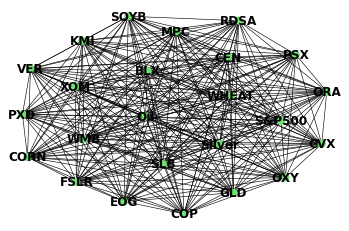

-------model initialization-------
-------Training begin-------
day 21  Epoch  0 Training MSE:  0.015916837379336357


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 21  Epoch  20 Training MSE:  0.00012405520828906447
day 21  Epoch  40 Training MSE:  1.2918041647935752e-05
day 21  Epoch  60 Training MSE:  1.7139194596893503e-06
day 21  Epoch  80 Training MSE:  2.07095524729084e-07
-------Testing begin-------
day 21  Test MSE:  2.2494675988582458e-07
Test Data Truth:  tensor([[0.0406, 0.0474, 0.0421, 0.0447, 0.0397, 0.0437, 0.0452, 0.0492, 0.0444,
         0.0501, 0.0368, 0.0440, 0.0498, 0.0447, 0.0430, 0.0447, 0.0455, 0.0441,
         0.0451, 0.0479, 0.0434, 0.0425, 0.0418, 0.0411]])
Test Data prediction tensor([0.0396, 0.0465, 0.0413, 0.0439, 0.0394, 0.0427, 0.0453, 0.0487, 0.0448,
        0.0501, 0.0364, 0.0439, 0.0500, 0.0451, 0.0433, 0.0444, 0.0456, 0.0442,
        0.0453, 0.0478, 0.0438, 0.0426, 0.0420, 0.0413],
       grad_fn=<SliceBackward>)
day 21  Training time: 7.795159578323364
=================================Day  21 ======================================
-------data prepare-------
586
labels      OXY_Value  CVX_Value  XOM_Value  ..

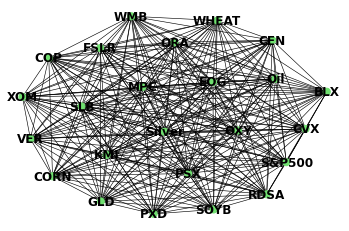

-------model initialization-------
-------Training begin-------
day 22  Epoch  0 Training MSE:  0.009575585834681988


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 22  Epoch  20 Training MSE:  5.1522623834898695e-05
day 22  Epoch  40 Training MSE:  8.194362635549624e-06
day 22  Epoch  60 Training MSE:  1.1138415629829979e-06
day 22  Epoch  80 Training MSE:  1.6337502017904626e-07
-------Testing begin-------
day 22  Test MSE:  9.169152548338388e-08
Test Data Truth:  tensor([[0.0408, 0.0474, 0.0422, 0.0447, 0.0398, 0.0441, 0.0455, 0.0495, 0.0440,
         0.0496, 0.0364, 0.0441, 0.0494, 0.0447, 0.0430, 0.0447, 0.0456, 0.0443,
         0.0456, 0.0480, 0.0432, 0.0422, 0.0413, 0.0414]])
Test Data prediction tensor([0.0406, 0.0475, 0.0422, 0.0446, 0.0397, 0.0438, 0.0452, 0.0493, 0.0446,
        0.0503, 0.0368, 0.0440, 0.0499, 0.0444, 0.0429, 0.0447, 0.0456, 0.0442,
        0.0453, 0.0478, 0.0435, 0.0424, 0.0417, 0.0409],
       grad_fn=<SliceBackward>)
day 22  Training time: 7.772977113723755
=================================Day  22 ======================================
-------data prepare-------
586
labels      OXY_Value  CVX_Value  XOM_Value  ..

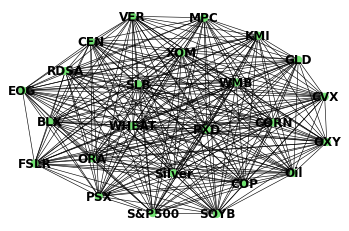

-------model initialization-------
-------Training begin-------
day 23  Epoch  0 Training MSE:  0.011264186352491379


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 23  Epoch  20 Training MSE:  4.099939906154759e-05
day 23  Epoch  40 Training MSE:  5.7231486607634e-06
day 23  Epoch  60 Training MSE:  5.886424332857132e-06
day 23  Epoch  80 Training MSE:  4.1020999219654186e-07
-------Testing begin-------
day 23  Test MSE:  6.583868525922298e-07
Test Data Truth:  tensor([[0.0397, 0.0470, 0.0421, 0.0441, 0.0392, 0.0432, 0.0459, 0.0502, 0.0440,
         0.0494, 0.0355, 0.0443, 0.0497, 0.0442, 0.0427, 0.0447, 0.0456, 0.0441,
         0.0465, 0.0482, 0.0436, 0.0419, 0.0410, 0.0416]])
Test Data prediction tensor([0.0410, 0.0462, 0.0413, 0.0448, 0.0405, 0.0447, 0.0451, 0.0496, 0.0445,
        0.0497, 0.0361, 0.0449, 0.0496, 0.0455, 0.0437, 0.0445, 0.0463, 0.0437,
        0.0455, 0.0482, 0.0426, 0.0419, 0.0417, 0.0421],
       grad_fn=<SliceBackward>)
day 23  Training time: 7.915814399719238
=================================Day  23 ======================================
-------data prepare-------
586
labels      OXY_Value  CVX_Value  XOM_Value  ...  S

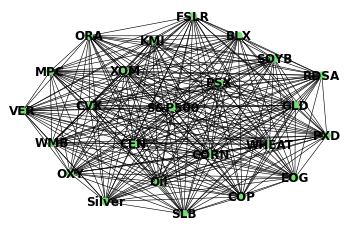

-------model initialization-------
-------Training begin-------
day 24  Epoch  0 Training MSE:  0.009327922947704792


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 24  Epoch  20 Training MSE:  5.436782885226421e-05
day 24  Epoch  40 Training MSE:  6.645073881372809e-06
day 24  Epoch  60 Training MSE:  9.713884310258436e-07
day 24  Epoch  80 Training MSE:  1.2271131311081263e-07
-------Testing begin-------
day 24  Test MSE:  5.271318173072359e-07
Test Data Truth:  tensor([[0.0398, 0.0477, 0.0424, 0.0445, 0.0397, 0.0438, 0.0462, 0.0505, 0.0447,
         0.0504, 0.0359, 0.0440, 0.0498, 0.0445, 0.0428, 0.0452, 0.0459, 0.0445,
         0.0468, 0.0485, 0.0435, 0.0426, 0.0425, 0.0421]])
Test Data prediction tensor([0.0394, 0.0465, 0.0418, 0.0434, 0.0388, 0.0432, 0.0462, 0.0496, 0.0436,
        0.0496, 0.0354, 0.0441, 0.0495, 0.0440, 0.0428, 0.0444, 0.0453, 0.0441,
        0.0470, 0.0481, 0.0434, 0.0420, 0.0407, 0.0417],
       grad_fn=<SliceBackward>)
day 24  Training time: 7.73532509803772
=================================Day  24 ======================================
-------data prepare-------
586
labels      OXY_Value  CVX_Value  XOM_Value  ...  

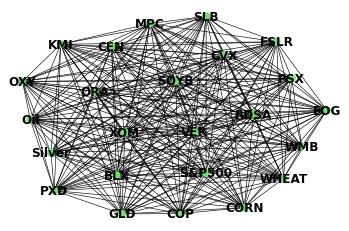

-------model initialization-------
-------Training begin-------
day 25  Epoch  0 Training MSE:  0.013078306801617146


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 25  Epoch  20 Training MSE:  6.459157884819433e-05
day 25  Epoch  40 Training MSE:  9.789856449060608e-06
day 25  Epoch  60 Training MSE:  2.145807457054616e-06
day 25  Epoch  80 Training MSE:  2.0935856070991576e-07
-------Testing begin-------
day 25  Test MSE:  3.118890163023025e-06
Test Data Truth:  tensor([[0.0400, 0.0477, 0.0425, 0.0445, 0.0401, 0.0441, 0.0464, 0.0506, 0.0445,
         0.0503, 0.0359, 0.0437, 0.0493, 0.0448, 0.0431, 0.0456, 0.0467, 0.0454,
         0.0468, 0.0485, 0.0435, 0.0428, 0.0423, 0.0433]])
Test Data prediction tensor([0.0370, 0.0448, 0.0438, 0.0432, 0.0423, 0.0452, 0.0443, 0.0491, 0.0429,
        0.0505, 0.0353, 0.0436, 0.0495, 0.0423, 0.0440, 0.0435, 0.0456, 0.0426,
        0.0497, 0.0509, 0.0421, 0.0426, 0.0435, 0.0438],
       grad_fn=<SliceBackward>)
day 25  Training time: 7.714748859405518
=================================Day  25 ======================================
-------data prepare-------
584
labels      OXY_Value  CVX_Value  XOM_Value  ... 

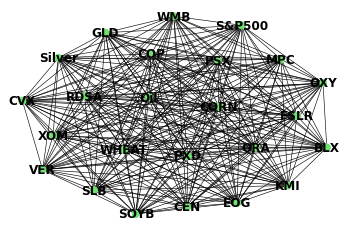

-------model initialization-------
-------Training begin-------
day 26  Epoch  0 Training MSE:  0.009706822223961353


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 26  Epoch  20 Training MSE:  6.70038498356007e-05
day 26  Epoch  40 Training MSE:  9.924054211296607e-06
day 26  Epoch  60 Training MSE:  2.2685369458486093e-06
day 26  Epoch  80 Training MSE:  7.109185389708728e-06
-------Testing begin-------
day 26  Test MSE:  6.835269346083805e-07
Test Data Truth:  tensor([[0.0406, 0.0484, 0.0426, 0.0452, 0.0404, 0.0454, 0.0468, 0.0500, 0.0447,
         0.0507, 0.0375, 0.0439, 0.0497, 0.0442, 0.0431, 0.0464, 0.0464, 0.0452,
         0.0463, 0.0483, 0.0436, 0.0437, 0.0424, 0.0439]])
Test Data prediction tensor([0.0397, 0.0480, 0.0415, 0.0445, 0.0399, 0.0442, 0.0462, 0.0513, 0.0440,
        0.0496, 0.0363, 0.0439, 0.0486, 0.0453, 0.0434, 0.0459, 0.0470, 0.0448,
        0.0464, 0.0489, 0.0426, 0.0428, 0.0419, 0.0429],
       grad_fn=<SliceBackward>)
day 26  Training time: 7.643703460693359
=================================Day  26 ======================================
-------data prepare-------
584
labels      OXY_Value  CVX_Value  XOM_Value  ...  

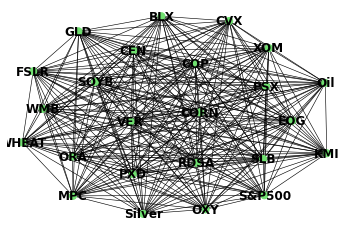

-------model initialization-------
-------Training begin-------
day 27  Epoch  0 Training MSE:  0.016651978716254234


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 27  Epoch  20 Training MSE:  6.601755012525246e-05
day 27  Epoch  40 Training MSE:  1.0075672435050365e-05
day 27  Epoch  60 Training MSE:  2.572851144577726e-06
day 27  Epoch  80 Training MSE:  2.3777465685270727e-06
-------Testing begin-------
day 27  Test MSE:  1.3554623592426651e-06
Test Data Truth:  tensor([[0.0406, 0.0485, 0.0428, 0.0454, 0.0409, 0.0457, 0.0467, 0.0492, 0.0445,
         0.0506, 0.0379, 0.0439, 0.0499, 0.0457, 0.0430, 0.0464, 0.0462, 0.0451,
         0.0464, 0.0483, 0.0434, 0.0439, 0.0432, 0.0432]])
Test Data prediction tensor([0.0393, 0.0471, 0.0416, 0.0439, 0.0419, 0.0443, 0.0460, 0.0490, 0.0433,
        0.0506, 0.0385, 0.0423, 0.0484, 0.0452, 0.0443, 0.0456, 0.0482, 0.0436,
        0.0477, 0.0480, 0.0426, 0.0426, 0.0446, 0.0431],
       grad_fn=<SliceBackward>)
day 27  Training time: 7.646399736404419
=================================Day  27 ======================================
-------data prepare-------
584
labels      OXY_Value  CVX_Value  XOM_Value  ..

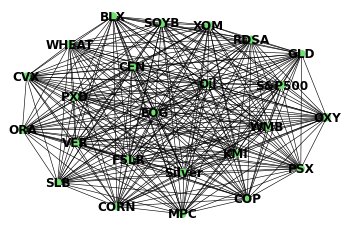

-------model initialization-------
-------Training begin-------
day 28  Epoch  0 Training MSE:  0.015488657169044018


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 28  Epoch  20 Training MSE:  4.084766624146141e-05
day 28  Epoch  40 Training MSE:  8.124036867229734e-06
day 28  Epoch  60 Training MSE:  7.878953169893066e-07
day 28  Epoch  80 Training MSE:  4.0265172174258623e-07
-------Testing begin-------
day 28  Test MSE:  3.3160532098008844e-07
Test Data Truth:  tensor([[0.0404, 0.0486, 0.0428, 0.0461, 0.0406, 0.0464, 0.0475, 0.0498, 0.0445,
         0.0505, 0.0379, 0.0444, 0.0498, 0.0476, 0.0426, 0.0470, 0.0467, 0.0456,
         0.0464, 0.0484, 0.0430, 0.0438, 0.0425, 0.0428]])
Test Data prediction tensor([0.0409, 0.0486, 0.0430, 0.0455, 0.0408, 0.0456, 0.0471, 0.0494, 0.0444,
        0.0509, 0.0378, 0.0439, 0.0502, 0.0455, 0.0429, 0.0465, 0.0464, 0.0450,
        0.0467, 0.0485, 0.0435, 0.0440, 0.0431, 0.0430],
       grad_fn=<SliceBackward>)
day 28  Training time: 7.591411828994751
=================================Day  28 ======================================
-------data prepare-------
582
labels      OXY_Value  CVX_Value  XOM_Value  ...

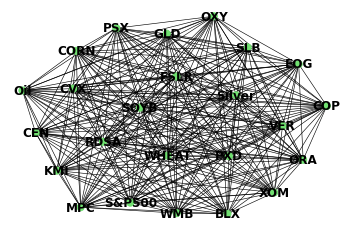

-------model initialization-------
-------Training begin-------
day 29  Epoch  0 Training MSE:  0.012128613889217377


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 29  Epoch  20 Training MSE:  5.1477705710567534e-05
day 29  Epoch  40 Training MSE:  5.257206339592813e-06
day 29  Epoch  60 Training MSE:  1.1093968623754336e-06
day 29  Epoch  80 Training MSE:  2.679750252809754e-07
-------Testing begin-------
day 29  Test MSE:  2.0741845219163224e-06
Test Data Truth:  tensor([[0.0407, 0.0489, 0.0428, 0.0467, 0.0410, 0.0463, 0.0478, 0.0504, 0.0446,
         0.0509, 0.0379, 0.0444, 0.0502, 0.0458, 0.0427, 0.0473, 0.0473, 0.0464,
         0.0462, 0.0483, 0.0433, 0.0435, 0.0429, 0.0424]])
Test Data prediction tensor([0.0395, 0.0477, 0.0418, 0.0443, 0.0399, 0.0455, 0.0469, 0.0487, 0.0428,
        0.0492, 0.0360, 0.0445, 0.0486, 0.0483, 0.0443, 0.0484, 0.0487, 0.0450,
        0.0463, 0.0462, 0.0421, 0.0426, 0.0439, 0.0423],
       grad_fn=<SliceBackward>)
day 29  Training time: 7.6660850048065186
=================================Day  29 ======================================
-------data prepare-------
582
labels      OXY_Value  CVX_Value  XOM_Value  .

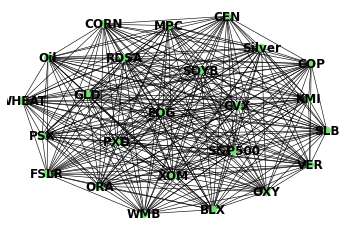

-------model initialization-------
-------Training begin-------
day 30  Epoch  0 Training MSE:  0.01648208685219288


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 30  Epoch  20 Training MSE:  6.445981125580147e-05
day 30  Epoch  40 Training MSE:  6.509368631668622e-06
day 30  Epoch  60 Training MSE:  1.5906375665508676e-06
day 30  Epoch  80 Training MSE:  7.078292583173607e-07
-------Testing begin-------
day 30  Test MSE:  3.374907748820988e-07
Test Data Truth:  tensor([[0.0408, 0.0493, 0.0429, 0.0471, 0.0410, 0.0464, 0.0483, 0.0510, 0.0450,
         0.0508, 0.0379, 0.0440, 0.0506, 0.0461, 0.0426, 0.0473, 0.0473, 0.0464,
         0.0465, 0.0488, 0.0433, 0.0434, 0.0430, 0.0425]])
Test Data prediction tensor([0.0406, 0.0495, 0.0422, 0.0472, 0.0405, 0.0458, 0.0481, 0.0500, 0.0441,
        0.0506, 0.0387, 0.0449, 0.0498, 0.0462, 0.0423, 0.0469, 0.0470, 0.0459,
        0.0457, 0.0492, 0.0437, 0.0439, 0.0429, 0.0437],
       grad_fn=<SliceBackward>)
day 30  Training time: 7.545601844787598
=================================Day  30 ======================================
-------data prepare-------
580
labels      OXY_Value  CVX_Value  XOM_Value  ... 

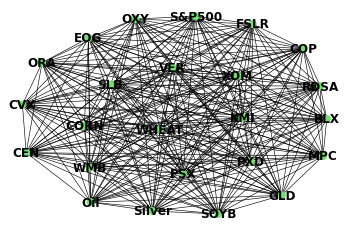

-------model initialization-------
-------Training begin-------
day 31  Epoch  0 Training MSE:  0.01356575358659029


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 31  Epoch  20 Training MSE:  5.574808528763242e-05
day 31  Epoch  40 Training MSE:  1.322773823630996e-05
day 31  Epoch  60 Training MSE:  2.975368033730774e-06
day 31  Epoch  80 Training MSE:  7.25656207123393e-07
-------Testing begin-------
day 31  Test MSE:  8.595548592893465e-07
Test Data Truth:  tensor([[0.0412, 0.0494, 0.0431, 0.0479, 0.0409, 0.0469, 0.0483, 0.0512, 0.0454,
         0.0506, 0.0391, 0.0435, 0.0505, 0.0461, 0.0428, 0.0476, 0.0474, 0.0465,
         0.0472, 0.0490, 0.0435, 0.0428, 0.0421, 0.0430]])
Test Data prediction tensor([0.0407, 0.0484, 0.0424, 0.0488, 0.0415, 0.0473, 0.0494, 0.0519, 0.0463,
        0.0512, 0.0386, 0.0442, 0.0508, 0.0475, 0.0421, 0.0486, 0.0478, 0.0466,
        0.0469, 0.0476, 0.0443, 0.0446, 0.0441, 0.0425],
       grad_fn=<SliceBackward>)
day 31  Training time: 7.837306976318359
=================================Day  31 ======================================
-------data prepare-------
580
labels      OXY_Value  CVX_Value  XOM_Value  ...  S

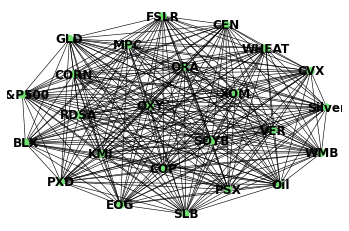

-------model initialization-------
-------Training begin-------
day 32  Epoch  0 Training MSE:  0.012957736849784851


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 32  Epoch  20 Training MSE:  5.046634396421723e-05
day 32  Epoch  40 Training MSE:  1.691101169853937e-05
day 32  Epoch  60 Training MSE:  2.7401899842516286e-06
day 32  Epoch  80 Training MSE:  3.2122341053764103e-07
-------Testing begin-------
day 32  Test MSE:  2.2080678263591835e-07
Test Data Truth:  tensor([[0.0413, 0.0494, 0.0427, 0.0483, 0.0411, 0.0468, 0.0483, 0.0511, 0.0444,
         0.0499, 0.0393, 0.0434, 0.0499, 0.0460, 0.0422, 0.0481, 0.0473, 0.0464,
         0.0476, 0.0490, 0.0434, 0.0432, 0.0423, 0.0438]])
Test Data prediction tensor([0.0410, 0.0490, 0.0430, 0.0476, 0.0413, 0.0467, 0.0477, 0.0512, 0.0455,
        0.0504, 0.0394, 0.0432, 0.0503, 0.0458, 0.0427, 0.0478, 0.0474, 0.0460,
        0.0472, 0.0487, 0.0430, 0.0424, 0.0420, 0.0428],
       grad_fn=<SliceBackward>)
day 32  Training time: 7.720862865447998
=================================Day  32 ======================================
-------data prepare-------
580
labels      OXY_Value  CVX_Value  XOM_Value  ..

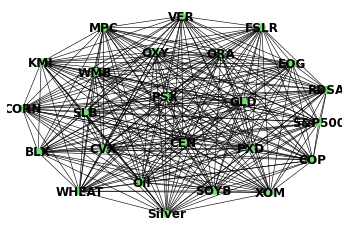

-------model initialization-------
-------Training begin-------
day 33  Epoch  0 Training MSE:  0.010462594218552113


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 33  Epoch  20 Training MSE:  5.013640839024447e-05
day 33  Epoch  40 Training MSE:  5.194401182961883e-06
day 33  Epoch  60 Training MSE:  9.84644316304184e-07
day 33  Epoch  80 Training MSE:  3.456378578903241e-07
-------Testing begin-------
day 33  Test MSE:  4.597740428380348e-07
Test Data Truth:  tensor([[0.0415, 0.0497, 0.0427, 0.0486, 0.0416, 0.0471, 0.0487, 0.0515, 0.0443,
         0.0500, 0.0398, 0.0430, 0.0499, 0.0485, 0.0420, 0.0472, 0.0479, 0.0471,
         0.0471, 0.0490, 0.0438, 0.0440, 0.0424, 0.0441]])
Test Data prediction tensor([0.0410, 0.0493, 0.0426, 0.0484, 0.0408, 0.0465, 0.0482, 0.0510, 0.0448,
        0.0498, 0.0392, 0.0435, 0.0499, 0.0462, 0.0424, 0.0480, 0.0473, 0.0462,
        0.0475, 0.0489, 0.0430, 0.0436, 0.0423, 0.0440],
       grad_fn=<SliceBackward>)
day 33  Training time: 7.653236389160156
=================================Day  33 ======================================
-------data prepare-------
580
labels      OXY_Value  CVX_Value  XOM_Value  ...  S

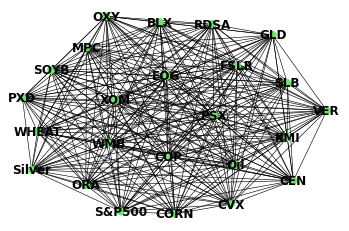

-------model initialization-------
-------Training begin-------
day 34  Epoch  0 Training MSE:  0.011632991023361683


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 34  Epoch  20 Training MSE:  6.444579048547894e-05
day 34  Epoch  40 Training MSE:  7.101886239979649e-06
day 34  Epoch  60 Training MSE:  1.4478545153906452e-06
day 34  Epoch  80 Training MSE:  1.3078238225716632e-06
-------Testing begin-------
day 34  Test MSE:  3.350819724801113e-06
Test Data Truth:  tensor([[0.0425, 0.0500, 0.0433, 0.0495, 0.0421, 0.0479, 0.0493, 0.0522, 0.0453,
         0.0509, 0.0406, 0.0433, 0.0498, 0.0442, 0.0428, 0.0473, 0.0474, 0.0464,
         0.0480, 0.0490, 0.0439, 0.0440, 0.0440, 0.0460]])
Test Data prediction tensor([0.0428, 0.0505, 0.0438, 0.0502, 0.0411, 0.0460, 0.0479, 0.0513, 0.0430,
        0.0499, 0.0394, 0.0436, 0.0497, 0.0500, 0.0417, 0.0505, 0.0483, 0.0482,
        0.0477, 0.0472, 0.0444, 0.0442, 0.0429, 0.0428],
       grad_fn=<SliceBackward>)
day 34  Training time: 7.597805738449097
=================================Day  34 ======================================
-------data prepare-------
576
labels      OXY_Value  CVX_Value  XOM_Value  ...

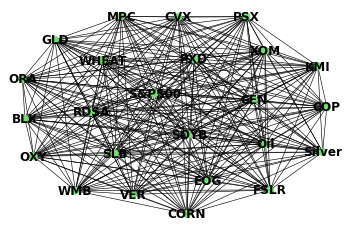

-------model initialization-------
-------Training begin-------
day 35  Epoch  0 Training MSE:  0.01362966001033783


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 35  Epoch  20 Training MSE:  0.00011086574522778392
day 35  Epoch  40 Training MSE:  1.2660863831115421e-05
day 35  Epoch  60 Training MSE:  1.4153166603136924e-06
day 35  Epoch  80 Training MSE:  1.3693058065200603e-07
-------Testing begin-------
day 35  Test MSE:  1.4575896045698755e-07
Test Data Truth:  tensor([[0.0425, 0.0498, 0.0432, 0.0492, 0.0416, 0.0482, 0.0495, 0.0521, 0.0449,
         0.0503, 0.0408, 0.0434, 0.0501, 0.0435, 0.0432, 0.0477, 0.0470, 0.0462,
         0.0488, 0.0491, 0.0441, 0.0440, 0.0437, 0.0455]])
Test Data prediction tensor([0.0426, 0.0498, 0.0432, 0.0494, 0.0419, 0.0478, 0.0494, 0.0521, 0.0452,
        0.0511, 0.0405, 0.0431, 0.0497, 0.0443, 0.0430, 0.0474, 0.0475, 0.0463,
        0.0482, 0.0484, 0.0441, 0.0440, 0.0438, 0.0461],
       grad_fn=<SliceBackward>)
day 35  Training time: 7.62526273727417
=================================Day  35 ======================================
-------data prepare-------
576
labels      OXY_Value  CVX_Value  XOM_Value  .

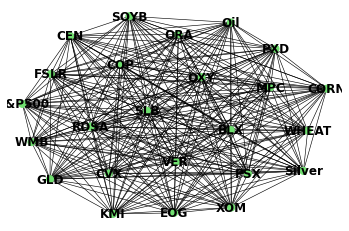

-------model initialization-------
-------Training begin-------
day 36  Epoch  0 Training MSE:  0.0079733245074749


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 36  Epoch  20 Training MSE:  3.676468622870743e-05
day 36  Epoch  40 Training MSE:  8.27080657472834e-06
day 36  Epoch  60 Training MSE:  1.547165993542876e-06
day 36  Epoch  80 Training MSE:  3.1972084002518386e-07
-------Testing begin-------
day 36  Test MSE:  1.24498092191061e-06
Test Data Truth:  tensor([[0.0429, 0.0498, 0.0435, 0.0498, 0.0417, 0.0485, 0.0497, 0.0519, 0.0444,
         0.0499, 0.0414, 0.0427, 0.0511, 0.0444, 0.0433, 0.0483, 0.0472, 0.0465,
         0.0485, 0.0491, 0.0440, 0.0438, 0.0433, 0.0456]])
Test Data prediction tensor([0.0419, 0.0486, 0.0439, 0.0488, 0.0416, 0.0479, 0.0493, 0.0522, 0.0450,
        0.0499, 0.0399, 0.0434, 0.0487, 0.0432, 0.0425, 0.0461, 0.0485, 0.0456,
        0.0477, 0.0502, 0.0451, 0.0459, 0.0434, 0.0450],
       grad_fn=<SliceBackward>)
day 36  Training time: 7.651886224746704
=================================Day  36 ======================================
-------data prepare-------
576
labels      OXY_Value  CVX_Value  XOM_Value  ...  S

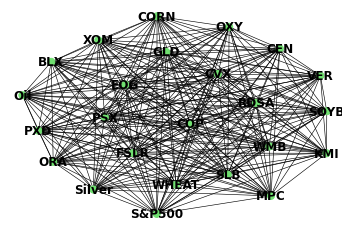

-------model initialization-------
-------Training begin-------
day 37  Epoch  0 Training MSE:  0.017853451892733574


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 37  Epoch  20 Training MSE:  7.988832658156753e-05
day 37  Epoch  40 Training MSE:  3.343160278745927e-05
day 37  Epoch  60 Training MSE:  1.1010039997927379e-05
day 37  Epoch  80 Training MSE:  4.401601017889334e-06
-------Testing begin-------
day 37  Test MSE:  5.424385108199203e-06
Test Data Truth:  tensor([[0.0428, 0.0499, 0.0439, 0.0496, 0.0418, 0.0482, 0.0497, 0.0521, 0.0444,
         0.0500, 0.0408, 0.0426, 0.0548, 0.0435, 0.0430, 0.0482, 0.0468, 0.0460,
         0.0488, 0.0491, 0.0443, 0.0440, 0.0435, 0.0464]])
Test Data prediction tensor([0.0437, 0.0502, 0.0461, 0.0517, 0.0405, 0.0463, 0.0505, 0.0502, 0.0451,
        0.0521, 0.0413, 0.0409, 0.0479, 0.0412, 0.0467, 0.0478, 0.0488, 0.0490,
        0.0452, 0.0515, 0.0445, 0.0437, 0.0445, 0.0448],
       grad_fn=<SliceBackward>)
day 37  Training time: 7.934432029724121
=================================Day  37 ======================================
-------data prepare-------
576
labels      OXY_Value  CVX_Value  XOM_Value  ... 

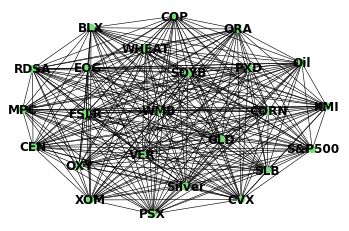

-------model initialization-------
-------Training begin-------
day 38  Epoch  0 Training MSE:  0.013614955358207226


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 38  Epoch  20 Training MSE:  6.038212450221181e-05
day 38  Epoch  40 Training MSE:  8.185349543055054e-06
day 38  Epoch  60 Training MSE:  1.9332908323121956e-06
day 38  Epoch  80 Training MSE:  5.47409968021384e-07
-------Testing begin-------
day 38  Test MSE:  2.9322632144612726e-07
Test Data Truth:  tensor([[0.0423, 0.0498, 0.0438, 0.0496, 0.0421, 0.0482, 0.0496, 0.0527, 0.0441,
         0.0500, 0.0408, 0.0424, 0.0528, 0.0433, 0.0431, 0.0487, 0.0471, 0.0462,
         0.0485, 0.0491, 0.0445, 0.0440, 0.0435, 0.0463]])
Test Data prediction tensor([0.0437, 0.0496, 0.0438, 0.0498, 0.0420, 0.0482, 0.0495, 0.0523, 0.0447,
        0.0502, 0.0406, 0.0423, 0.0545, 0.0435, 0.0427, 0.0483, 0.0462, 0.0461,
        0.0487, 0.0492, 0.0446, 0.0442, 0.0435, 0.0463],
       grad_fn=<SliceBackward>)
day 38  Training time: 7.987065076828003
=================================Day  38 ======================================
-------data prepare-------
576
labels      OXY_Value  CVX_Value  XOM_Value  ... 

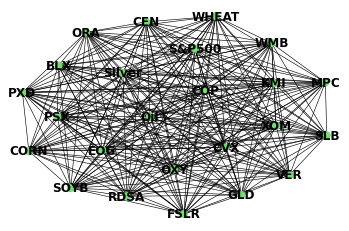

-------model initialization-------
-------Training begin-------
day 39  Epoch  0 Training MSE:  0.007826357148587704


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 39  Epoch  20 Training MSE:  5.4053296480560675e-05
day 39  Epoch  40 Training MSE:  6.742889581801137e-06
day 39  Epoch  60 Training MSE:  1.1579269312278484e-06
day 39  Epoch  80 Training MSE:  6.932307172746732e-08
-------Testing begin-------
day 39  Test MSE:  2.2769739871364436e-07
Test Data Truth:  tensor([[0.0422, 0.0498, 0.0436, 0.0499, 0.0419, 0.0484, 0.0501, 0.0525, 0.0439,
         0.0500, 0.0418, 0.0428, 0.0528, 0.0445, 0.0434, 0.0491, 0.0466, 0.0457,
         0.0493, 0.0490, 0.0449, 0.0447, 0.0439, 0.0461]])
Test Data prediction tensor([0.0425, 0.0499, 0.0437, 0.0497, 0.0420, 0.0481, 0.0500, 0.0525, 0.0439,
        0.0502, 0.0407, 0.0422, 0.0526, 0.0434, 0.0431, 0.0489, 0.0473, 0.0463,
        0.0487, 0.0490, 0.0445, 0.0438, 0.0436, 0.0462],
       grad_fn=<SliceBackward>)
day 39  Training time: 8.067328929901123
=================================Day  39 ======================================
-------data prepare-------
576
labels      OXY_Value  CVX_Value  XOM_Value  ..

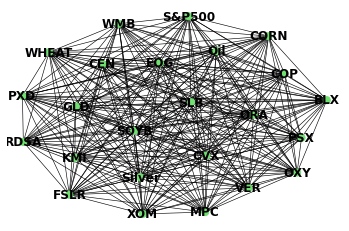

-------model initialization-------
-------Training begin-------
day 40  Epoch  0 Training MSE:  0.011481138877570629


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 40  Epoch  20 Training MSE:  6.68015272822231e-05
day 40  Epoch  40 Training MSE:  6.958095127629349e-06
day 40  Epoch  60 Training MSE:  1.309507638325158e-06
day 40  Epoch  80 Training MSE:  8.632454040480297e-08
-------Testing begin-------
day 40  Test MSE:  2.142993054121689e-07
Test Data Truth:  tensor([[0.0422, 0.0500, 0.0437, 0.0488, 0.0417, 0.0481, 0.0507, 0.0528, 0.0433,
         0.0504, 0.0423, 0.0434, 0.0525, 0.0445, 0.0437, 0.0492, 0.0463, 0.0446,
         0.0497, 0.0490, 0.0453, 0.0441, 0.0438, 0.0465]])
Test Data prediction tensor([0.0422, 0.0498, 0.0434, 0.0497, 0.0417, 0.0483, 0.0500, 0.0528, 0.0441,
        0.0500, 0.0419, 0.0429, 0.0529, 0.0446, 0.0433, 0.0491, 0.0466, 0.0455,
        0.0493, 0.0488, 0.0447, 0.0449, 0.0440, 0.0463],
       grad_fn=<SliceBackward>)
day 40  Training time: 7.85844612121582
=================================Day  40 ======================================
-------data prepare-------
576
labels      OXY_Value  CVX_Value  XOM_Value  ...  SO

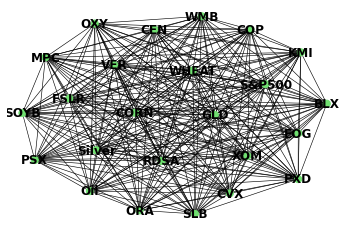

-------model initialization-------
-------Training begin-------
day 41  Epoch  0 Training MSE:  0.01329162996262312


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 41  Epoch  20 Training MSE:  6.305897841230035e-05
day 41  Epoch  40 Training MSE:  1.213535142596811e-05
day 41  Epoch  60 Training MSE:  1.2375468259051559e-06
day 41  Epoch  80 Training MSE:  1.933537561171761e-07
-------Testing begin-------
day 41  Test MSE:  2.544222752476344e-07
Test Data Truth:  tensor([[0.0424, 0.0499, 0.0437, 0.0489, 0.0416, 0.0480, 0.0506, 0.0529, 0.0433,
         0.0500, 0.0420, 0.0436, 0.0524, 0.0449, 0.0437, 0.0488, 0.0465, 0.0449,
         0.0508, 0.0490, 0.0449, 0.0437, 0.0438, 0.0466]])
Test Data prediction tensor([0.0419, 0.0497, 0.0436, 0.0486, 0.0416, 0.0482, 0.0504, 0.0525, 0.0433,
        0.0502, 0.0425, 0.0431, 0.0523, 0.0446, 0.0426, 0.0491, 0.0456, 0.0446,
        0.0493, 0.0490, 0.0454, 0.0440, 0.0440, 0.0468],
       grad_fn=<SliceBackward>)
day 41  Training time: 7.941981792449951
=================================Day  41 ======================================
-------data prepare-------
574
labels      OXY_Value  CVX_Value  XOM_Value  ... 

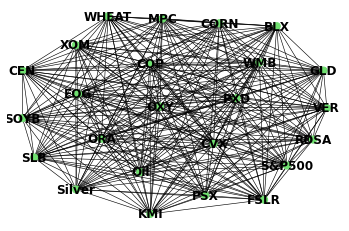

-------model initialization-------
-------Training begin-------
day 42  Epoch  0 Training MSE:  0.007717992644757032


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 42  Epoch  20 Training MSE:  5.426900679594837e-05
day 42  Epoch  40 Training MSE:  3.8436537579400465e-06
day 42  Epoch  60 Training MSE:  1.43528097851231e-06
day 42  Epoch  80 Training MSE:  5.904569775339041e-07
-------Testing begin-------
day 42  Test MSE:  8.925184715735668e-07
Test Data Truth:  tensor([[0.0424, 0.0503, 0.0438, 0.0493, 0.0416, 0.0481, 0.0506, 0.0529, 0.0439,
         0.0505, 0.0418, 0.0427, 0.0522, 0.0452, 0.0441, 0.0493, 0.0460, 0.0443,
         0.0503, 0.0491, 0.0449, 0.0438, 0.0439, 0.0474]])
Test Data prediction tensor([0.0421, 0.0491, 0.0442, 0.0476, 0.0422, 0.0483, 0.0506, 0.0538, 0.0445,
        0.0500, 0.0401, 0.0431, 0.0531, 0.0460, 0.0450, 0.0495, 0.0481, 0.0457,
        0.0512, 0.0480, 0.0445, 0.0433, 0.0434, 0.0474],
       grad_fn=<SliceBackward>)
day 42  Training time: 7.975883722305298
=================================Day  42 ======================================
-------data prepare-------
572
labels      OXY_Value  CVX_Value  XOM_Value  ...  

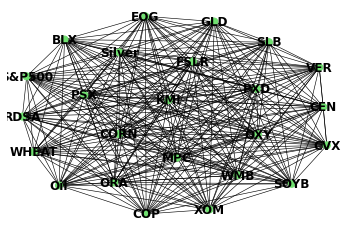

-------model initialization-------
-------Training begin-------
day 43  Epoch  0 Training MSE:  0.020026491954922676


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 43  Epoch  20 Training MSE:  7.758267020108178e-05
day 43  Epoch  40 Training MSE:  7.230732535390416e-06
day 43  Epoch  60 Training MSE:  9.061344030669716e-07
day 43  Epoch  80 Training MSE:  1.0808219741420544e-07
-------Testing begin-------
day 43  Test MSE:  1.6320659312896169e-07
Test Data Truth:  tensor([[0.0421, 0.0496, 0.0437, 0.0484, 0.0413, 0.0479, 0.0503, 0.0527, 0.0437,
         0.0501, 0.0416, 0.0424, 0.0524, 0.0455, 0.0441, 0.0495, 0.0459, 0.0442,
         0.0497, 0.0492, 0.0452, 0.0436, 0.0438, 0.0467]])
Test Data prediction tensor([0.0423, 0.0503, 0.0437, 0.0494, 0.0414, 0.0482, 0.0505, 0.0531, 0.0439,
        0.0506, 0.0417, 0.0427, 0.0522, 0.0452, 0.0440, 0.0494, 0.0460, 0.0441,
        0.0504, 0.0488, 0.0447, 0.0433, 0.0440, 0.0476],
       grad_fn=<SliceBackward>)
day 43  Training time: 7.972698211669922
=================================Day  43 ======================================
-------data prepare-------
570
labels      OXY_Value  CVX_Value  XOM_Value  ...

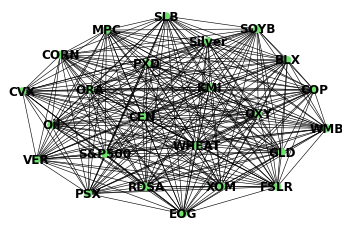

-------model initialization-------
-------Training begin-------
day 44  Epoch  0 Training MSE:  0.01211747620254755


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 44  Epoch  20 Training MSE:  6.554548599524423e-05
day 44  Epoch  40 Training MSE:  6.5767185333243106e-06
day 44  Epoch  60 Training MSE:  3.18667684950924e-06
day 44  Epoch  80 Training MSE:  1.2741594446197269e-06
-------Testing begin-------
day 44  Test MSE:  1.1094025467173196e-06
Test Data Truth:  tensor([[0.0422, 0.0499, 0.0439, 0.0485, 0.0413, 0.0481, 0.0506, 0.0528, 0.0437,
         0.0501, 0.0417, 0.0427, 0.0531, 0.0442, 0.0442, 0.0492, 0.0458, 0.0440,
         0.0506, 0.0494, 0.0457, 0.0438, 0.0442, 0.0461]])
Test Data prediction tensor([0.0414, 0.0497, 0.0426, 0.0491, 0.0417, 0.0469, 0.0493, 0.0516, 0.0438,
        0.0504, 0.0407, 0.0436, 0.0511, 0.0452, 0.0425, 0.0493, 0.0450, 0.0429,
        0.0487, 0.0490, 0.0443, 0.0435, 0.0430, 0.0454],
       grad_fn=<SliceBackward>)
day 44  Training time: 8.0681734085083
=================================Day  44 ======================================
-------data prepare-------
570
labels      OXY_Value  CVX_Value  XOM_Value  ...  

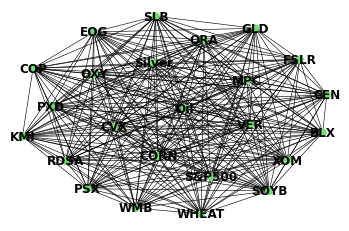

-------model initialization-------
-------Training begin-------
day 45  Epoch  0 Training MSE:  0.015958845615386963


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 45  Epoch  20 Training MSE:  5.9667003370122984e-05
day 45  Epoch  40 Training MSE:  5.83539622311946e-06
day 45  Epoch  60 Training MSE:  5.033543402532814e-06
day 45  Epoch  80 Training MSE:  1.236700200024643e-06
-------Testing begin-------
day 45  Test MSE:  7.518383426941e-07
Test Data Truth:  tensor([[0.0425, 0.0504, 0.0440, 0.0488, 0.0413, 0.0482, 0.0506, 0.0529, 0.0436,
         0.0500, 0.0417, 0.0428, 0.0536, 0.0450, 0.0441, 0.0492, 0.0464, 0.0446,
         0.0512, 0.0496, 0.0461, 0.0434, 0.0437, 0.0457]])
Test Data prediction tensor([0.0415, 0.0493, 0.0431, 0.0481, 0.0400, 0.0470, 0.0511, 0.0537, 0.0433,
        0.0495, 0.0432, 0.0433, 0.0539, 0.0438, 0.0435, 0.0486, 0.0467, 0.0446,
        0.0499, 0.0502, 0.0454, 0.0431, 0.0452, 0.0449],
       grad_fn=<SliceBackward>)
day 45  Training time: 8.10949969291687
=================================Day  45 ======================================
-------data prepare-------
570
labels      OXY_Value  CVX_Value  XOM_Value  ...  SOYB

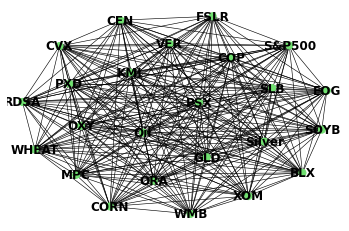

-------model initialization-------
-------Training begin-------
day 46  Epoch  0 Training MSE:  0.007299213204532862


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 46  Epoch  20 Training MSE:  4.235043888911605e-05
day 46  Epoch  40 Training MSE:  6.915381618455285e-06
day 46  Epoch  60 Training MSE:  1.1670508683891967e-06
day 46  Epoch  80 Training MSE:  2.4020417299652763e-07
-------Testing begin-------
day 46  Test MSE:  1.919742544487235e-06
Test Data Truth:  tensor([[0.0424, 0.0506, 0.0442, 0.0492, 0.0409, 0.0483, 0.0508, 0.0529, 0.0438,
         0.0502, 0.0412, 0.0428, 0.0534, 0.0445, 0.0441, 0.0492, 0.0458, 0.0437,
         0.0517, 0.0497, 0.0464, 0.0434, 0.0434, 0.0460]])
Test Data prediction tensor([0.0400, 0.0496, 0.0434, 0.0473, 0.0422, 0.0479, 0.0502, 0.0507, 0.0416,
        0.0490, 0.0417, 0.0421, 0.0549, 0.0454, 0.0432, 0.0499, 0.0476, 0.0435,
        0.0524, 0.0497, 0.0469, 0.0457, 0.0409, 0.0452],
       grad_fn=<SliceBackward>)
day 46  Training time: 8.506856918334961
=================================Day  46 ======================================
-------data prepare-------
570
labels      OXY_Value  CVX_Value  XOM_Value  ...

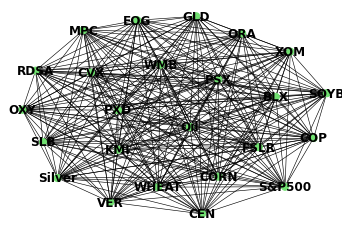

-------model initialization-------
-------Training begin-------
day 47  Epoch  0 Training MSE:  0.01077267900109291


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 47  Epoch  20 Training MSE:  4.4672564399661496e-05
day 47  Epoch  40 Training MSE:  1.3271785974211525e-05
day 47  Epoch  60 Training MSE:  1.2684328794421162e-05
day 47  Epoch  80 Training MSE:  2.2378135327016935e-06
-------Testing begin-------
day 47  Test MSE:  1.4422721505980007e-06
Test Data Truth:  tensor([[0.0423, 0.0505, 0.0441, 0.0494, 0.0407, 0.0481, 0.0511, 0.0532, 0.0434,
         0.0502, 0.0404, 0.0429, 0.0536, 0.0444, 0.0432, 0.0488, 0.0454, 0.0435,
         0.0521, 0.0497, 0.0471, 0.0435, 0.0433, 0.0454]])
Test Data prediction tensor([0.0428, 0.0499, 0.0456, 0.0499, 0.0401, 0.0495, 0.0500, 0.0531, 0.0453,
        0.0498, 0.0417, 0.0421, 0.0527, 0.0455, 0.0445, 0.0475, 0.0474, 0.0443,
        0.0500, 0.0492, 0.0450, 0.0447, 0.0427, 0.0446],
       grad_fn=<SliceBackward>)
day 47  Training time: 8.632823944091797
=================================Day  47 ======================================
-------data prepare-------
570
labels      OXY_Value  CVX_Value  XOM_Value  

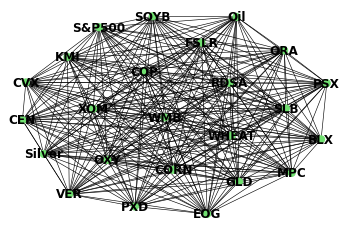

-------model initialization-------
-------Training begin-------
day 48  Epoch  0 Training MSE:  0.009808016009628773


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 48  Epoch  20 Training MSE:  4.40097828686703e-05
day 48  Epoch  40 Training MSE:  7.2236216510646045e-06
day 48  Epoch  60 Training MSE:  6.087652764108498e-07
day 48  Epoch  80 Training MSE:  1.5832976885121752e-07
-------Testing begin-------
day 48  Test MSE:  1.967973020100544e-07
Test Data Truth:  tensor([[0.0426, 0.0505, 0.0441, 0.0490, 0.0406, 0.0481, 0.0512, 0.0530, 0.0431,
         0.0497, 0.0398, 0.0430, 0.0541, 0.0449, 0.0424, 0.0487, 0.0456, 0.0437,
         0.0532, 0.0500, 0.0475, 0.0440, 0.0434, 0.0454]])
Test Data prediction tensor([0.0423, 0.0505, 0.0441, 0.0494, 0.0409, 0.0481, 0.0512, 0.0533, 0.0435,
        0.0502, 0.0404, 0.0430, 0.0536, 0.0444, 0.0433, 0.0487, 0.0453, 0.0434,
        0.0521, 0.0498, 0.0470, 0.0434, 0.0434, 0.0453],
       grad_fn=<SliceBackward>)
day 48  Training time: 8.41895580291748
=================================Day  48 ======================================
-------data prepare-------
570
labels      OXY_Value  CVX_Value  XOM_Value  ...  

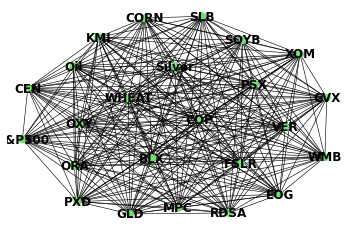

-------model initialization-------
-------Training begin-------
day 49  Epoch  0 Training MSE:  0.019076913595199585


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 49  Epoch  20 Training MSE:  9.27434884943068e-05
day 49  Epoch  40 Training MSE:  1.0537619345996063e-05
day 49  Epoch  60 Training MSE:  5.589053671428701e-06
day 49  Epoch  80 Training MSE:  3.7474669056791754e-07
-------Testing begin-------
day 49  Test MSE:  6.475934242189396e-07
Test Data Truth:  tensor([[0.0427, 0.0510, 0.0443, 0.0493, 0.0404, 0.0484, 0.0492, 0.0524, 0.0432,
         0.0499, 0.0397, 0.0423, 0.0547, 0.0446, 0.0422, 0.0487, 0.0452, 0.0431,
         0.0535, 0.0499, 0.0475, 0.0442, 0.0435, 0.0456]])
Test Data prediction tensor([0.0420, 0.0506, 0.0434, 0.0496, 0.0399, 0.0487, 0.0513, 0.0530, 0.0428,
        0.0499, 0.0390, 0.0444, 0.0538, 0.0446, 0.0419, 0.0482, 0.0459, 0.0435,
        0.0531, 0.0503, 0.0483, 0.0435, 0.0435, 0.0450],
       grad_fn=<SliceBackward>)
day 49  Training time: 8.015510082244873
=================================Day  49 ======================================
-------data prepare-------
570
labels      OXY_Value  CVX_Value  XOM_Value  ... 

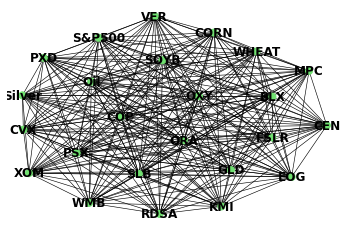

-------model initialization-------
-------Training begin-------
day 50  Epoch  0 Training MSE:  0.014116767793893814


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 50  Epoch  20 Training MSE:  5.943395080976188e-05
day 50  Epoch  40 Training MSE:  7.386132438114146e-06
day 50  Epoch  60 Training MSE:  9.904050557452138e-07
day 50  Epoch  80 Training MSE:  6.524471132252074e-07
-------Testing begin-------
day 50  Test MSE:  1.5824389265617356e-07
Test Data Truth:  tensor([[0.0426, 0.0510, 0.0443, 0.0493, 0.0402, 0.0485, 0.0491, 0.0531, 0.0429,
         0.0498, 0.0402, 0.0421, 0.0549, 0.0446, 0.0416, 0.0479, 0.0450, 0.0430,
         0.0526, 0.0499, 0.0479, 0.0439, 0.0434, 0.0447]])
Test Data prediction tensor([0.0428, 0.0510, 0.0444, 0.0490, 0.0405, 0.0488, 0.0491, 0.0526, 0.0430,
        0.0505, 0.0397, 0.0421, 0.0543, 0.0442, 0.0416, 0.0489, 0.0452, 0.0425,
        0.0530, 0.0504, 0.0474, 0.0439, 0.0436, 0.0450],
       grad_fn=<SliceBackward>)
day 50  Training time: 7.925754547119141
=================================Day  50 ======================================
-------data prepare-------
570
labels      OXY_Value  CVX_Value  XOM_Value  ... 

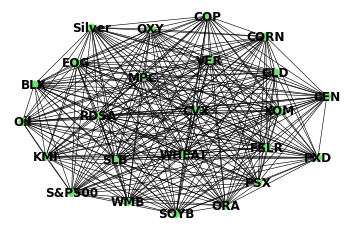

-------model initialization-------
-------Training begin-------
day 51  Epoch  0 Training MSE:  0.010912355966866016


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 51  Epoch  20 Training MSE:  5.36278857907746e-05
day 51  Epoch  40 Training MSE:  6.229853170225397e-06
day 51  Epoch  60 Training MSE:  1.2448480219973135e-06
day 51  Epoch  80 Training MSE:  2.158214442715689e-07
-------Testing begin-------
day 51  Test MSE:  1.6140915022333502e-06
Test Data Truth:  tensor([[0.0426, 0.0501, 0.0442, 0.0493, 0.0398, 0.0481, 0.0489, 0.0534, 0.0427,
         0.0494, 0.0401, 0.0421, 0.0561, 0.0443, 0.0410, 0.0480, 0.0452, 0.0434,
         0.0526, 0.0500, 0.0478, 0.0439, 0.0434, 0.0447]])
Test Data prediction tensor([0.0435, 0.0518, 0.0465, 0.0507, 0.0401, 0.0491, 0.0494, 0.0553, 0.0449,
        0.0507, 0.0406, 0.0426, 0.0551, 0.0464, 0.0410, 0.0473, 0.0466, 0.0413,
        0.0529, 0.0500, 0.0475, 0.0452, 0.0425, 0.0453],
       grad_fn=<SliceBackward>)
day 51  Training time: 7.879469633102417
=================================Day  51 ======================================
-------data prepare-------
572
labels      OXY_Value  CVX_Value  XOM_Value  ... 

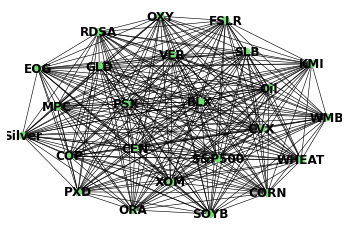

-------model initialization-------
-------Training begin-------
day 52  Epoch  0 Training MSE:  0.00945581216365099


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 52  Epoch  20 Training MSE:  4.7918114432832226e-05
day 52  Epoch  40 Training MSE:  1.0179952369071543e-05
day 52  Epoch  60 Training MSE:  9.509753908787388e-07
day 52  Epoch  80 Training MSE:  4.1250817162108433e-07
-------Testing begin-------
day 52  Test MSE:  3.397092598333984e-07
Test Data Truth:  tensor([[0.0427, 0.0501, 0.0442, 0.0493, 0.0390, 0.0477, 0.0490, 0.0537, 0.0429,
         0.0493, 0.0395, 0.0415, 0.0557, 0.0449, 0.0408, 0.0479, 0.0452, 0.0431,
         0.0510, 0.0501, 0.0479, 0.0438, 0.0430, 0.0446]])
Test Data prediction tensor([0.0421, 0.0498, 0.0444, 0.0493, 0.0395, 0.0481, 0.0487, 0.0537, 0.0421,
        0.0492, 0.0405, 0.0418, 0.0565, 0.0437, 0.0405, 0.0480, 0.0455, 0.0431,
        0.0527, 0.0501, 0.0473, 0.0437, 0.0432, 0.0444],
       grad_fn=<SliceBackward>)
day 52  Training time: 7.8404951095581055
=================================Day  52 ======================================
-------data prepare-------
572
labels      OXY_Value  CVX_Value  XOM_Value  .

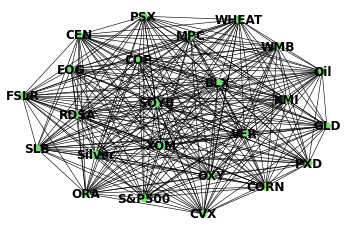

-------model initialization-------
-------Training begin-------
day 53  Epoch  0 Training MSE:  0.018999798223376274


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 53  Epoch  20 Training MSE:  6.505312194349244e-05
day 53  Epoch  40 Training MSE:  7.984092917467933e-06
day 53  Epoch  60 Training MSE:  5.860042165295454e-06
day 53  Epoch  80 Training MSE:  2.327360334675177e-06
-------Testing begin-------
day 53  Test MSE:  3.85043222195236e-07
Test Data Truth:  tensor([[0.0431, 0.0503, 0.0444, 0.0498, 0.0382, 0.0482, 0.0492, 0.0540, 0.0423,
         0.0488, 0.0400, 0.0412, 0.0561, 0.0450, 0.0406, 0.0485, 0.0449, 0.0431,
         0.0498, 0.0500, 0.0485, 0.0451, 0.0434, 0.0441]])
Test Data prediction tensor([0.0434, 0.0498, 0.0459, 0.0498, 0.0384, 0.0480, 0.0489, 0.0543, 0.0430,
        0.0498, 0.0394, 0.0420, 0.0557, 0.0444, 0.0406, 0.0481, 0.0446, 0.0434,
        0.0514, 0.0502, 0.0481, 0.0442, 0.0434, 0.0442],
       grad_fn=<SliceBackward>)
day 53  Training time: 8.0173819065094
=================================Day  53 ======================================
-------data prepare-------
572
labels      OXY_Value  CVX_Value  XOM_Value  ...  SOY

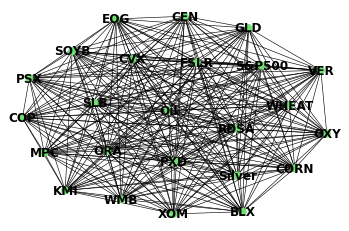

-------model initialization-------
-------Training begin-------
day 54  Epoch  0 Training MSE:  0.01321758795529604


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 54  Epoch  20 Training MSE:  5.85541820328217e-05
day 54  Epoch  40 Training MSE:  8.250657629105262e-06
day 54  Epoch  60 Training MSE:  9.082706924345985e-07
day 54  Epoch  80 Training MSE:  5.40692496997508e-07
-------Testing begin-------
day 54  Test MSE:  3.5405199128035747e-07
Test Data Truth:  tensor([[0.0429, 0.0504, 0.0445, 0.0498, 0.0374, 0.0483, 0.0494, 0.0530, 0.0416,
         0.0480, 0.0398, 0.0408, 0.0561, 0.0461, 0.0400, 0.0476, 0.0454, 0.0439,
         0.0502, 0.0501, 0.0483, 0.0453, 0.0437, 0.0451]])
Test Data prediction tensor([0.0434, 0.0504, 0.0445, 0.0499, 0.0381, 0.0485, 0.0495, 0.0540, 0.0421,
        0.0493, 0.0399, 0.0414, 0.0560, 0.0447, 0.0405, 0.0486, 0.0450, 0.0430,
        0.0497, 0.0500, 0.0487, 0.0454, 0.0433, 0.0452],
       grad_fn=<SliceBackward>)
day 54  Training time: 7.892164945602417
=================================Day  54 ======================================
-------data prepare-------
572
labels      OXY_Value  CVX_Value  XOM_Value  ...  S

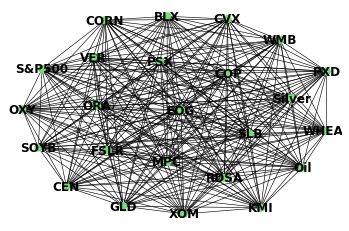

-------model initialization-------
-------Training begin-------
day 55  Epoch  0 Training MSE:  0.012913229875266552


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 55  Epoch  20 Training MSE:  5.527753455680795e-05
day 55  Epoch  40 Training MSE:  7.227818514365936e-06
day 55  Epoch  60 Training MSE:  1.5282331560229068e-06
day 55  Epoch  80 Training MSE:  3.9687225239504187e-07
-------Testing begin-------
day 55  Test MSE:  1.8133776791273704e-07
Test Data Truth:  tensor([[0.0434, 0.0506, 0.0446, 0.0505, 0.0377, 0.0480, 0.0498, 0.0536, 0.0420,
         0.0479, 0.0396, 0.0407, 0.0562, 0.0458, 0.0398, 0.0479, 0.0456, 0.0442,
         0.0501, 0.0501, 0.0486, 0.0450, 0.0436, 0.0448]])
Test Data prediction tensor([0.0429, 0.0505, 0.0446, 0.0503, 0.0371, 0.0484, 0.0493, 0.0533, 0.0417,
        0.0481, 0.0401, 0.0411, 0.0562, 0.0465, 0.0406, 0.0478, 0.0452, 0.0437,
        0.0503, 0.0501, 0.0478, 0.0457, 0.0437, 0.0449],
       grad_fn=<SliceBackward>)
day 55  Training time: 7.881554365158081
=================================Day  55 ======================================
-------data prepare-------
572
labels      OXY_Value  CVX_Value  XOM_Value  ..

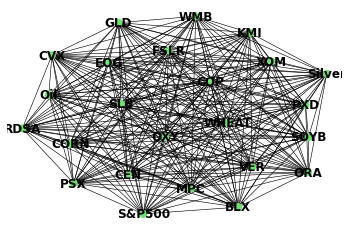

-------model initialization-------
-------Training begin-------
day 56  Epoch  0 Training MSE:  0.016796840354800224


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 56  Epoch  20 Training MSE:  6.174447480589151e-05
day 56  Epoch  40 Training MSE:  6.940056209714385e-06
day 56  Epoch  60 Training MSE:  7.524159286731447e-07
day 56  Epoch  80 Training MSE:  1.7368738269851747e-07
-------Testing begin-------
day 56  Test MSE:  7.212163836811669e-06
Test Data Truth:  tensor([[0.0431, 0.0502, 0.0445, 0.0495, 0.0383, 0.0479, 0.0497, 0.0531, 0.0413,
         0.0472, 0.0393, 0.0399, 0.0553, 0.0447, 0.0381, 0.0479, 0.0457, 0.0445,
         0.0511, 0.0502, 0.0480, 0.0447, 0.0434, 0.0447]])
Test Data prediction tensor([0.0483, 0.0470, 0.0465, 0.0470, 0.0393, 0.0434, 0.0473, 0.0492, 0.0390,
        0.0477, 0.0363, 0.0408, 0.0572, 0.0432, 0.0356, 0.0435, 0.0454, 0.0462,
        0.0469, 0.0516, 0.0465, 0.0446, 0.0406, 0.0431],
       grad_fn=<SliceBackward>)
day 56  Training time: 7.992946147918701
=================================Day  56 ======================================
-------data prepare-------
572
labels      OXY_Value  CVX_Value  XOM_Value  ... 

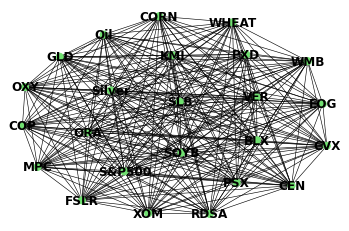

-------model initialization-------
-------Training begin-------
day 57  Epoch  0 Training MSE:  0.01156932208687067


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 57  Epoch  20 Training MSE:  3.653568637673743e-05
day 57  Epoch  40 Training MSE:  7.853425813664217e-06
day 57  Epoch  60 Training MSE:  1.6037560044424026e-06
day 57  Epoch  80 Training MSE:  2.7679774916578026e-07
-------Testing begin-------
day 57  Test MSE:  6.765203011127596e-07
Test Data Truth:  tensor([[0.0426, 0.0502, 0.0446, 0.0510, 0.0383, 0.0483, 0.0494, 0.0538, 0.0414,
         0.0473, 0.0394, 0.0396, 0.0556, 0.0452, 0.0388, 0.0477, 0.0459, 0.0447,
         0.0497, 0.0502, 0.0482, 0.0446, 0.0434, 0.0442]])
Test Data prediction tensor([0.0430, 0.0509, 0.0444, 0.0485, 0.0377, 0.0473, 0.0490, 0.0524, 0.0420,
        0.0482, 0.0395, 0.0394, 0.0552, 0.0448, 0.0377, 0.0473, 0.0455, 0.0444,
        0.0508, 0.0502, 0.0474, 0.0455, 0.0441, 0.0443],
       grad_fn=<SliceBackward>)
day 57  Training time: 7.9531331062316895
=================================Day  57 ======================================
-------data prepare-------
572
labels      OXY_Value  CVX_Value  XOM_Value  ..

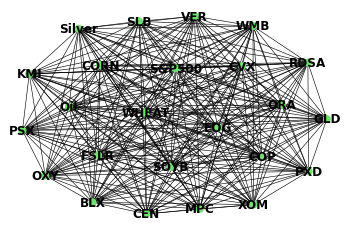

-------model initialization-------
-------Training begin-------
day 58  Epoch  0 Training MSE:  0.008568021468818188


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 58  Epoch  20 Training MSE:  2.1405639927252196e-05
day 58  Epoch  40 Training MSE:  7.1918516368896235e-06
day 58  Epoch  60 Training MSE:  2.511749471523217e-06
day 58  Epoch  80 Training MSE:  1.761100492103651e-07
-------Testing begin-------
day 58  Test MSE:  3.810071575571783e-06
Test Data Truth:  tensor([[0.0429, 0.0482, 0.0447, 0.0508, 0.0384, 0.0490, 0.0498, 0.0550, 0.0414,
         0.0477, 0.0402, 0.0404, 0.0566, 0.0544, 0.0396, 0.0476, 0.0459, 0.0448,
         0.0495, 0.0502, 0.0483, 0.0448, 0.0434, 0.0445]])
Test Data prediction tensor([0.0428, 0.0508, 0.0445, 0.0509, 0.0386, 0.0490, 0.0496, 0.0539, 0.0412,
        0.0472, 0.0399, 0.0400, 0.0555, 0.0455, 0.0398, 0.0473, 0.0464, 0.0452,
        0.0499, 0.0507, 0.0475, 0.0442, 0.0435, 0.0449],
       grad_fn=<SliceBackward>)
day 58  Training time: 8.106201887130737
=================================Day  58 ======================================
-------data prepare-------
572
labels      OXY_Value  CVX_Value  XOM_Value  ...

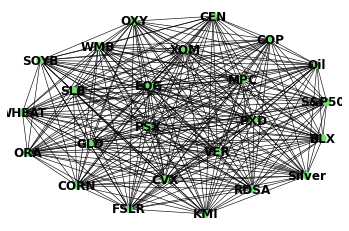

-------model initialization-------
-------Training begin-------
day 59  Epoch  0 Training MSE:  0.012227247469127178


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 59  Epoch  20 Training MSE:  6.128595123300329e-05
day 59  Epoch  40 Training MSE:  1.057929785019951e-05
day 59  Epoch  60 Training MSE:  3.0549119856004836e-06
day 59  Epoch  80 Training MSE:  7.526830927417905e-07
-------Testing begin-------
day 59  Test MSE:  1.136278001467872e-06
Test Data Truth:  tensor([[0.0431, 0.0492, 0.0448, 0.0516, 0.0388, 0.0509, 0.0500, 0.0572, 0.0417,
         0.0479, 0.0426, 0.0403, 0.0555, 0.0540, 0.0404, 0.0467, 0.0462, 0.0452,
         0.0507, 0.0505, 0.0483, 0.0444, 0.0429, 0.0438]])
Test Data prediction tensor([0.0436, 0.0483, 0.0448, 0.0510, 0.0387, 0.0485, 0.0500, 0.0548, 0.0412,
        0.0480, 0.0402, 0.0400, 0.0567, 0.0547, 0.0392, 0.0474, 0.0462, 0.0444,
        0.0494, 0.0503, 0.0488, 0.0450, 0.0437, 0.0445],
       grad_fn=<SliceBackward>)
day 59  Training time: 8.03508448600769
=================================Day  59 ======================================
-------data prepare-------
572
labels      OXY_Value  CVX_Value  XOM_Value  ...  

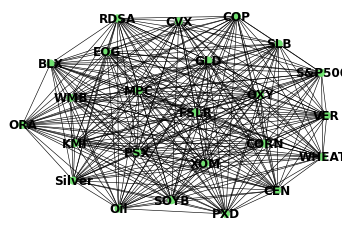

-------model initialization-------
-------Training begin-------
day 60  Epoch  0 Training MSE:  0.017912639304995537


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 60  Epoch  20 Training MSE:  6.434007809730247e-05
day 60  Epoch  40 Training MSE:  1.1848129361169413e-05
day 60  Epoch  60 Training MSE:  1.6876268773557968e-06
day 60  Epoch  80 Training MSE:  2.9459616257554444e-07
-------Testing begin-------
day 60  Test MSE:  8.555892350159411e-07
Test Data Truth:  tensor([[0.0447, 0.0489, 0.0447, 0.0520, 0.0382, 0.0513, 0.0506, 0.0584, 0.0409,
         0.0468, 0.0409, 0.0405, 0.0560, 0.0546, 0.0394, 0.0471, 0.0458, 0.0447,
         0.0502, 0.0503, 0.0480, 0.0445, 0.0436, 0.0448]])
Test Data prediction tensor([0.0430, 0.0504, 0.0447, 0.0517, 0.0390, 0.0514, 0.0496, 0.0569, 0.0417,
        0.0489, 0.0417, 0.0401, 0.0560, 0.0552, 0.0411, 0.0466, 0.0457, 0.0448,
        0.0497, 0.0504, 0.0481, 0.0454, 0.0428, 0.0440],
       grad_fn=<SliceBackward>)
day 60  Training time: 8.053170680999756
=================================Day  60 ======================================
-------data prepare-------
574
labels      OXY_Value  CVX_Value  XOM_Value  ..

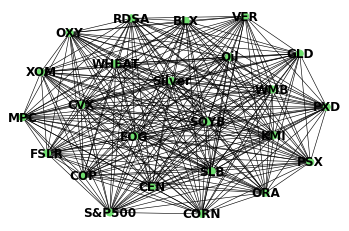

-------model initialization-------
-------Training begin-------
day 61  Epoch  0 Training MSE:  0.01762801595032215


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 61  Epoch  20 Training MSE:  4.290232391213067e-05
day 61  Epoch  40 Training MSE:  1.2501147466537077e-05
day 61  Epoch  60 Training MSE:  3.122835778412991e-06
day 61  Epoch  80 Training MSE:  7.010874924162636e-06
-------Testing begin-------
day 61  Test MSE:  1.0448354260006454e-05
Test Data Truth:  tensor([[0.0450, 0.0488, 0.0445, 0.0525, 0.0384, 0.0520, 0.0507, 0.0585, 0.0408,
         0.0471, 0.0416, 0.0405, 0.0560, 0.0565, 0.0399, 0.0471, 0.0455, 0.0442,
         0.0502, 0.0503, 0.0483, 0.0443, 0.0438, 0.0451]])
Test Data prediction tensor([0.0401, 0.0456, 0.0444, 0.0479, 0.0404, 0.0547, 0.0547, 0.0558, 0.0397,
        0.0442, 0.0422, 0.0409, 0.0580, 0.0573, 0.0335, 0.0483, 0.0527, 0.0459,
        0.0511, 0.0500, 0.0459, 0.0408, 0.0391, 0.0421],
       grad_fn=<SliceBackward>)
day 61  Training time: 7.946232318878174
=================================Day  61 ======================================
-------data prepare-------
574
labels      OXY_Value  CVX_Value  XOM_Value  ...

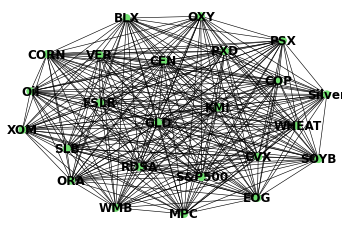

-------model initialization-------
-------Training begin-------
day 62  Epoch  0 Training MSE:  0.012323939241468906


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 62  Epoch  20 Training MSE:  5.367048652260564e-05
day 62  Epoch  40 Training MSE:  1.0040238521469291e-05
day 62  Epoch  60 Training MSE:  1.195157551592274e-06
day 62  Epoch  80 Training MSE:  2.674688630577293e-07
-------Testing begin-------
day 62  Test MSE:  1.2266798421478597e-06
Test Data Truth:  tensor([[0.0453, 0.0496, 0.0448, 0.0532, 0.0405, 0.0533, 0.0512, 0.0586, 0.0416,
         0.0479, 0.0439, 0.0412, 0.0562, 0.0580, 0.0406, 0.0469, 0.0454, 0.0441,
         0.0509, 0.0502, 0.0484, 0.0443, 0.0436, 0.0447]])
Test Data prediction tensor([0.0452, 0.0494, 0.0441, 0.0527, 0.0389, 0.0514, 0.0506, 0.0592, 0.0404,
        0.0468, 0.0407, 0.0408, 0.0569, 0.0559, 0.0398, 0.0479, 0.0459, 0.0446,
        0.0501, 0.0498, 0.0490, 0.0449, 0.0437, 0.0444],
       grad_fn=<SliceBackward>)
day 62  Training time: 7.860927581787109
=================================Day  62 ======================================
-------data prepare-------
574
labels      OXY_Value  CVX_Value  XOM_Value  ...

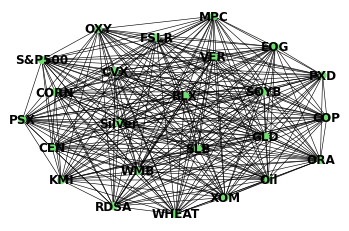

-------model initialization-------
-------Training begin-------
day 63  Epoch  0 Training MSE:  0.008329550735652447


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 63  Epoch  20 Training MSE:  6.20623177383095e-05
day 63  Epoch  40 Training MSE:  8.496134796587285e-06
day 63  Epoch  60 Training MSE:  4.0508125493943226e-06
day 63  Epoch  80 Training MSE:  1.7184416947202408e-06
-------Testing begin-------
day 63  Test MSE:  3.921087682101643e-06
Test Data Truth:  tensor([[0.0453, 0.0497, 0.0447, 0.0530, 0.0401, 0.0528, 0.0512, 0.0593, 0.0415,
         0.0479, 0.0447, 0.0411, 0.0566, 0.0575, 0.0411, 0.0464, 0.0455, 0.0446,
         0.0515, 0.0503, 0.0482, 0.0441, 0.0436, 0.0443]])
Test Data prediction tensor([0.0424, 0.0505, 0.0456, 0.0513, 0.0424, 0.0548, 0.0524, 0.0565, 0.0415,
        0.0515, 0.0459, 0.0404, 0.0572, 0.0579, 0.0433, 0.0477, 0.0449, 0.0401,
        0.0533, 0.0523, 0.0484, 0.0427, 0.0433, 0.0477],
       grad_fn=<SliceBackward>)
day 63  Training time: 7.954118967056274
=================================Day  63 ======================================
-------data prepare-------
572
labels      OXY_Value  CVX_Value  XOM_Value  ... 

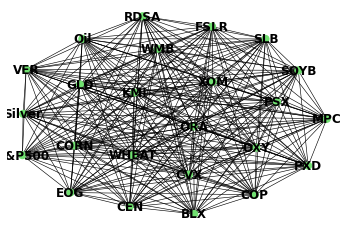

-------model initialization-------
-------Training begin-------
day 64  Epoch  0 Training MSE:  0.01730327121913433


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 64  Epoch  20 Training MSE:  3.962781556765549e-05
day 64  Epoch  40 Training MSE:  5.544614396058023e-06
day 64  Epoch  60 Training MSE:  2.7374114779377123e-06
day 64  Epoch  80 Training MSE:  2.1087837467348436e-06
-------Testing begin-------
day 64  Test MSE:  6.604518603126053e-07
Test Data Truth:  tensor([[0.0449, 0.0495, 0.0446, 0.0530, 0.0405, 0.0520, 0.0512, 0.0594, 0.0414,
         0.0473, 0.0441, 0.0415, 0.0548, 0.0583, 0.0406, 0.0471, 0.0452, 0.0441,
         0.0516, 0.0506, 0.0483, 0.0443, 0.0433, 0.0439]])
Test Data prediction tensor([0.0454, 0.0501, 0.0450, 0.0533, 0.0399, 0.0531, 0.0515, 0.0595, 0.0416,
        0.0474, 0.0453, 0.0413, 0.0575, 0.0571, 0.0414, 0.0462, 0.0460, 0.0443,
        0.0521, 0.0502, 0.0485, 0.0447, 0.0434, 0.0444],
       grad_fn=<SliceBackward>)
day 64  Training time: 7.927337884902954
=================================Day  64 ======================================
-------data prepare-------
570
labels      OXY_Value  CVX_Value  XOM_Value  ...

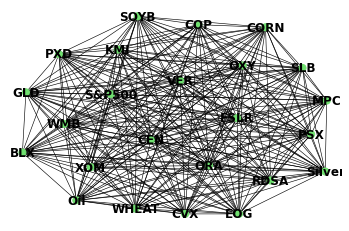

-------model initialization-------
-------Training begin-------
day 65  Epoch  0 Training MSE:  0.014311172068119049


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 65  Epoch  20 Training MSE:  4.6161931095412e-05
day 65  Epoch  40 Training MSE:  3.7881820844631875e-06
day 65  Epoch  60 Training MSE:  4.7161037741716427e-07
day 65  Epoch  80 Training MSE:  1.2614617617145996e-07
-------Testing begin-------
day 65  Test MSE:  2.775028917767486e-07
Test Data Truth:  tensor([[0.0453, 0.0497, 0.0449, 0.0531, 0.0404, 0.0522, 0.0512, 0.0580, 0.0412,
         0.0477, 0.0446, 0.0418, 0.0551, 0.0571, 0.0398, 0.0473, 0.0454, 0.0444,
         0.0520, 0.0504, 0.0482, 0.0442, 0.0433, 0.0437]])
Test Data prediction tensor([0.0446, 0.0496, 0.0446, 0.0528, 0.0404, 0.0519, 0.0513, 0.0595, 0.0413,
        0.0473, 0.0441, 0.0416, 0.0547, 0.0583, 0.0407, 0.0471, 0.0454, 0.0440,
        0.0513, 0.0506, 0.0482, 0.0444, 0.0434, 0.0439],
       grad_fn=<SliceBackward>)
day 65  Training time: 7.976942300796509
=================================Day  65 ======================================
-------data prepare-------
570
labels      OXY_Value  CVX_Value  XOM_Value  ... 

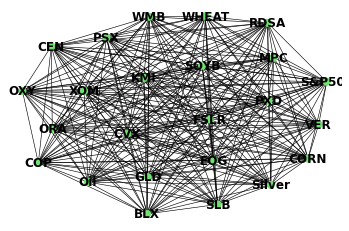

-------model initialization-------
-------Training begin-------
day 66  Epoch  0 Training MSE:  0.01002387423068285


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 66  Epoch  20 Training MSE:  5.711331687052734e-05
day 66  Epoch  40 Training MSE:  8.425544365309179e-06
day 66  Epoch  60 Training MSE:  1.3053471548118978e-06
day 66  Epoch  80 Training MSE:  7.473303753613436e-08
-------Testing begin-------
day 66  Test MSE:  1.9870181233727635e-07
Test Data Truth:  tensor([[0.0449, 0.0497, 0.0443, 0.0525, 0.0397, 0.0521, 0.0507, 0.0580, 0.0406,
         0.0477, 0.0440, 0.0420, 0.0547, 0.0581, 0.0394, 0.0469, 0.0451, 0.0439,
         0.0518, 0.0505, 0.0485, 0.0446, 0.0433, 0.0429]])
Test Data prediction tensor([0.0454, 0.0497, 0.0449, 0.0527, 0.0404, 0.0522, 0.0511, 0.0580, 0.0409,
        0.0478, 0.0446, 0.0418, 0.0551, 0.0571, 0.0398, 0.0473, 0.0455, 0.0443,
        0.0518, 0.0506, 0.0482, 0.0441, 0.0433, 0.0439],
       grad_fn=<SliceBackward>)
day 66  Training time: 8.041887760162354
=================================Day  66 ======================================
-------data prepare-------
570
labels      OXY_Value  CVX_Value  XOM_Value  ...

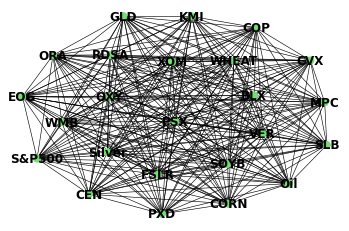

-------model initialization-------
-------Training begin-------
day 67  Epoch  0 Training MSE:  0.008162681013345718


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 67  Epoch  20 Training MSE:  5.406435229815543e-05
day 67  Epoch  40 Training MSE:  7.84910298534669e-06
day 67  Epoch  60 Training MSE:  2.1108464807184646e-06
day 67  Epoch  80 Training MSE:  8.068495276347676e-07
-------Testing begin-------
day 67  Test MSE:  3.297445516636799e-07
Test Data Truth:  tensor([[0.0448, 0.0497, 0.0443, 0.0521, 0.0393, 0.0520, 0.0506, 0.0585, 0.0401,
         0.0470, 0.0434, 0.0421, 0.0538, 0.0581, 0.0385, 0.0471, 0.0453, 0.0441,
         0.0518, 0.0506, 0.0487, 0.0449, 0.0435, 0.0438]])
Test Data prediction tensor([0.0448, 0.0495, 0.0448, 0.0521, 0.0403, 0.0517, 0.0501, 0.0577, 0.0402,
        0.0469, 0.0438, 0.0414, 0.0552, 0.0583, 0.0393, 0.0467, 0.0452, 0.0446,
        0.0517, 0.0499, 0.0486, 0.0440, 0.0430, 0.0431],
       grad_fn=<SliceBackward>)
day 67  Training time: 8.1923828125
=================================Day  67 ======================================
-------data prepare-------
572
labels      OXY_Value  CVX_Value  XOM_Value  ...  SOYB_

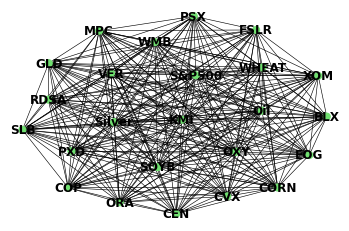

-------model initialization-------
-------Training begin-------
day 68  Epoch  0 Training MSE:  0.014383344911038876


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 68  Epoch  20 Training MSE:  5.0768994697136804e-05
day 68  Epoch  40 Training MSE:  4.552604423224693e-06
day 68  Epoch  60 Training MSE:  1.2589166544785257e-06
day 68  Epoch  80 Training MSE:  1.0343059102524421e-06
-------Testing begin-------
day 68  Test MSE:  1.5552435570498346e-06
Test Data Truth:  tensor([[0.0444, 0.0496, 0.0440, 0.0508, 0.0379, 0.0510, 0.0503, 0.0591, 0.0401,
         0.0462, 0.0423, 0.0416, 0.0547, 0.0578, 0.0378, 0.0474, 0.0449, 0.0435,
         0.0516, 0.0506, 0.0489, 0.0444, 0.0434, 0.0439]])
Test Data prediction tensor([0.0436, 0.0497, 0.0439, 0.0521, 0.0383, 0.0531, 0.0482, 0.0565, 0.0418,
        0.0467, 0.0427, 0.0407, 0.0548, 0.0594, 0.0364, 0.0467, 0.0443, 0.0447,
        0.0521, 0.0493, 0.0482, 0.0434, 0.0419, 0.0454],
       grad_fn=<SliceBackward>)
day 68  Training time: 8.268523454666138
=================================Day  68 ======================================
-------data prepare-------
572
labels      OXY_Value  CVX_Value  XOM_Value  .

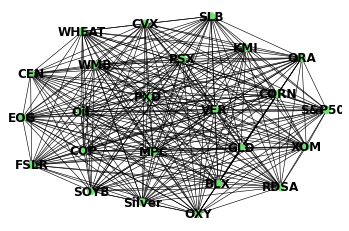

-------model initialization-------
-------Training begin-------
day 69  Epoch  0 Training MSE:  0.013040897436439991


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 69  Epoch  20 Training MSE:  7.289658969966695e-05
day 69  Epoch  40 Training MSE:  8.31906345410971e-06
day 69  Epoch  60 Training MSE:  1.2299655054448522e-06
day 69  Epoch  80 Training MSE:  1.3537619736325723e-07
-------Testing begin-------
day 69  Test MSE:  4.860668241235544e-07
Test Data Truth:  tensor([[0.0439, 0.0494, 0.0434, 0.0500, 0.0372, 0.0505, 0.0502, 0.0578, 0.0391,
         0.0458, 0.0419, 0.0409, 0.0546, 0.0571, 0.0378, 0.0473, 0.0450, 0.0435,
         0.0518, 0.0508, 0.0486, 0.0447, 0.0433, 0.0442]])
Test Data prediction tensor([0.0444, 0.0487, 0.0439, 0.0510, 0.0376, 0.0516, 0.0509, 0.0582, 0.0400,
        0.0467, 0.0423, 0.0421, 0.0559, 0.0579, 0.0372, 0.0478, 0.0445, 0.0437,
        0.0521, 0.0510, 0.0493, 0.0439, 0.0437, 0.0441],
       grad_fn=<SliceBackward>)
day 69  Training time: 8.22361445426941
=================================Day  69 ======================================
-------data prepare-------
572
labels      OXY_Value  CVX_Value  XOM_Value  ...  

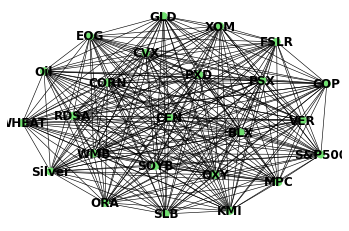

-------model initialization-------
-------Training begin-------
day 70  Epoch  0 Training MSE:  0.007059568539261818


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 70  Epoch  20 Training MSE:  5.743746805819683e-05
day 70  Epoch  40 Training MSE:  3.422453801249503e-06
day 70  Epoch  60 Training MSE:  1.7005985455398331e-06
day 70  Epoch  80 Training MSE:  2.108537273670663e-07
-------Testing begin-------
day 70  Test MSE:  3.3668354149085644e-07
Test Data Truth:  tensor([[0.0443, 0.0486, 0.0431, 0.0498, 0.0370, 0.0505, 0.0501, 0.0583, 0.0387,
         0.0450, 0.0418, 0.0410, 0.0551, 0.0569, 0.0378, 0.0479, 0.0450, 0.0435,
         0.0523, 0.0507, 0.0487, 0.0448, 0.0433, 0.0439]])
Test Data prediction tensor([0.0446, 0.0491, 0.0433, 0.0493, 0.0368, 0.0502, 0.0503, 0.0574, 0.0390,
        0.0459, 0.0413, 0.0398, 0.0538, 0.0571, 0.0377, 0.0469, 0.0446, 0.0430,
        0.0516, 0.0508, 0.0482, 0.0444, 0.0434, 0.0442],
       grad_fn=<SliceBackward>)
day 70  Training time: 8.294010877609253
=================================Day  70 ======================================
-------data prepare-------
572
labels      OXY_Value  CVX_Value  XOM_Value  ...

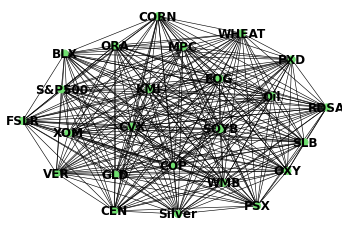

-------model initialization-------
-------Training begin-------
day 71  Epoch  0 Training MSE:  0.01187840849161148


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 71  Epoch  20 Training MSE:  8.101526327664033e-05
day 71  Epoch  40 Training MSE:  2.2276717572822236e-05
day 71  Epoch  60 Training MSE:  2.4679141006345162e-06
day 71  Epoch  80 Training MSE:  2.326136836927617e-06
-------Testing begin-------
day 71  Test MSE:  2.2613630790147e-06
Test Data Truth:  tensor([[0.0451, 0.0487, 0.0429, 0.0497, 0.0374, 0.0506, 0.0502, 0.0585, 0.0391,
         0.0454, 0.0421, 0.0413, 0.0545, 0.0568, 0.0383, 0.0478, 0.0453, 0.0445,
         0.0526, 0.0508, 0.0494, 0.0448, 0.0432, 0.0438]])
Test Data prediction tensor([0.0437, 0.0475, 0.0428, 0.0516, 0.0391, 0.0479, 0.0491, 0.0582, 0.0377,
        0.0434, 0.0417, 0.0394, 0.0546, 0.0572, 0.0390, 0.0475, 0.0436, 0.0424,
        0.0526, 0.0477, 0.0469, 0.0455, 0.0435, 0.0449],
       grad_fn=<SliceBackward>)
day 71  Training time: 8.26710033416748
=================================Day  71 ======================================
-------data prepare-------
572
labels      OXY_Value  CVX_Value  XOM_Value  ...  S

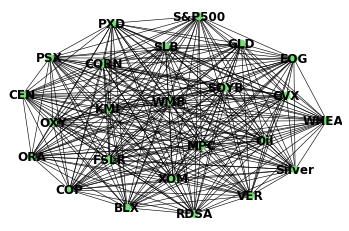

-------model initialization-------
-------Training begin-------
day 72  Epoch  0 Training MSE:  0.010022575967013836


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 72  Epoch  20 Training MSE:  5.065814548288472e-05
day 72  Epoch  40 Training MSE:  4.971734142600326e-06
day 72  Epoch  60 Training MSE:  2.040171466433094e-06
day 72  Epoch  80 Training MSE:  4.290044159915851e-07
-------Testing begin-------
day 72  Test MSE:  4.5283908889359736e-07
Test Data Truth:  tensor([[0.0447, 0.0487, 0.0431, 0.0496, 0.0373, 0.0505, 0.0502, 0.0582, 0.0392,
         0.0455, 0.0419, 0.0410, 0.0544, 0.0576, 0.0383, 0.0483, 0.0452, 0.0445,
         0.0538, 0.0507, 0.0499, 0.0443, 0.0425, 0.0441]])
Test Data prediction tensor([0.0455, 0.0492, 0.0426, 0.0495, 0.0375, 0.0511, 0.0499, 0.0580, 0.0389,
        0.0456, 0.0417, 0.0411, 0.0544, 0.0556, 0.0384, 0.0476, 0.0451, 0.0442,
        0.0525, 0.0505, 0.0493, 0.0444, 0.0441, 0.0442],
       grad_fn=<SliceBackward>)
day 72  Training time: 8.471026182174683
=================================Day  72 ======================================
-------data prepare-------
572
labels      OXY_Value  CVX_Value  XOM_Value  ... 

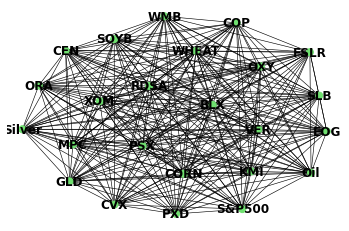

-------model initialization-------
-------Training begin-------
day 73  Epoch  0 Training MSE:  0.014663677662611008


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 73  Epoch  20 Training MSE:  7.187153096310794e-05
day 73  Epoch  40 Training MSE:  1.0565366210357752e-05
day 73  Epoch  60 Training MSE:  1.7226248019142076e-06
day 73  Epoch  80 Training MSE:  2.953121622795152e-07
-------Testing begin-------
day 73  Test MSE:  1.4572368911558442e-07
Test Data Truth:  tensor([[0.0447, 0.0488, 0.0432, 0.0496, 0.0374, 0.0506, 0.0507, 0.0586, 0.0388,
         0.0454, 0.0421, 0.0416, 0.0543, 0.0568, 0.0384, 0.0484, 0.0450, 0.0438,
         0.0543, 0.0506, 0.0505, 0.0444, 0.0427, 0.0443]])
Test Data prediction tensor([0.0445, 0.0487, 0.0427, 0.0498, 0.0376, 0.0506, 0.0500, 0.0585, 0.0392,
        0.0455, 0.0417, 0.0407, 0.0542, 0.0575, 0.0383, 0.0484, 0.0454, 0.0444,
        0.0541, 0.0506, 0.0500, 0.0446, 0.0429, 0.0441],
       grad_fn=<SliceBackward>)
day 73  Training time: 8.26267123222351
=================================Day  73 ======================================
-------data prepare-------
572
labels      OXY_Value  CVX_Value  XOM_Value  ...

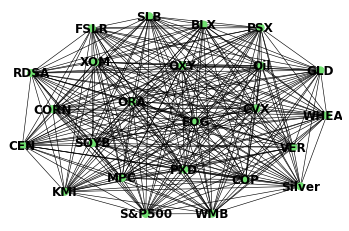

-------model initialization-------
-------Training begin-------
day 74  Epoch  0 Training MSE:  0.016019215807318687


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 74  Epoch  20 Training MSE:  5.4600252042291686e-05
day 74  Epoch  40 Training MSE:  7.036602255539037e-06
day 74  Epoch  60 Training MSE:  1.4599248743252247e-06
day 74  Epoch  80 Training MSE:  6.050415208846971e-07
-------Testing begin-------
day 74  Test MSE:  2.6889108539762674e-06
Test Data Truth:  tensor([[0.0450, 0.0492, 0.0434, 0.0498, 0.0375, 0.0506, 0.0505, 0.0583, 0.0393,
         0.0462, 0.0426, 0.0412, 0.0548, 0.0571, 0.0379, 0.0482, 0.0453, 0.0445,
         0.0546, 0.0506, 0.0515, 0.0438, 0.0425, 0.0432]])
Test Data prediction tensor([0.0458, 0.0485, 0.0454, 0.0489, 0.0354, 0.0515, 0.0501, 0.0574, 0.0374,
        0.0452, 0.0423, 0.0420, 0.0542, 0.0550, 0.0391, 0.0457, 0.0449, 0.0418,
        0.0517, 0.0507, 0.0525, 0.0444, 0.0413, 0.0472],
       grad_fn=<SliceBackward>)
day 74  Training time: 8.277764081954956
=================================Day  74 ======================================
-------data prepare-------
572
labels      OXY_Value  CVX_Value  XOM_Value  ..

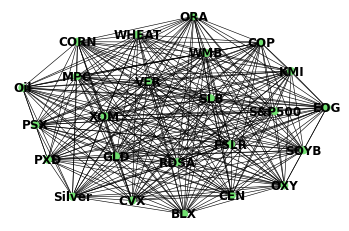

-------model initialization-------
-------Training begin-------
day 75  Epoch  0 Training MSE:  0.019788844510912895


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 75  Epoch  20 Training MSE:  5.475961006595753e-05
day 75  Epoch  40 Training MSE:  1.1265808097959962e-05
day 75  Epoch  60 Training MSE:  1.8895931361839757e-06
day 75  Epoch  80 Training MSE:  2.0093955299671507e-07
-------Testing begin-------
day 75  Test MSE:  1.23900363746543e-07
Test Data Truth:  tensor([[0.0451, 0.0494, 0.0435, 0.0500, 0.0374, 0.0506, 0.0507, 0.0583, 0.0395,
         0.0467, 0.0426, 0.0412, 0.0554, 0.0572, 0.0378, 0.0481, 0.0453, 0.0442,
         0.0544, 0.0506, 0.0522, 0.0435, 0.0420, 0.0439]])
Test Data prediction tensor([0.0447, 0.0493, 0.0437, 0.0499, 0.0373, 0.0506, 0.0509, 0.0585, 0.0391,
        0.0464, 0.0427, 0.0413, 0.0551, 0.0572, 0.0377, 0.0482, 0.0455, 0.0445,
        0.0546, 0.0501, 0.0515, 0.0439, 0.0427, 0.0431],
       grad_fn=<SliceBackward>)
day 75  Training time: 8.268230676651001
=================================Day  75 ======================================
-------data prepare-------
572
labels      OXY_Value  CVX_Value  XOM_Value  ...

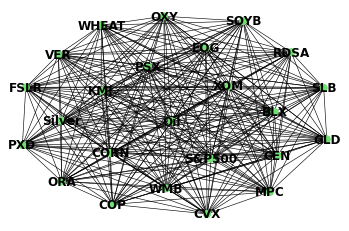

-------model initialization-------
-------Training begin-------
day 76  Epoch  0 Training MSE:  0.011300486512482166


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 76  Epoch  20 Training MSE:  3.0415603760047816e-05
day 76  Epoch  40 Training MSE:  8.145471838361118e-06
day 76  Epoch  60 Training MSE:  8.077145707829914e-07
day 76  Epoch  80 Training MSE:  3.828291937679751e-06
-------Testing begin-------
day 76  Test MSE:  2.737688419074402e-06
Test Data Truth:  tensor([[0.0449, 0.0490, 0.0434, 0.0487, 0.0371, 0.0497, 0.0503, 0.0582, 0.0390,
         0.0466, 0.0416, 0.0411, 0.0558, 0.0581, 0.0369, 0.0478, 0.0454, 0.0443,
         0.0550, 0.0503, 0.0522, 0.0443, 0.0421, 0.0432]])
Test Data prediction tensor([0.0443, 0.0504, 0.0423, 0.0480, 0.0381, 0.0513, 0.0502, 0.0589, 0.0378,
        0.0445, 0.0440, 0.0402, 0.0533, 0.0561, 0.0358, 0.0476, 0.0432, 0.0424,
        0.0515, 0.0514, 0.0510, 0.0437, 0.0421, 0.0464],
       grad_fn=<SliceBackward>)
day 76  Training time: 8.15283989906311
=================================Day  76 ======================================
-------data prepare-------
572
labels      OXY_Value  CVX_Value  XOM_Value  ...  

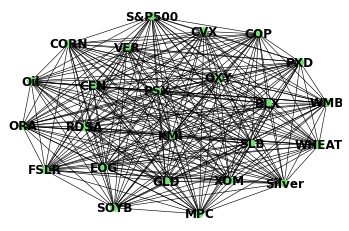

-------model initialization-------
-------Training begin-------
day 77  Epoch  0 Training MSE:  0.01657266728579998


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 77  Epoch  20 Training MSE:  4.612575503415428e-05
day 77  Epoch  40 Training MSE:  1.2573928870551754e-05
day 77  Epoch  60 Training MSE:  1.2580795782923815e-06
day 77  Epoch  80 Training MSE:  2.3777118940415676e-07
-------Testing begin-------
day 77  Test MSE:  1.8091628817273886e-06
Test Data Truth:  tensor([[0.0454, 0.0494, 0.0437, 0.0497, 0.0376, 0.0497, 0.0510, 0.0585, 0.0391,
         0.0472, 0.0418, 0.0405, 0.0562, 0.0586, 0.0363, 0.0485, 0.0455, 0.0442,
         0.0575, 0.0507, 0.0521, 0.0441, 0.0419, 0.0433]])
Test Data prediction tensor([0.0455, 0.0485, 0.0427, 0.0491, 0.0361, 0.0506, 0.0516, 0.0601, 0.0389,
        0.0458, 0.0390, 0.0423, 0.0558, 0.0587, 0.0378, 0.0481, 0.0464, 0.0432,
        0.0539, 0.0503, 0.0516, 0.0455, 0.0429, 0.0443],
       grad_fn=<SliceBackward>)
day 77  Training time: 8.313102960586548
=================================Day  77 ======================================
-------data prepare-------
572
labels      OXY_Value  CVX_Value  XOM_Value  .

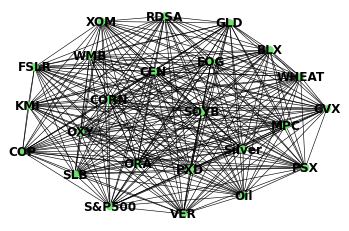

-------model initialization-------
-------Training begin-------
day 78  Epoch  0 Training MSE:  0.01427964586764574


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 78  Epoch  20 Training MSE:  3.924256088794209e-05
day 78  Epoch  40 Training MSE:  6.013404345139861e-06
day 78  Epoch  60 Training MSE:  1.7011524278132129e-06
day 78  Epoch  80 Training MSE:  7.11510665496462e-07
-------Testing begin-------
day 78  Test MSE:  5.068700374977197e-07
Test Data Truth:  tensor([[0.0461, 0.0497, 0.0440, 0.0503, 0.0375, 0.0500, 0.0514, 0.0577, 0.0385,
         0.0472, 0.0418, 0.0402, 0.0564, 0.0566, 0.0363, 0.0484, 0.0452, 0.0439,
         0.0576, 0.0505, 0.0519, 0.0450, 0.0427, 0.0439]])
Test Data prediction tensor([0.0462, 0.0494, 0.0435, 0.0492, 0.0383, 0.0502, 0.0501, 0.0585, 0.0389,
        0.0479, 0.0427, 0.0412, 0.0560, 0.0582, 0.0366, 0.0492, 0.0447, 0.0435,
        0.0579, 0.0512, 0.0522, 0.0444, 0.0422, 0.0434],
       grad_fn=<SliceBackward>)
day 78  Training time: 8.207721710205078
=================================Day  78 ======================================
-------data prepare-------
572
labels      OXY_Value  CVX_Value  XOM_Value  ...  

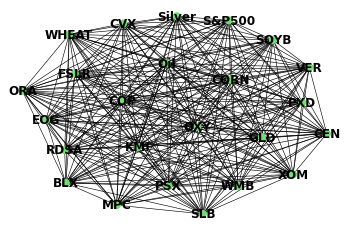

-------model initialization-------
-------Training begin-------
day 79  Epoch  0 Training MSE:  0.01664016954600811


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 79  Epoch  20 Training MSE:  4.463124423637055e-05
day 79  Epoch  40 Training MSE:  6.7781579673464876e-06
day 79  Epoch  60 Training MSE:  1.2483925274864305e-05
day 79  Epoch  80 Training MSE:  1.7779899508241215e-06
-------Testing begin-------
day 79  Test MSE:  2.7289943318464793e-06
Test Data Truth:  tensor([[0.0464, 0.0505, 0.0445, 0.0504, 0.0380, 0.0510, 0.0529, 0.0589, 0.0396,
         0.0484, 0.0432, 0.0399, 0.0567, 0.0586, 0.0376, 0.0486, 0.0452, 0.0442,
         0.0572, 0.0507, 0.0513, 0.0449, 0.0428, 0.0433]])
Test Data prediction tensor([0.0451, 0.0514, 0.0440, 0.0506, 0.0366, 0.0497, 0.0495, 0.0587, 0.0378,
        0.0462, 0.0409, 0.0410, 0.0560, 0.0560, 0.0354, 0.0468, 0.0431, 0.0432,
        0.0594, 0.0520, 0.0511, 0.0462, 0.0432, 0.0411],
       grad_fn=<SliceBackward>)
day 79  Training time: 8.178603410720825
=================================Day  79 ======================================
-------data prepare-------
572
labels      OXY_Value  CVX_Value  XOM_Value  .

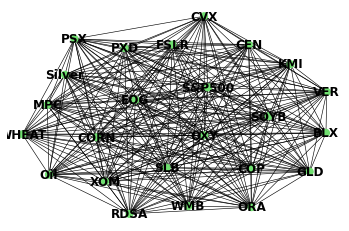

-------model initialization-------
-------Training begin-------
day 80  Epoch  0 Training MSE:  0.010918735526502132


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 80  Epoch  20 Training MSE:  4.6224547986639664e-05
day 80  Epoch  40 Training MSE:  7.623236797371646e-06
day 80  Epoch  60 Training MSE:  9.529640010441653e-07
day 80  Epoch  80 Training MSE:  1.780394853767575e-07
-------Testing begin-------
day 80  Test MSE:  5.096209747534886e-07
Test Data Truth:  tensor([[0.0463, 0.0507, 0.0446, 0.0513, 0.0391, 0.0512, 0.0529, 0.0591, 0.0400,
         0.0488, 0.0435, 0.0403, 0.0557, 0.0569, 0.0388, 0.0484, 0.0454, 0.0443,
         0.0577, 0.0509, 0.0513, 0.0449, 0.0429, 0.0436]])
Test Data prediction tensor([0.0472, 0.0508, 0.0448, 0.0505, 0.0381, 0.0521, 0.0531, 0.0595, 0.0401,
        0.0479, 0.0430, 0.0401, 0.0566, 0.0591, 0.0379, 0.0488, 0.0449, 0.0444,
        0.0576, 0.0510, 0.0505, 0.0451, 0.0428, 0.0431],
       grad_fn=<SliceBackward>)
day 80  Training time: 8.341529130935669
=================================Day  80 ======================================
-------data prepare-------
574
labels      OXY_Value  CVX_Value  XOM_Value  ... 

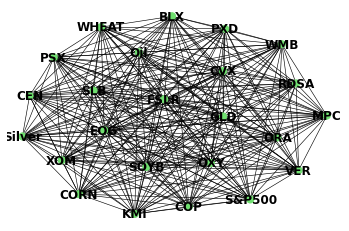

-------model initialization-------
-------Training begin-------
day 81  Epoch  0 Training MSE:  0.011785904876887798


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 81  Epoch  20 Training MSE:  2.916230005212128e-05
day 81  Epoch  40 Training MSE:  1.474621967645362e-05
day 81  Epoch  60 Training MSE:  9.29300131247146e-06
day 81  Epoch  80 Training MSE:  5.4107745199871715e-06
-------Testing begin-------
day 81  Test MSE:  8.014183663362928e-07
Test Data Truth:  tensor([[0.0462, 0.0513, 0.0447, 0.0508, 0.0390, 0.0503, 0.0528, 0.0595, 0.0396,
         0.0484, 0.0432, 0.0403, 0.0548, 0.0540, 0.0388, 0.0489, 0.0453, 0.0442,
         0.0576, 0.0509, 0.0508, 0.0453, 0.0429, 0.0435]])
Test Data prediction tensor([0.0469, 0.0502, 0.0434, 0.0522, 0.0384, 0.0505, 0.0525, 0.0584, 0.0399,
        0.0485, 0.0426, 0.0405, 0.0558, 0.0569, 0.0389, 0.0485, 0.0449, 0.0443,
        0.0572, 0.0508, 0.0518, 0.0456, 0.0437, 0.0440],
       grad_fn=<SliceBackward>)
day 81  Training time: 8.166133880615234
=================================Day  81 ======================================
-------data prepare-------
572
labels      OXY_Value  CVX_Value  XOM_Value  ...  

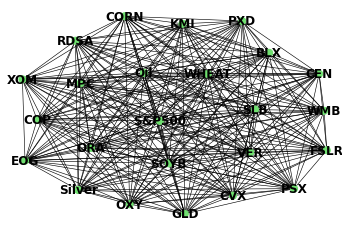

-------model initialization-------
-------Training begin-------
day 82  Epoch  0 Training MSE:  0.01569933257997036


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 82  Epoch  20 Training MSE:  7.889242260716856e-05
day 82  Epoch  40 Training MSE:  1.2024721399939153e-05
day 82  Epoch  60 Training MSE:  1.6418081258962047e-06
day 82  Epoch  80 Training MSE:  1.5717132839654369e-07
-------Testing begin-------
day 82  Test MSE:  8.199796752705879e-07
Test Data Truth:  tensor([[0.0461, 0.0511, 0.0443, 0.0508, 0.0383, 0.0502, 0.0532, 0.0607, 0.0394,
         0.0484, 0.0425, 0.0396, 0.0544, 0.0577, 0.0387, 0.0487, 0.0454, 0.0444,
         0.0563, 0.0510, 0.0501, 0.0451, 0.0425, 0.0426]])
Test Data prediction tensor([0.0460, 0.0513, 0.0447, 0.0507, 0.0391, 0.0503, 0.0527, 0.0595, 0.0395,
        0.0483, 0.0433, 0.0402, 0.0545, 0.0540, 0.0388, 0.0489, 0.0454, 0.0442,
        0.0573, 0.0509, 0.0508, 0.0454, 0.0428, 0.0435],
       grad_fn=<SliceBackward>)
day 82  Training time: 8.153671264648438
=================================Day  82 ======================================
-------data prepare-------
572
labels      OXY_Value  CVX_Value  XOM_Value  ..

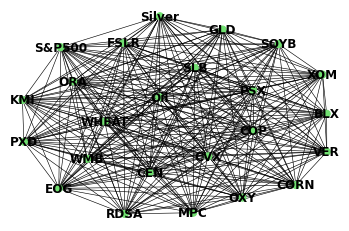

-------model initialization-------
-------Training begin-------
day 83  Epoch  0 Training MSE:  0.008938758634030819


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 83  Epoch  20 Training MSE:  3.925154669559561e-05
day 83  Epoch  40 Training MSE:  4.985640771337785e-06
day 83  Epoch  60 Training MSE:  1.4515597968056682e-06
day 83  Epoch  80 Training MSE:  5.818090812681476e-06
-------Testing begin-------
day 83  Test MSE:  1.1685739309541532e-06
Test Data Truth:  tensor([[0.0456, 0.0507, 0.0440, 0.0499, 0.0375, 0.0492, 0.0529, 0.0597, 0.0393,
         0.0478, 0.0417, 0.0399, 0.0544, 0.0596, 0.0374, 0.0484, 0.0458, 0.0447,
         0.0545, 0.0511, 0.0490, 0.0452, 0.0422, 0.0421]])
Test Data prediction tensor([0.0467, 0.0514, 0.0446, 0.0505, 0.0389, 0.0498, 0.0533, 0.0614, 0.0390,
        0.0485, 0.0420, 0.0397, 0.0539, 0.0579, 0.0390, 0.0496, 0.0455, 0.0438,
        0.0566, 0.0515, 0.0512, 0.0454, 0.0433, 0.0430],
       grad_fn=<SliceBackward>)
day 83  Training time: 8.129971981048584
=================================Day  83 ======================================
-------data prepare-------
574
labels      OXY_Value  CVX_Value  XOM_Value  ...

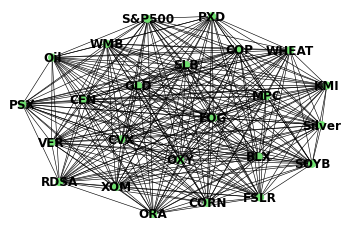

-------model initialization-------
-------Training begin-------
day 84  Epoch  0 Training MSE:  0.015609676949679852


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 84  Epoch  20 Training MSE:  4.748803621623665e-05
day 84  Epoch  40 Training MSE:  8.515057743352372e-06
day 84  Epoch  60 Training MSE:  1.2791120980182313e-06
day 84  Epoch  80 Training MSE:  3.667842065624427e-07
-------Testing begin-------
day 84  Test MSE:  1.444942881789757e-06
Test Data Truth:  tensor([[0.0457, 0.0507, 0.0441, 0.0501, 0.0375, 0.0497, 0.0530, 0.0602, 0.0399,
         0.0474, 0.0427, 0.0401, 0.0547, 0.0645, 0.0379, 0.0485, 0.0453, 0.0441,
         0.0548, 0.0515, 0.0491, 0.0451, 0.0418, 0.0422]])
Test Data prediction tensor([0.0454, 0.0503, 0.0445, 0.0502, 0.0377, 0.0483, 0.0531, 0.0594, 0.0391,
        0.0477, 0.0410, 0.0397, 0.0540, 0.0595, 0.0377, 0.0484, 0.0459, 0.0446,
        0.0541, 0.0510, 0.0482, 0.0452, 0.0419, 0.0421],
       grad_fn=<SliceBackward>)
day 84  Training time: 8.160624265670776
=================================Day  84 ======================================
-------data prepare-------
574
labels      OXY_Value  CVX_Value  XOM_Value  ... 

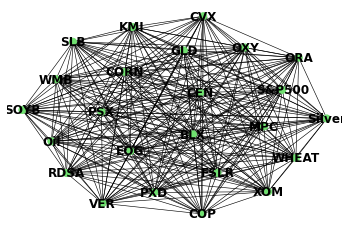

-------model initialization-------
-------Training begin-------
day 85  Epoch  0 Training MSE:  0.012705359607934952


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 85  Epoch  20 Training MSE:  5.819495709147304e-05
day 85  Epoch  40 Training MSE:  8.011891623027623e-06
day 85  Epoch  60 Training MSE:  1.992178795262589e-06
day 85  Epoch  80 Training MSE:  1.150880507339025e-06
-------Testing begin-------
day 85  Test MSE:  5.794129265268566e-07
Test Data Truth:  tensor([[0.0454, 0.0509, 0.0442, 0.0511, 0.0384, 0.0500, 0.0539, 0.0609, 0.0409,
         0.0475, 0.0431, 0.0406, 0.0543, 0.0660, 0.0386, 0.0485, 0.0454, 0.0441,
         0.0548, 0.0515, 0.0493, 0.0451, 0.0422, 0.0428]])
Test Data prediction tensor([0.0450, 0.0509, 0.0442, 0.0510, 0.0361, 0.0495, 0.0529, 0.0606, 0.0391,
        0.0474, 0.0429, 0.0403, 0.0544, 0.0656, 0.0378, 0.0483, 0.0448, 0.0440,
        0.0547, 0.0512, 0.0485, 0.0443, 0.0421, 0.0418],
       grad_fn=<SliceBackward>)
day 85  Training time: 8.243366003036499
=================================Day  85 ======================================
-------data prepare-------
574
labels      OXY_Value  CVX_Value  XOM_Value  ...  

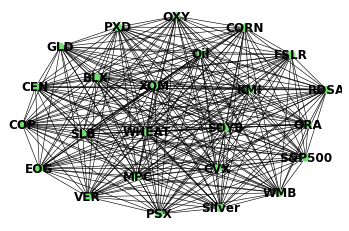

-------model initialization-------
-------Training begin-------
day 86  Epoch  0 Training MSE:  0.008320590481162071


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 86  Epoch  20 Training MSE:  8.712132694199681e-05
day 86  Epoch  40 Training MSE:  9.93052435660502e-06
day 86  Epoch  60 Training MSE:  1.0600616633382742e-06
day 86  Epoch  80 Training MSE:  2.0100843300951965e-07
-------Testing begin-------
day 86  Test MSE:  1.8851791594443057e-07
Test Data Truth:  tensor([[0.0458, 0.0511, 0.0444, 0.0512, 0.0390, 0.0504, 0.0540, 0.0606, 0.0413,
         0.0481, 0.0439, 0.0405, 0.0542, 0.0661, 0.0393, 0.0486, 0.0457, 0.0444,
         0.0549, 0.0518, 0.0492, 0.0448, 0.0425, 0.0420]])
Test Data prediction tensor([0.0453, 0.0508, 0.0442, 0.0510, 0.0384, 0.0500, 0.0540, 0.0607, 0.0410,
        0.0475, 0.0430, 0.0404, 0.0542, 0.0662, 0.0383, 0.0486, 0.0453, 0.0440,
        0.0553, 0.0514, 0.0492, 0.0453, 0.0423, 0.0426],
       grad_fn=<SliceBackward>)
day 86  Training time: 8.2000150680542
=================================Day  86 ======================================
-------data prepare-------
572
labels      OXY_Value  CVX_Value  XOM_Value  ...  

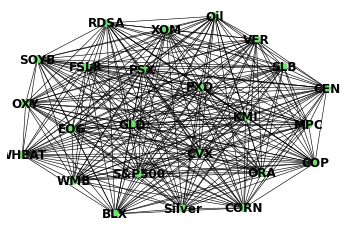

-------model initialization-------
-------Training begin-------
day 87  Epoch  0 Training MSE:  0.007420068606734276


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 87  Epoch  20 Training MSE:  7.660125265829265e-05
day 87  Epoch  40 Training MSE:  9.136586413660552e-06
day 87  Epoch  60 Training MSE:  1.6457296396765742e-06
day 87  Epoch  80 Training MSE:  2.750388432559703e-07
-------Testing begin-------
day 87  Test MSE:  5.688293072125816e-07
Test Data Truth:  tensor([[0.0461, 0.0508, 0.0442, 0.0515, 0.0388, 0.0499, 0.0537, 0.0606, 0.0408,
         0.0484, 0.0440, 0.0402, 0.0540, 0.0650, 0.0400, 0.0493, 0.0457, 0.0445,
         0.0549, 0.0518, 0.0492, 0.0451, 0.0429, 0.0426]])
Test Data prediction tensor([0.0462, 0.0505, 0.0449, 0.0513, 0.0389, 0.0507, 0.0546, 0.0593, 0.0409,
        0.0474, 0.0433, 0.0406, 0.0549, 0.0646, 0.0389, 0.0485, 0.0455, 0.0431,
        0.0536, 0.0526, 0.0499, 0.0443, 0.0431, 0.0429],
       grad_fn=<SliceBackward>)
day 87  Training time: 8.125163078308105
=================================Day  87 ======================================
-------data prepare-------
572
labels      OXY_Value  CVX_Value  XOM_Value  ... 

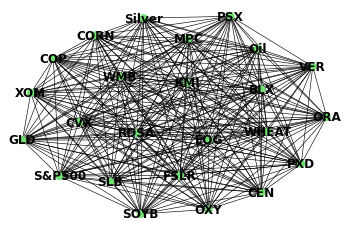

-------model initialization-------
-------Training begin-------
day 88  Epoch  0 Training MSE:  0.012722709216177464


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 88  Epoch  20 Training MSE:  6.15512763033621e-05
day 88  Epoch  40 Training MSE:  6.481689069914864e-06
day 88  Epoch  60 Training MSE:  1.5929573464745772e-06
day 88  Epoch  80 Training MSE:  2.366784457308313e-07
-------Testing begin-------
day 88  Test MSE:  1.588364000326692e-07
Test Data Truth:  tensor([[0.0461, 0.0509, 0.0444, 0.0512, 0.0382, 0.0498, 0.0542, 0.0603, 0.0410,
         0.0484, 0.0434, 0.0403, 0.0544, 0.0646, 0.0403, 0.0500, 0.0457, 0.0443,
         0.0557, 0.0517, 0.0492, 0.0453, 0.0422, 0.0421]])
Test Data prediction tensor([0.0463, 0.0507, 0.0440, 0.0517, 0.0387, 0.0500, 0.0538, 0.0605, 0.0408,
        0.0484, 0.0439, 0.0403, 0.0542, 0.0649, 0.0400, 0.0493, 0.0457, 0.0448,
        0.0549, 0.0517, 0.0495, 0.0453, 0.0429, 0.0427],
       grad_fn=<SliceBackward>)
day 88  Training time: 8.159767389297485
=================================Day  88 ======================================
-------data prepare-------
574
labels      OXY_Value  CVX_Value  XOM_Value  ...  

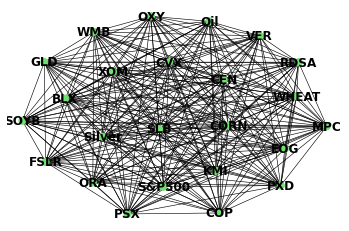

-------model initialization-------
-------Training begin-------
day 89  Epoch  0 Training MSE:  0.012183635495603085


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 89  Epoch  20 Training MSE:  6.349377508740872e-05
day 89  Epoch  40 Training MSE:  7.055151854729047e-06
day 89  Epoch  60 Training MSE:  2.490327460691333e-06
day 89  Epoch  80 Training MSE:  8.617098501417786e-07
-------Testing begin-------
day 89  Test MSE:  5.304493697622092e-07
Test Data Truth:  tensor([[0.0465, 0.0507, 0.0443, 0.0518, 0.0377, 0.0496, 0.0539, 0.0608, 0.0410,
         0.0494, 0.0433, 0.0404, 0.0531, 0.0640, 0.0404, 0.0493, 0.0458, 0.0442,
         0.0563, 0.0515, 0.0490, 0.0458, 0.0423, 0.0417]])
Test Data prediction tensor([0.0457, 0.0510, 0.0442, 0.0515, 0.0381, 0.0490, 0.0537, 0.0597, 0.0401,
        0.0480, 0.0445, 0.0400, 0.0533, 0.0634, 0.0413, 0.0501, 0.0449, 0.0446,
        0.0551, 0.0512, 0.0491, 0.0449, 0.0424, 0.0410],
       grad_fn=<SliceBackward>)
day 89  Training time: 8.184633016586304
=================================Day  89 ======================================
-------data prepare-------
574
labels      OXY_Value  CVX_Value  XOM_Value  ...  

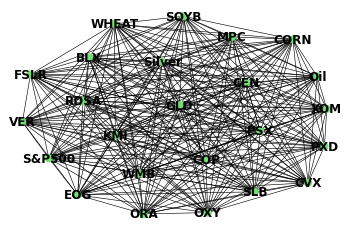

-------model initialization-------
-------Training begin-------
day 90  Epoch  0 Training MSE:  0.007602052763104439


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 90  Epoch  20 Training MSE:  8.006892312550917e-05
day 90  Epoch  40 Training MSE:  5.166419668967137e-06
day 90  Epoch  60 Training MSE:  1.3242855629869155e-06
day 90  Epoch  80 Training MSE:  7.475772179077467e-08
-------Testing begin-------
day 90  Test MSE:  2.0920703036608757e-07
Test Data Truth:  tensor([[0.0465, 0.0508, 0.0444, 0.0517, 0.0375, 0.0491, 0.0541, 0.0618, 0.0412,
         0.0495, 0.0431, 0.0405, 0.0535, 0.0650, 0.0408, 0.0497, 0.0459, 0.0439,
         0.0566, 0.0516, 0.0486, 0.0455, 0.0422, 0.0410]])
Test Data prediction tensor([0.0464, 0.0507, 0.0443, 0.0518, 0.0375, 0.0497, 0.0538, 0.0606, 0.0411,
        0.0494, 0.0434, 0.0405, 0.0532, 0.0640, 0.0403, 0.0496, 0.0458, 0.0443,
        0.0562, 0.0516, 0.0493, 0.0458, 0.0422, 0.0417],
       grad_fn=<SliceBackward>)
day 90  Training time: 8.086467742919922
=================================Day  90 ======================================
-------data prepare-------
574
labels      OXY_Value  CVX_Value  XOM_Value  ...

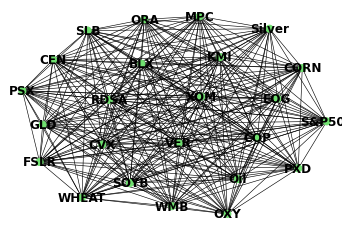

-------model initialization-------
-------Training begin-------
day 91  Epoch  0 Training MSE:  0.01059322152286768


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 91  Epoch  20 Training MSE:  6.472036329796538e-05
day 91  Epoch  40 Training MSE:  1.113082907977514e-05
day 91  Epoch  60 Training MSE:  2.775915845631971e-06
day 91  Epoch  80 Training MSE:  2.75783435199628e-07
-------Testing begin-------
day 91  Test MSE:  1.887145481305197e-05
Test Data Truth:  tensor([[0.0468, 0.0508, 0.0443, 0.0519, 0.0384, 0.0498, 0.0542, 0.0621, 0.0414,
         0.0502, 0.0441, 0.0410, 0.0545, 0.0666, 0.0404, 0.0504, 0.0455, 0.0430,
         0.0569, 0.0518, 0.0502, 0.0451, 0.0421, 0.0405]])
Test Data prediction tensor([0.0431, 0.0573, 0.0425, 0.0482, 0.0410, 0.0470, 0.0588, 0.0647, 0.0379,
        0.0511, 0.0424, 0.0416, 0.0514, 0.0643, 0.0443, 0.0563, 0.0523, 0.0496,
        0.0623, 0.0553, 0.0427, 0.0423, 0.0466, 0.0467],
       grad_fn=<SliceBackward>)
day 91  Training time: 8.201531648635864
=================================Day  91 ======================================
-------data prepare-------
574
labels      OXY_Value  CVX_Value  XOM_Value  ...  S

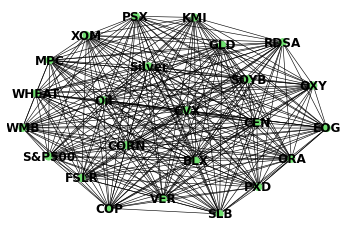

-------model initialization-------
-------Training begin-------
day 92  Epoch  0 Training MSE:  0.011726527474820614


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 92  Epoch  20 Training MSE:  8.725799125386402e-05
day 92  Epoch  40 Training MSE:  9.028653948917054e-06
day 92  Epoch  60 Training MSE:  9.894674803945236e-07
day 92  Epoch  80 Training MSE:  3.3975820201703755e-07
-------Testing begin-------
day 92  Test MSE:  1.3399895806287532e-06
Test Data Truth:  tensor([[0.0467, 0.0508, 0.0441, 0.0522, 0.0389, 0.0505, 0.0537, 0.0609, 0.0412,
         0.0501, 0.0443, 0.0402, 0.0543, 0.0652, 0.0400, 0.0456, 0.0452, 0.0427,
         0.0566, 0.0520, 0.0503, 0.0450, 0.0423, 0.0403]])
Test Data prediction tensor([0.0466, 0.0507, 0.0446, 0.0515, 0.0387, 0.0493, 0.0542, 0.0618, 0.0416,
        0.0502, 0.0441, 0.0413, 0.0544, 0.0667, 0.0405, 0.0504, 0.0466, 0.0429,
        0.0572, 0.0516, 0.0505, 0.0449, 0.0424, 0.0406],
       grad_fn=<SliceBackward>)
day 92  Training time: 8.297882080078125
=================================Day  92 ======================================
-------data prepare-------
574
labels      OXY_Value  CVX_Value  XOM_Value  ...

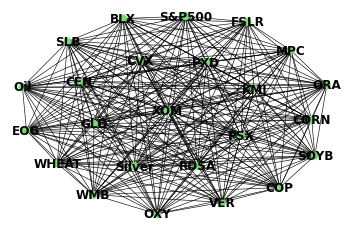

-------model initialization-------
-------Training begin-------
day 93  Epoch  0 Training MSE:  0.010143778286874294


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 93  Epoch  20 Training MSE:  6.82547761243768e-05
day 93  Epoch  40 Training MSE:  6.11142604611814e-06
day 93  Epoch  60 Training MSE:  1.0915110806308803e-06
day 93  Epoch  80 Training MSE:  1.817657704350495e-07
-------Testing begin-------
day 93  Test MSE:  5.322461333889805e-07
Test Data Truth:  tensor([[0.0474, 0.0513, 0.0443, 0.0538, 0.0394, 0.0516, 0.0546, 0.0617, 0.0408,
         0.0500, 0.0462, 0.0397, 0.0547, 0.0648, 0.0392, 0.0459, 0.0451, 0.0425,
         0.0569, 0.0523, 0.0501, 0.0446, 0.0419, 0.0398]])
Test Data prediction tensor([0.0463, 0.0512, 0.0442, 0.0524, 0.0392, 0.0504, 0.0539, 0.0605, 0.0411,
        0.0499, 0.0445, 0.0404, 0.0542, 0.0656, 0.0399, 0.0454, 0.0450, 0.0424,
        0.0566, 0.0522, 0.0500, 0.0450, 0.0426, 0.0404],
       grad_fn=<SliceBackward>)
day 93  Training time: 8.607737302780151
=================================Day  93 ======================================
-------data prepare-------
576
labels      OXY_Value  CVX_Value  XOM_Value  ...  S

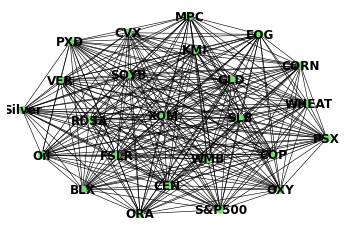

-------model initialization-------
-------Training begin-------
day 94  Epoch  0 Training MSE:  0.011211150325834751


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 94  Epoch  20 Training MSE:  7.997210923349485e-05
day 94  Epoch  40 Training MSE:  9.765452887222636e-06
day 94  Epoch  60 Training MSE:  1.4471384019998368e-06
day 94  Epoch  80 Training MSE:  1.7887278147554753e-07
-------Testing begin-------
day 94  Test MSE:  1.454704374737048e-06
Test Data Truth:  tensor([[0.0478, 0.0529, 0.0448, 0.0555, 0.0410, 0.0530, 0.0542, 0.0624, 0.0415,
         0.0505, 0.0467, 0.0397, 0.0552, 0.0652, 0.0395, 0.0461, 0.0452, 0.0424,
         0.0570, 0.0523, 0.0502, 0.0443, 0.0418, 0.0441]])
Test Data prediction tensor([0.0479, 0.0514, 0.0441, 0.0538, 0.0396, 0.0513, 0.0550, 0.0616, 0.0408,
        0.0501, 0.0463, 0.0396, 0.0546, 0.0651, 0.0390, 0.0460, 0.0448, 0.0420,
        0.0572, 0.0526, 0.0491, 0.0446, 0.0424, 0.0396],
       grad_fn=<SliceBackward>)
day 94  Training time: 8.64095425605774
=================================Day  94 ======================================
-------data prepare-------
576
labels      OXY_Value  CVX_Value  XOM_Value  ... 

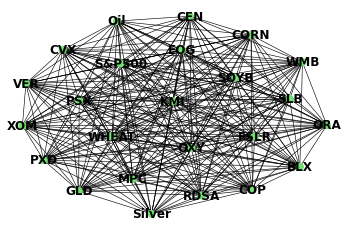

-------model initialization-------
-------Training begin-------
day 95  Epoch  0 Training MSE:  0.013739277608692646


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 95  Epoch  20 Training MSE:  6.358645623549819e-05
day 95  Epoch  40 Training MSE:  9.56448093347717e-06
day 95  Epoch  60 Training MSE:  1.1883404340551351e-06
day 95  Epoch  80 Training MSE:  8.80047252849181e-07
-------Testing begin-------
day 95  Test MSE:  6.774052394575847e-07
Test Data Truth:  tensor([[0.0481, 0.0530, 0.0449, 0.0550, 0.0407, 0.0533, 0.0547, 0.0624, 0.0415,
         0.0505, 0.0473, 0.0400, 0.0552, 0.0649, 0.0395, 0.0458, 0.0449, 0.0418,
         0.0569, 0.0523, 0.0507, 0.0445, 0.0420, 0.0441]])
Test Data prediction tensor([0.0477, 0.0532, 0.0452, 0.0557, 0.0399, 0.0523, 0.0531, 0.0629, 0.0416,
        0.0495, 0.0457, 0.0390, 0.0557, 0.0659, 0.0393, 0.0467, 0.0443, 0.0432,
        0.0567, 0.0527, 0.0509, 0.0432, 0.0418, 0.0443],
       grad_fn=<SliceBackward>)
day 95  Training time: 8.760855674743652
=================================Day  95 ======================================
-------data prepare-------
576
labels      OXY_Value  CVX_Value  XOM_Value  ...  S

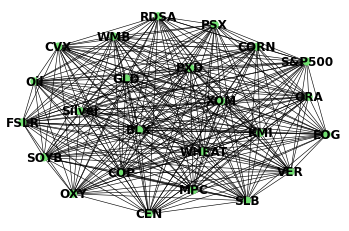

-------model initialization-------
-------Training begin-------
day 96  Epoch  0 Training MSE:  0.015630178153514862


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 96  Epoch  20 Training MSE:  6.366719026118517e-05
day 96  Epoch  40 Training MSE:  7.148391887312755e-06
day 96  Epoch  60 Training MSE:  3.2422842650703387e-06
day 96  Epoch  80 Training MSE:  1.780159436748363e-06
-------Testing begin-------
day 96  Test MSE:  1.8044174794340506e-06
Test Data Truth:  tensor([[0.0485, 0.0534, 0.0449, 0.0557, 0.0408, 0.0545, 0.0551, 0.0628, 0.0416,
         0.0508, 0.0481, 0.0402, 0.0554, 0.0642, 0.0397, 0.0455, 0.0447, 0.0414,
         0.0578, 0.0520, 0.0506, 0.0440, 0.0420, 0.0441]])
Test Data prediction tensor([0.0489, 0.0540, 0.0436, 0.0558, 0.0403, 0.0540, 0.0570, 0.0637, 0.0424,
        0.0519, 0.0487, 0.0382, 0.0555, 0.0666, 0.0381, 0.0473, 0.0455, 0.0435,
        0.0598, 0.0538, 0.0517, 0.0428, 0.0434, 0.0452],
       grad_fn=<SliceBackward>)
day 96  Training time: 8.522856950759888
=================================Day  96 ======================================
-------data prepare-------
576
labels      OXY_Value  CVX_Value  XOM_Value  ...

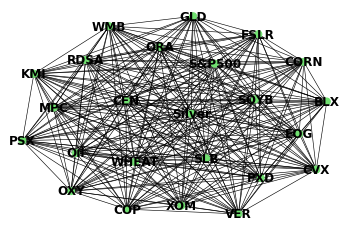

-------model initialization-------
-------Training begin-------
day 97  Epoch  0 Training MSE:  0.014334042556583881


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 97  Epoch  20 Training MSE:  8.010398596525192e-05
day 97  Epoch  40 Training MSE:  5.496999165188754e-06
day 97  Epoch  60 Training MSE:  1.0595221056064474e-06
day 97  Epoch  80 Training MSE:  1.6092208454665524e-07
-------Testing begin-------
day 97  Test MSE:  3.148431062527379e-07
Test Data Truth:  tensor([[0.0483, 0.0533, 0.0449, 0.0551, 0.0410, 0.0540, 0.0553, 0.0624, 0.0416,
         0.0506, 0.0477, 0.0401, 0.0558, 0.0649, 0.0400, 0.0453, 0.0442, 0.0409,
         0.0568, 0.0523, 0.0504, 0.0439, 0.0432, 0.0430]])
Test Data prediction tensor([0.0484, 0.0536, 0.0448, 0.0558, 0.0409, 0.0546, 0.0550, 0.0627, 0.0417,
        0.0507, 0.0480, 0.0401, 0.0555, 0.0642, 0.0398, 0.0455, 0.0451, 0.0413,
        0.0580, 0.0521, 0.0509, 0.0438, 0.0418, 0.0441],
       grad_fn=<SliceBackward>)
day 97  Training time: 8.671728372573853
=================================Day  97 ======================================
-------data prepare-------
580
labels      OXY_Value  CVX_Value  XOM_Value  ...

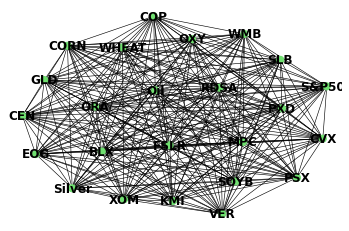

-------model initialization-------
-------Training begin-------
day 98  Epoch  0 Training MSE:  0.014018245041370392


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 98  Epoch  20 Training MSE:  3.1762454455019906e-05
day 98  Epoch  40 Training MSE:  3.5283048873679945e-06
day 98  Epoch  60 Training MSE:  2.805149051710032e-06
day 98  Epoch  80 Training MSE:  3.112144497663394e-07
-------Testing begin-------
day 98  Test MSE:  2.4346076088477275e-07
Test Data Truth:  tensor([[0.0486, 0.0533, 0.0449, 0.0547, 0.0408, 0.0540, 0.0552, 0.0624, 0.0421,
         0.0508, 0.0477, 0.0396, 0.0555, 0.0645, 0.0401, 0.0450, 0.0442, 0.0411,
         0.0568, 0.0529, 0.0500, 0.0437, 0.0432, 0.0432]])
Test Data prediction tensor([0.0489, 0.0531, 0.0442, 0.0546, 0.0406, 0.0537, 0.0559, 0.0614, 0.0413,
        0.0501, 0.0478, 0.0395, 0.0555, 0.0643, 0.0397, 0.0453, 0.0439, 0.0412,
        0.0559, 0.0532, 0.0494, 0.0429, 0.0431, 0.0433],
       grad_fn=<SliceBackward>)
day 98  Training time: 8.594080448150635
=================================Day  98 ======================================
-------data prepare-------
582
labels      OXY_Value  CVX_Value  XOM_Value  ..

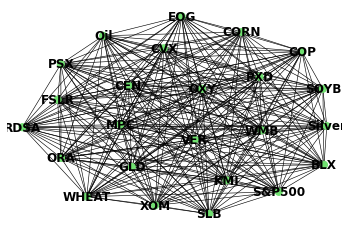

-------model initialization-------
-------Training begin-------
day 99  Epoch  0 Training MSE:  0.012828863225877285


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:446: UserWarning: Using a target size (torch.Size([1, 24])) that is different to the input size (torch.Size([24])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


day 99  Epoch  20 Training MSE:  6.82777535985224e-05
day 99  Epoch  40 Training MSE:  1.2506720850069541e-05
day 99  Epoch  60 Training MSE:  2.7217001843382604e-06
day 99  Epoch  80 Training MSE:  6.501982170448173e-07
-------Testing begin-------
day 99  Test MSE:  4.905178343506122e-07
Test Data Truth:  tensor([[0.0485, 0.0531, 0.0447, 0.0544, 0.0407, 0.0537, 0.0548, 0.0620, 0.0415,
         0.0508, 0.0478, 0.0399, 0.0553, 0.0637, 0.0407, 0.0445, 0.0441, 0.0409,
         0.0557, 0.0527, 0.0503, 0.0432, 0.0432, 0.0430]])
Test Data prediction tensor([0.0476, 0.0539, 0.0455, 0.0545, 0.0407, 0.0531, 0.0549, 0.0626, 0.0412,
        0.0496, 0.0473, 0.0384, 0.0563, 0.0639, 0.0401, 0.0441, 0.0429, 0.0420,
        0.0557, 0.0527, 0.0500, 0.0435, 0.0440, 0.0432],
       grad_fn=<SliceBackward>)
day 99  Training time: 8.631428718566895
=================================Day  99 ======================================


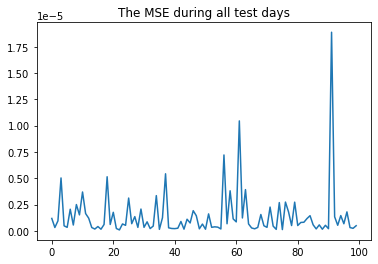

In [ ]:


PredictionAlltime=[]
GroundTruthAlltime=[]
testMse=[]
for day in range(TestDays):
#for day in [0,1,2,3,4,5]:
#for day in [0]:
  print("-------data prepare-------")
  train_x,train_y,test_x,test_y=Split_Train_Test(AllDataFrame,TestDays,day)
  
  edge_index=generateEdge(train_x)
  ##graph

  graphDrawing(edge_index,train_x,SymbolList)
 

  train_x=makeBatch(train_x,21)
  
  train_y=toTensor(outputColumn(train_y))
  test_x=makeBatch(test_x,21)
  test_y=toTensor(outputColumn(test_y))
  #print("Data Size: ",train_x.size(),train_y.size())
  
  

  print("-------model initialization-------")

  #model = Network_RNN(input_dim=input_dim, hidden_dim=hidden_dim, output_dim=output_dim, num_layers=num_layers)
  model = Network_RNNplusGNN(input_dim=input_dim, hidden_dim=hidden_dim, output_dim=output_dim, num_layers=num_layers,edge_index=edge_index)

  criterion = torch.nn.MSELoss(reduction='mean')
  optimiser = torch.optim.Adam(model.parameters(), lr=0.01)

  
  hist = np.zeros(num_epochs)
  start_time = time.time()
  lstm = []
  print("-------Training begin-------")
  for t in range(num_epochs):
      y_trainPrediction = model(train_x)
      
      loss = criterion(y_trainPrediction, train_y)

      if t%20==0:
        
        #print("day",day," Epoch ", t, "MSE: ", loss.item()," Truth: ",train_y," prediction",y_trainPrediction)
        print("day",day," Epoch ", t, "Training MSE: ", loss.item())
      
      hist[t] = loss.item()
      optimiser.zero_grad()
      loss.backward()
      optimiser.step()
  print("-------Testing begin-------")
  y_testPrediction=model(test_x)
  loss = criterion(y_trainPrediction, test_y)

  PredictionAlltime.append(y_testPrediction.detach().numpy().tolist())
  GroundTruthAlltime.append(test_y.detach().numpy().tolist())
  testMse.append(loss.item())
  
  print("day",day," Test MSE: ", loss.item())
  print("Test Data Truth: ",test_y)
  print("Test Data prediction",y_trainPrediction)
  training_time = time.time()-start_time
  print("day",day," Training time: {}".format(training_time))
  print("=================================Day ",day,"======================================")
plt.title("The MSE during all test days")
plt.plot(testMse)


  


# Performance

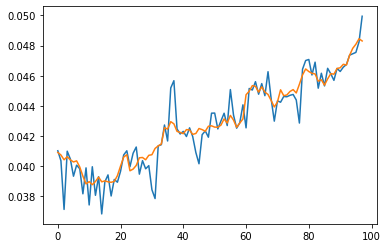

In [355]:

pred=np.array(PredictionAlltime).transpose(1,0)
truth=np.array(GroundTruthAlltime).transpose(1,2,0)



plt.plot(pred[0][1:-1])

plt.plot(truth[0][:][0][:-2])
plt.show()

# Trading Simulation

In [352]:
def BuyHoldTrading(MethodDict,price):
  AssetAmout=MethodDict['AssetStockAmout'][-1]
  AssetValue=MethodDict['AssetValue'][-1]
  MethodDict['AssetValue'].append(AssetValue)
  MethodDict['AssetStockAmout'].append(AssetAmout)
  MethodDict['Action'].append(0)
  MethodDict['TotalAssetValue'].append(MethodDict['AssetStockAmout'][-1]*price+MethodDict['AssetValue'][-1])
  return MethodDict
def Trading(prediction,testDay,target,priceList,MethodDict):

  model.eval()

  # correct = 0
  # pred = model(data).max(dim=1)[1]

  #action=pred[data.test_mask][target]
  if len(priceList)>1:
    price=priceList[-2]
  else:
    price=priceList[-1]
  pred=prediction[testDay]

  expectedReturn=(pred-price)/price
  if expectedReturn>0.02:
    action=1
  elif expectedReturn<0.02:
    action=-1
  else:
    action=0
  

  if action>0:
    ##buy
    AssetAmout=MethodDict['AssetStockAmout'][-1]+1

    AssetValue=MethodDict['AssetValue'][-1]-price


    MethodDict['AssetValue'].append(AssetValue)
    MethodDict['AssetStockAmout'].append(AssetAmout)
    MethodDict['Action'].append(action)
    MethodDict['TotalAssetValue'].append(MethodDict['AssetStockAmout'][-1]*price+MethodDict['AssetValue'][-1])

    return MethodDict
  elif action<0:
    ##sell
    AssetValue=MethodDict['AssetValue'][-1]+price*MethodDict['AssetStockAmout'][-1]

    AssetAmout=MethodDict['AssetStockAmout'][-1]-MethodDict['AssetStockAmout'][-1]
    # AssetAmout=MethodDict['AssetStockAmout'][-1]-1
    # AssetValue=MethodDict['AssetValue'][-1]+price
    


    MethodDict['AssetValue'].append(AssetValue)
    MethodDict['AssetStockAmout'].append(AssetAmout)
    MethodDict['Action'].append(action)
    MethodDict['TotalAssetValue'].append(MethodDict['AssetStockAmout'][-1]*price+MethodDict['AssetValue'][-1])
    return MethodDict
  else:
    
    AssetAmout=MethodDict['AssetStockAmout'][-1]

    AssetValue=MethodDict['AssetValue'][-1]


    MethodDict['AssetValue'].append(AssetValue)
    MethodDict['AssetStockAmout'].append(AssetAmout)
    MethodDict['Action'].append(action)
    MethodDict['TotalAssetValue'].append(MethodDict['AssetStockAmout'][-1]*price+MethodDict['AssetValue'][-1])
    return MethodDict
def UpdatePriceList(AllDailyReturnFrame,stockIndex,testDayIndex,Method,StockPriceList):
  columnsName=AllDailyReturnFrame.columns[stockIndex*2]
  if Method==1:
    TestDayReturn=AllDailyReturnFrame.loc[testDayIndex][columnsName]
  elif Method==2:
    TestDayReturn=AllDailyReturnFrame.loc[testDayIndex-1][columnsName]
  StockPrice=StockPriceList[-1]*(1+TestDayReturn)
  StockPriceList.append(StockPrice)
  return StockPriceList
def ClearPosition(MethodDict,StockPriceList):

  if MethodDict['AssetStockAmout'][-1]>0:
    MethodDict['AssetValue'].append(MethodDict['AssetValue'][-1]+StockPriceList[-1]*MethodDict['AssetStockAmout'][-1])
    MethodDict['AssetStockAmout'].append(0)
    MethodDict['Action'].append(-1)
    MethodDict['TotalAssetValue'].append(MethodDict['AssetValue'][-1]+StockPriceList[-1]*MethodDict['AssetStockAmout'][-1])
  elif MethodDict['AssetStockAmout'][-1]<0:
    MethodDict['AssetValue'].append(MethodDict['AssetValue'][-1]-StockPriceList[-1]*MethodDict['AssetStockAmout'][-1])
    MethodDict['AssetStockAmout'].append(0)
    MethodDict['Action'].append(1)
    MethodDict['TotalAssetValue'].append(MethodDict['AssetValue'][-1]-StockPriceList[-1]*MethodDict['AssetStockAmout'][-1])
  else:
    MethodDict['AssetValue'].append(MethodDict['AssetValue'][-1])
    MethodDict['AssetStockAmout'].append(0)
    MethodDict['Action'].append(0)
    MethodDict['TotalAssetValue'].append(MethodDict['TotalAssetValue'][-1])

  return MethodDict

def OpenPosition(MethodDict,StockPriceList):
  MethodDict['AssetValue'].append(0)
  MethodDict['AssetStockAmout'].append(1)
  MethodDict['Action'].append(1)
  MethodDict['TotalAssetValue'].append(1)
  return MethodDict

def TradingMethodEvaluate(testDay,prediction,StockPriceList,BuyAndHoldDict,GNNDict):
  testDayIndex=len(prediction)-(TestDays-testDay)+1
  if testDay==0: #FirstDay
    BuyAndHoldDict=OpenPosition(BuyAndHoldDict,StockPriceList)
    GNNDict=OpenPosition(GNNDict,StockPriceList)
    
    #StockPriceList=UpdatePriceList(prediction,stockIndex,testDayIndex,Method,StockPriceList)
    GNNDict=Trading(prediction,testDay,stockIndex,StockPriceList,GNNDict)
    
  elif testDay==len(prediction)-1:
    #StockPriceList=UpdatePriceList(AllDailyReturnFrame,stockIndex,testDayIndex,Method,StockPriceList)
    GNNDict=ClearPosition(GNNDict,StockPriceList)
    BuyAndHoldDict=ClearPosition(BuyAndHoldDict,StockPriceList)
  else:
    #StockPriceList=UpdatePriceList(AllDailyReturnFrame,stockIndex,testDayIndex,Method,StockPriceList)

    GNNDict=Trading(prediction,testDay,stockIndex,StockPriceList,GNNDict)
    BuyAndHoldDict=BuyHoldTrading(BuyAndHoldDict,StockPriceList[-1])
  return StockPriceList,BuyAndHoldDict,GNNDict

In [353]:
InitialAssetValue=1
InitialAssetAmout=1
AssetValue=InitialAssetValue;
AssetAmout=InitialAssetAmout;
StockPrice=1;
stockIndex=4

StockPriceList=[10]

BuyAndHoldDict={
    'AssetValue':[1],
    'AssetStockAmout':[0],
    'Action':[0],
    'TotalAssetValue':[1]
}

GNNDict={
    'AssetValue':[1],
    'AssetStockAmout':[0],
      'Action':[0],
    'TotalAssetValue':[1]
}

StockPriceList=[]
for testDay in range(TestDays):
    prediction=pred[stockIndex]
    Truth=truth[0][:][stockIndex]
    
    StockPriceList.append(Truth[testDay])
    StockPriceList,BuyAndHoldDict,GNNDict=TradingMethodEvaluate(testDay,prediction,StockPriceList,BuyAndHoldDict,GNNDict)



Text(0.5, 0, 'Date')

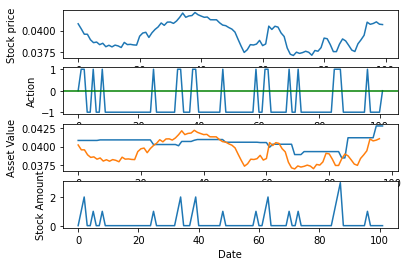

In [354]:
# fig , ax = plt.subplots()
# fig.subplots_adjust(hspace=0.1, wspace=0.1) 
# ax2 = ax.twinx()

plt.subplot(4, 1, 1)
plt.plot(StockPriceList)

plt.ylabel('Stock price')
plt.subplot(4, 1, 2)
plt.plot(GNNDict['Action'])
plt.ylabel('Action')
plt.axhline(y=0, xmin=0, xmax=1,color='g')

plt.subplot(4, 1, 3)
plt.plot(GNNDict['TotalAssetValue'][2:-2])
plt.plot(BuyAndHoldDict['TotalAssetValue'][2:-2])
plt.ylabel('Asset Value')


plt.subplot(4, 1, 4)

plt.plot(GNNDict['AssetStockAmout'])
plt.ylabel('Stock Amount')
plt.xlabel('Date')